In [1]:
# pip install python-louvain scikit-learn tqdm networkx pandas numpy scipy matplotlib seaborn

In [2]:
# Cell 1: Import required libraries
import pandas as pd

import numpy as np
import glob
import os
import matplotlib.pyplot as plt
%matplotlib inline
import networkx as nx
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.stats import linregress
import math
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, f1_score
import community
from collections import defaultdict
from tqdm.notebook import tqdm


In [3]:
# %%

# %%
# Cell 2: Read and process data
def read_period_data(period_path):
    """
    Read and combine all CSV files from a given period directory
    """
    all_files = glob.glob(os.path.join(period_path, "*", "*.csv"))
    
    if len(all_files) == 0:
        raise Exception(f"No CSV files found in {period_path}")
        
    df_list = []
    for file in all_files:
        try:
            df = pd.read_csv(file)
            df.columns = ['ticker', 'date', 'open', 'high', 'low', 'close', 'vol']
            df['date'] = pd.to_datetime(df['date'], format='%Y%m%d')
            df_list.append(df)
        except Exception as e:
            print(f"Error reading file {file}: {str(e)}")
            continue
    
    if len(df_list) == 0:
        raise Exception("No valid data files could be processed")
        
    combined_df = pd.concat(df_list, ignore_index=True)
    combined_df.sort_values(['date', 'ticker'], inplace=True)
    
    return combined_df
# Read S&P 500 list
try:
    dfsp500 = pd.read_csv('SANDP500.csv')
    print(f"Successfully read S&P 500 list with {len(dfsp500)} companies")
except Exception as e:
    raise Exception(f"Error reading S&P 500 list: {str(e)}")

# Get list of companies and sample 500 randomly
companies = dfsp500['Symbol'].tolist()
np.random.seed(42)
companies = np.random.choice(companies, size=500, replace=False)
print(f"Randomly selected {len(companies)} companies")

# Read and process data from both periods
print("\nReading data...")
period1_data = read_period_data('2007-2012')
period2_data = read_period_data('2018-2023')

# Combine data
concatenated_df = pd.concat([period1_data, period2_data], ignore_index=True)
concatenated_df = concatenated_df[concatenated_df['ticker'].isin(companies)]

# %%


Successfully read S&P 500 list with 505 companies
Randomly selected 500 companies

Reading data...


In [4]:
# %%
# Cell 3: Process price data and calculate returns
print("Starting price data processing...")

# Merge with S&P 500 data
concatenated_df = concatenated_df.merge(dfsp500, left_on='ticker', right_on='Symbol')

# Extract price data
col_p = 'close'
df_price = concatenated_df[['ticker', 'date', col_p]]
df_price = df_price.drop_duplicates(keep='last')
df_price['date'] = pd.to_datetime(df_price['date'])

# Create price matrix
df_price.set_index(['date', 'ticker'], inplace=True)
df_price = df_price.unstack()[col_p]

# Handle missing values using bfill() and ffill() instead of fillna(method=...)
df_price = df_price.bfill()
df_price = df_price.ffill()

# Calculate log returns more efficiently
# Pre-allocate the DataFrame with all columns at once
return_columns = {key: np.log(df_price[key]).diff() for key in companies if key in df_price.columns}
return_data = pd.concat(return_columns.values(), axis=1, keys=return_columns.keys())

# Remove first row with NaN values
return_data = return_data.iloc[1:]

# Set return_data as df_price for network analysis
df_price = return_data

print(f"Processed data shape: {df_price.shape}")
print(f"Date range: {df_price.index.min()} to {df_price.index.max()}")

# Print some basic statistics about the processed data
print("\nBasic statistics:")
print(f"Number of companies: {len(df_price.columns)}")
print(f"Number of trading days: {len(df_price)}")
print(f"Missing values: {df_price.isnull().sum().sum()}")

# Optional: Show summary statistics for a few companies
print("\nSample return statistics for first 5 companies:")
print(df_price.iloc[:, :5].describe())

Starting price data processing...
Processed data shape: (3017, 371)
Date range: 2007-01-04 00:00:00 to 2023-12-29 00:00:00

Basic statistics:
Number of companies: 371
Number of trading days: 3017
Missing values: 0

Sample return statistics for first 5 companies:
               BWA         MCHP          VNO          DVN         VRSN
count  3017.000000  3017.000000  3017.000000  3017.000000  3017.000000
mean      0.000333     0.000561    -0.000381    -0.000119     0.000712
std       0.027415     0.030408     0.030459     0.031971     0.029417
min      -0.146901    -0.226830    -0.278455    -0.468360    -0.168089
25%      -0.013338    -0.011727    -0.013095    -0.015083    -0.008784
50%       0.000234     0.000352     0.000000     0.000148     0.000633
75%       0.014164     0.012927     0.011948     0.015635     0.010167
max       0.390942     1.035187     0.287602     0.194470     1.058064


In [5]:

# # Cell 3: Process price data and calculate returns
# print("Starting price data processing...")

# # Merge with S&P 500 data
# concatenated_df = concatenated_df.merge(dfsp500, left_on='ticker', right_on='Symbol')

# # Extract price data
# col_p = 'close'
# df_price = concatenated_df[['ticker', 'date', col_p]]
# df_price = df_price.drop_duplicates(keep='last')
# df_price['date'] = pd.to_datetime(df_price['date'])

# # Create price matrix
# df_price.set_index(['date', 'ticker'], inplace=True)
# df_price = df_price.unstack()[col_p]

# # Handle missing values
# df_price.fillna(method='bfill', inplace=True)
# df_price.fillna(method='ffill', inplace=True)

# # Calculate log returns
# return_data = pd.DataFrame(index=df_price.index)
# for key in df_price.columns:
#     if key in companies:
#         return_data[key] = np.log(df_price[key]) - np.log(df_price[key].shift(1))

# # Remove first row with NaN values
# return_data = return_data.iloc[1:]

# # Set return_data as df_price for network analysis
# df_price = return_data

# print(f"Processed data shape: {df_price.shape}")
# print(f"Date range: {df_price.index.min()} to {df_price.index.max()}")
# # 


Analyzing network window...
Window period: 2008-09-15 00:00:00 to 2008-10-15 00:00:00
Correlation matrix shape: (371, 371)


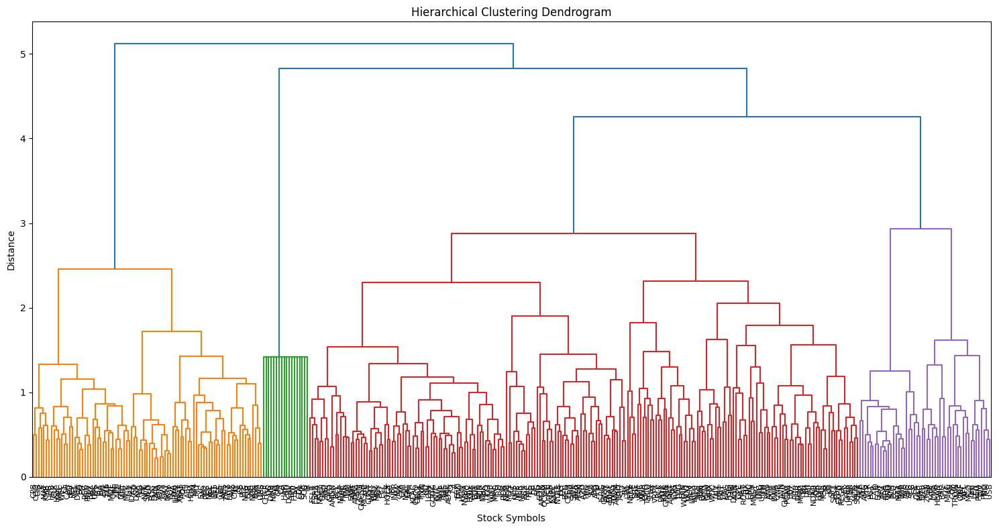


Network Summary:
Number of nodes: 371
Number of edges: 24343
Number of clusters: 48
Network density: 0.355
Average clustering coefficient: 0.684

Analyzing network window...
Window period: 2007-01-04 00:00:00 to 2007-02-01 00:00:00
Correlation matrix shape: (371, 371)


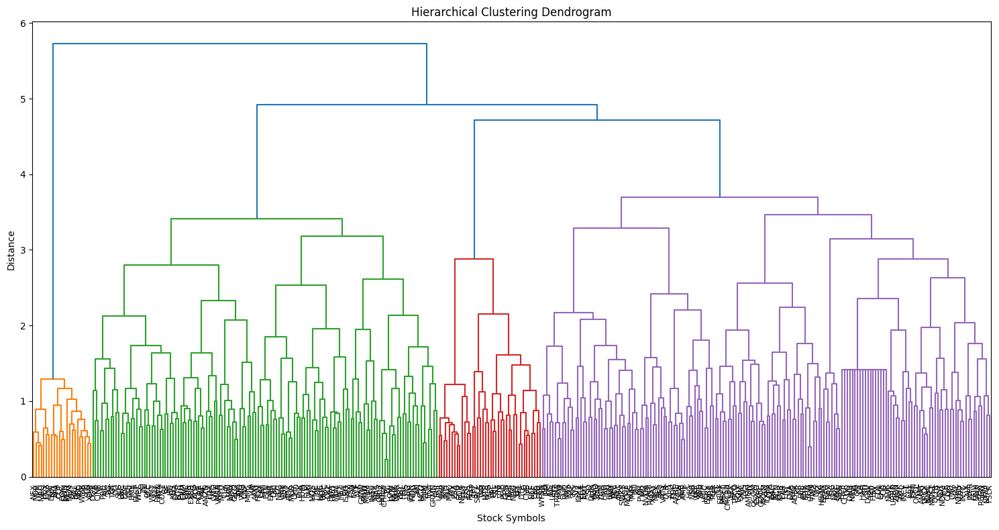


Network Summary:
Number of nodes: 371
Number of edges: 5129
Number of clusters: 239
Network density: 0.075
Average clustering coefficient: 0.355

Comparison of Crisis vs Normal Period:

n_nodes:
Crisis period: 371
Normal period: 371

n_edges:
Crisis period: 24343
Normal period: 5129

density:
Crisis period: 0.3546732716544037
Normal period: 0.07472863699278794

avg_clustering:
Crisis period: 0.6840762836920786
Normal period: 0.3547201096621192

n_clusters:
Crisis period: 48
Normal period: 239

avg_path_length:
Crisis period: inf
Normal period: inf

diameter:
Crisis period: inf
Normal period: inf

avg_within_cluster_corr:
Crisis period: 0.8095652535256135
Normal period: 0.7903940610621666

avg_between_cluster_corr:
Crisis period: 0.5587719472960793
Normal period: 0.21634656810825661

max_cluster_size:
Crisis period: 44
Normal period: 9

min_cluster_size:
Crisis period: 1
Normal period: 1

avg_cluster_size:
Crisis period: 7.729166666666667
Normal period: 1.5523012552301256


In [6]:
# %%
# Cell 4: Network Analysis Function
import networkx as nx
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import matplotlib.pyplot as plt
from scipy.stats import zscore
from itertools import combinations  # Add this import

def analyze_network_window(window_data, correlation_threshold=0.6, distance_threshold=1.0, 
                         min_cluster_size=3, show_dendrogram=False):
    """
    Analyze network for a given time window using agglomerative clustering
    with dynamic cluster determination.
    
    Parameters:
    -----------
    window_data : pandas DataFrame
        Time window of return data for analysis
    correlation_threshold : float
        Minimum absolute correlation to create an edge in the network
    distance_threshold : float
        Distance threshold for clustering
    min_cluster_size : int
        Minimum size for a valid cluster
    show_dendrogram : bool
        Whether to show the dendrogram visualization
        
    Returns:
    --------
    G : networkx Graph
        The constructed network
    metrics : dict
        Network metrics
    clusters : array
        Cluster assignments
    """
    print("\nAnalyzing network window...")
    print(f"Window period: {window_data.index[0]} to {window_data.index[-1]}")
    
    # Calculate correlation matrix
    corr_matrix = window_data.corr()
    corr_matrix.fillna(0, inplace=True)
    print(f"Correlation matrix shape: {corr_matrix.shape}")
    
    # Convert correlation to distance matrix (sqrt(2(1-ρ)))
    dist_matrix = np.sqrt(2 * (1 - corr_matrix))
    
    # Perform hierarchical clustering
    try:
        # Convert distance matrix to condensed form
        distances = dist_matrix.values[np.triu_indices(len(dist_matrix), k=1)]
        linkage_matrix = linkage(distances, method='ward')
        
        # Determine clusters
        clusters = fcluster(linkage_matrix, t=distance_threshold, criterion='distance')
        
        if show_dendrogram:
            plt.figure(figsize=(15, 8))
            dendrogram(linkage_matrix, labels=window_data.columns, 
                      leaf_rotation=90, leaf_font_size=8)
            plt.title('Hierarchical Clustering Dendrogram')
            plt.xlabel('Stock Symbols')
            plt.ylabel('Distance')
            plt.tight_layout()
            plt.show()
            
    except Exception as e:
        print(f"Error in clustering: {str(e)}")
        return None, None, None
    
    # Create network
    G = nx.Graph()
    
    # Add nodes with cluster information
    for i, company in enumerate(corr_matrix.columns):
        G.add_node(company, cluster=int(clusters[i]))
    
    # Add edges based on correlation threshold
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            if abs(corr_matrix.iloc[i,j]) > correlation_threshold:
                G.add_edge(corr_matrix.columns[i], 
                          corr_matrix.columns[j], 
                          weight=abs(corr_matrix.iloc[i,j]))
    
    # Calculate basic network metrics
    metrics = {
        'n_nodes': G.number_of_nodes(),
        'n_edges': G.number_of_edges(),
        'density': nx.density(G),
        'avg_clustering': nx.average_clustering(G),
        'n_clusters': len(set(clusters))
    }
    
    # Calculate additional network metrics
    try:
        metrics['avg_path_length'] = nx.average_shortest_path_length(G)
    except:
        metrics['avg_path_length'] = float('inf')
        
    try:
        metrics['diameter'] = nx.diameter(G)
    except:
        metrics['diameter'] = float('inf')
    
    # Calculate cluster-specific metrics
    cluster_metrics = analyze_clusters(G, clusters, corr_matrix)
    metrics.update(cluster_metrics)
    
    # Print summary statistics
    print("\nNetwork Summary:")
    print(f"Number of nodes: {metrics['n_nodes']}")
    print(f"Number of edges: {metrics['n_edges']}")
    print(f"Number of clusters: {metrics['n_clusters']}")
    print(f"Network density: {metrics['density']:.3f}")
    print(f"Average clustering coefficient: {metrics['avg_clustering']:.3f}")
    
    return G, metrics, clusters

def analyze_clusters(G, clusters, corr_matrix):
    """
    Analyze properties of individual clusters
    """
    cluster_metrics = {}
    unique_clusters = np.unique(clusters)
    
    # Calculate within-cluster and between-cluster metrics
    within_cluster_corr = []
    between_cluster_corr = []
    
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            corr = abs(corr_matrix.iloc[i,j])
            if clusters[i] == clusters[j]:
                within_cluster_corr.append(corr)
            else:
                between_cluster_corr.append(corr)
    
    cluster_metrics['avg_within_cluster_corr'] = np.mean(within_cluster_corr) if within_cluster_corr else 0
    cluster_metrics['avg_between_cluster_corr'] = np.mean(between_cluster_corr) if between_cluster_corr else 0
    
    # Calculate cluster sizes
    cluster_sizes = pd.Series(clusters).value_counts()
    cluster_metrics['max_cluster_size'] = cluster_sizes.max()
    cluster_metrics['min_cluster_size'] = cluster_sizes.min()
    cluster_metrics['avg_cluster_size'] = cluster_sizes.mean()
    
    return cluster_metrics

def analyze_crisis_window(window_data, is_crisis=False):
    """
    Analyze a specific window with appropriate parameters based on market conditions
    """
    # Adjust parameters based on market conditions
    if is_crisis:
        correlation_threshold = 0.7  # Higher correlation threshold during crisis
        distance_threshold = 1.2    # Higher distance threshold (fewer clusters)
    else:
        correlation_threshold = 0.5  # Lower correlation threshold during normal times
        distance_threshold = 0.8    # Lower distance threshold (more clusters)
    
    return analyze_network_window(window_data, 
                                correlation_threshold=correlation_threshold,
                                distance_threshold=distance_threshold,
                                show_dendrogram=True)

# Example usage
# For crisis period (e.g., 2008 financial crisis)
crisis_window = df_price['2008-09-15':'2008-10-15']  # Lehman Brothers bankruptcy period
G_crisis, metrics_crisis, clusters_crisis = analyze_crisis_window(crisis_window, is_crisis=True)

# For normal period
normal_window = df_price['2007-01-01':'2007-02-01']  # Pre-crisis period
G_normal, metrics_normal, clusters_normal = analyze_crisis_window(normal_window, is_crisis=False)

# Compare metrics
print("\nComparison of Crisis vs Normal Period:")
for metric in metrics_crisis.keys():
    if metric in metrics_normal:
        print(f"\n{metric}:")
        print(f"Crisis period: {metrics_crisis[metric]}")
        print(f"Normal period: {metrics_normal[metric]}")

Starting analysis for both periods...

Analyzing 2007-2012 Period
Number of windows to process: 96


Processing windows:   0%|          | 0/96 [00:00<?, ?it/s]


Analyzing network window...
Window period: 2007-04-05 00:00:00 to 2007-06-07 00:00:00
Correlation matrix shape: (371, 371)

Network Summary:
Number of nodes: 371
Number of edges: 1179
Number of clusters: 185
Network density: 0.017
Average clustering coefficient: 0.267

Analyzing network window...
Window period: 2007-04-26 00:00:00 to 2007-06-28 00:00:00
Correlation matrix shape: (371, 371)

Network Summary:
Number of nodes: 371
Number of edges: 2499
Number of clusters: 165
Network density: 0.036
Average clustering coefficient: 0.308

Analyzing network window...
Window period: 2007-05-17 00:00:00 to 2007-07-19 00:00:00
Correlation matrix shape: (371, 371)

Network Summary:
Number of nodes: 371
Number of edges: 3687
Number of clusters: 164
Network density: 0.054
Average clustering coefficient: 0.366

Analyzing network window...
Window period: 2007-06-07 00:00:00 to 2007-08-09 00:00:00
Correlation matrix shape: (371, 371)

Network Summary:
Number of nodes: 371
Number of edges: 9035
Numbe

Processing windows:   0%|          | 0/96 [00:00<?, ?it/s]


Analyzing network window...
Window period: 2018-04-04 00:00:00 to 2018-06-06 00:00:00
Correlation matrix shape: (371, 371)

Network Summary:
Number of nodes: 371
Number of edges: 2362
Number of clusters: 147
Network density: 0.034
Average clustering coefficient: 0.450

Analyzing network window...
Window period: 2018-04-25 00:00:00 to 2018-06-27 00:00:00
Correlation matrix shape: (371, 371)

Network Summary:
Number of nodes: 371
Number of edges: 1466
Number of clusters: 167
Network density: 0.021
Average clustering coefficient: 0.385

Analyzing network window...
Window period: 2018-05-16 00:00:00 to 2018-07-18 00:00:00
Correlation matrix shape: (371, 371)

Network Summary:
Number of nodes: 371
Number of edges: 1975
Number of clusters: 155
Network density: 0.029
Average clustering coefficient: 0.434

Analyzing network window...
Window period: 2018-06-06 00:00:00 to 2018-08-08 00:00:00
Correlation matrix shape: (371, 371)

Network Summary:
Number of nodes: 371
Number of edges: 1081
Numbe

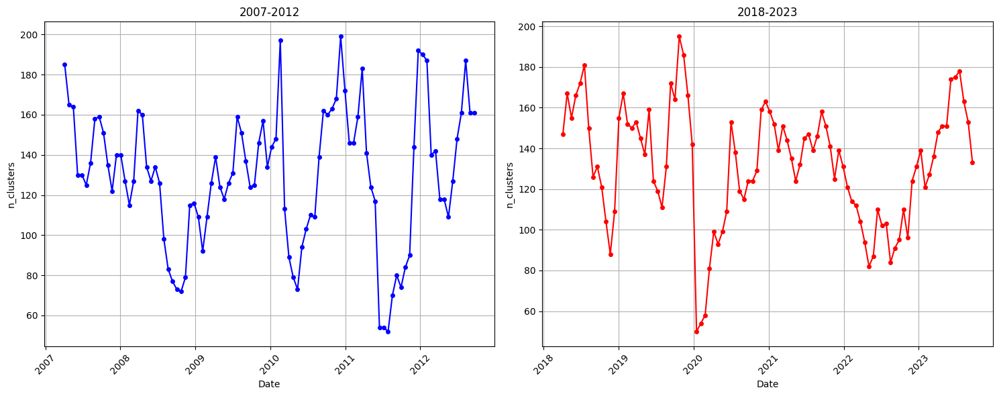


Plotting avg_clustering evolution


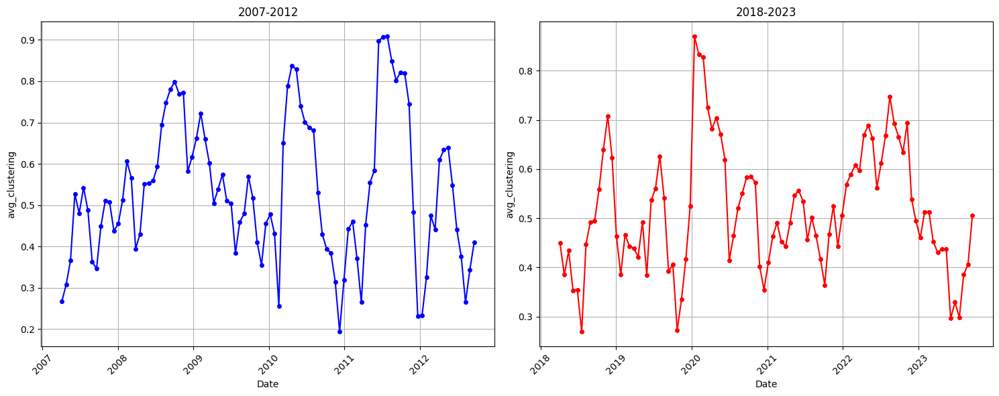


Plotting density evolution


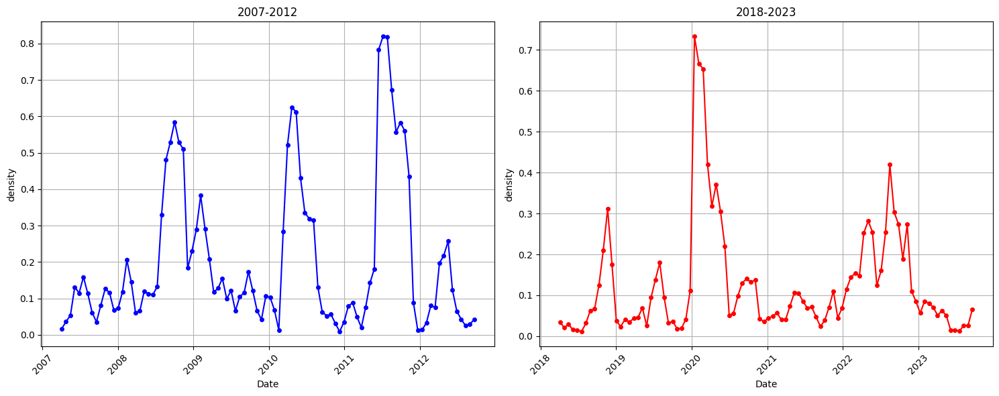


Plotting avg_within_cluster_corr evolution


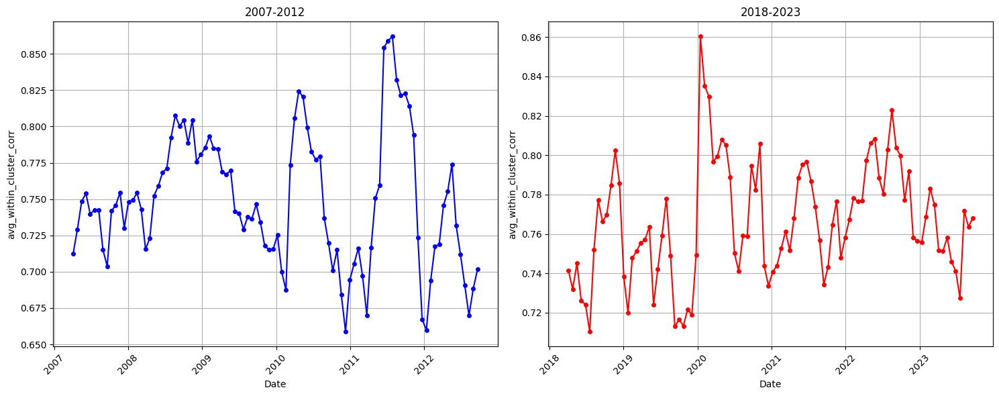


Plotting avg_between_cluster_corr evolution


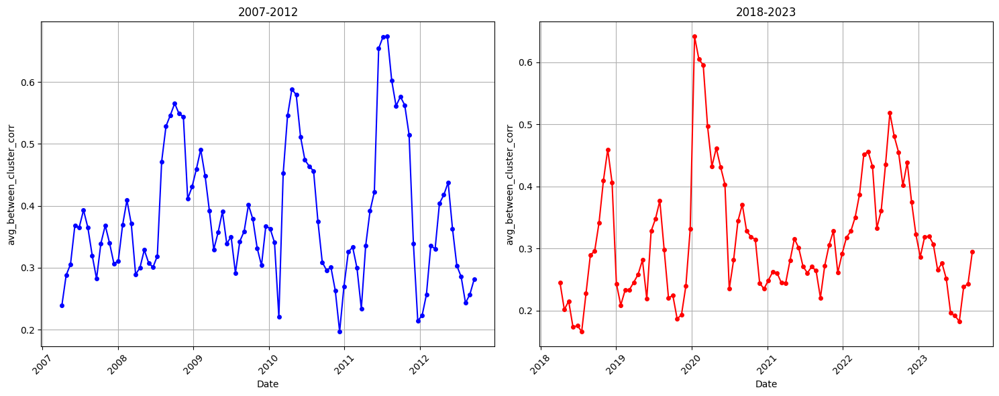


Summary Statistics for 2007-2012 Period:

n_clusters:
  Mean: 129.719
  Std:  33.987
  Min:  52.000
  Max:  199.000

avg_clustering:
  Mean: 0.536
  Std:  0.172
  Min:  0.194
  Max:  0.908

density:
  Mean: 0.202
  Std:  0.203
  Min:  0.009
  Max:  0.819

avg_within_cluster_corr:
  Mean: 0.749
  Std:  0.045
  Min:  0.659
  Max:  0.862

avg_between_cluster_corr:
  Mean: 0.384
  Std:  0.109
  Min:  0.197
  Max:  0.674

Summary Statistics for 2018-2023 Period:

n_clusters:
  Mean: 132.062
  Std:  29.391
  Min:  50.000
  Max:  195.000

avg_clustering:
  Mean: 0.514
  Std:  0.125
  Min:  0.270
  Max:  0.870

density:
  Mean: 0.125
  Std:  0.138
  Min:  0.011
  Max:  0.733

avg_within_cluster_corr:
  Mean: 0.766
  Std:  0.029
  Min:  0.710
  Max:  0.860

avg_between_cluster_corr:
  Mean: 0.314
  Std:  0.098
  Min:  0.166
  Max:  0.642

Analysis of Financial Crisis (2008-2009):
Number of windows: 9

n_clusters:
  Mean: 99.000
  Std:  19.230
  Min:  72.000
  Max:  126.000

avg_clustering:
  M

In [7]:
# %%
# Cell 5: Sliding Window Analysis for Both Periods
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from datetime import datetime

def analyze_period(df_price, period_name, window_size=63, step_size=21):
    """
    Analyze an entire period using sliding windows
    
    Parameters:
    -----------
    df_price : pandas DataFrame
        Price/returns data
    period_name : str
        Name of the period for printing
    window_size : int
        Size of the rolling window in days
    step_size : int
        Number of days to move forward each step
    """
    networks = {}
    metrics = {}
    all_clusters = {}
    
    # Find first date with sufficient data
    valid_start = df_price.index[window_size]
    
    # Create date ranges for the sliding windows
    start_dates = pd.date_range(start=valid_start, 
                              end=df_price.index[-window_size], 
                              freq=f'{step_size}D')
    
    print(f"\nAnalyzing {period_name}")
    print(f"Number of windows to process: {len(start_dates)}")
    
    # Process each window
    for start_date in tqdm(start_dates, desc="Processing windows"):
        end_date = start_date + pd.Timedelta(days=window_size)
        window_data = df_price[start_date:end_date]
        
        # Skip windows with insufficient data
        if len(window_data) < window_size/2:
            print(f"Skipping window {start_date} due to insufficient data")
            continue
            
        try:
            # Analyze the window
            G, window_metrics, clusters = analyze_network_window(
                window_data,
                correlation_threshold=0.6,  # Adjust based on your needs
                distance_threshold=1.0,     # Adjust based on your needs
                show_dendrogram=False
            )
            
            if G is not None:
                networks[start_date] = G
                metrics[start_date] = window_metrics
                all_clusters[start_date] = clusters
                
        except Exception as e:
            print(f"Error processing window starting {start_date}: {str(e)}")
            continue
    
    return networks, metrics, all_clusters

def plot_metrics_evolution(metrics1, metrics2, metric_name):
    """
    Plot the evolution of a specific metric over time for both periods
    """
    plt.figure(figsize=(15, 6))
    
    # Plot first period
    dates1 = list(metrics1.keys())
    values1 = [m[metric_name] for m in metrics1.values()]
    plt.subplot(1, 2, 1)
    plt.plot(dates1, values1, 'b-', marker='o', markersize=4)
    plt.title('2007-2012')
    plt.xlabel('Date')
    plt.ylabel(metric_name)
    plt.grid(True)
    plt.xticks(rotation=45)
    
    # Plot second period
    dates2 = list(metrics2.keys())
    values2 = [m[metric_name] for m in metrics2.values()]
    plt.subplot(1, 2, 2)
    plt.plot(dates2, values2, 'r-', marker='o', markersize=4)
    plt.title('2018-2023')
    plt.xlabel('Date')
    plt.ylabel(metric_name)
    plt.grid(True)
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

# Analyze both periods
print("Starting analysis for both periods...")

# First period (2007-2012)
period1_data = df_price['2007':'2012']
networks1, metrics1, clusters1 = analyze_period(period1_data, "2007-2012 Period")

# Second period (2018-2023)
period2_data = df_price['2018':'2023']
networks2, metrics2, clusters2 = analyze_period(period2_data, "2018-2023 Period")

# Plot evolution of various metrics
metrics_to_plot = [
    'n_clusters',
    'avg_clustering',
    'density',
    'avg_within_cluster_corr',
    'avg_between_cluster_corr'
]

for metric in metrics_to_plot:
    print(f"\nPlotting {metric} evolution")
    plot_metrics_evolution(metrics1, metrics2, metric)

# Calculate and print summary statistics for both periods
def print_period_summary(metrics_dict, period_name):
    print(f"\nSummary Statistics for {period_name}:")
    
    # Calculate statistics for each metric
    stats = {}
    for metric in metrics_to_plot:
        values = [m[metric] for m in metrics_dict.values() if metric in m]
        stats[metric] = {
            'mean': np.mean(values),
            'std': np.std(values),
            'min': np.min(values),
            'max': np.max(values)
        }
    
    # Print statistics
    for metric, stat in stats.items():
        print(f"\n{metric}:")
        print(f"  Mean: {stat['mean']:.3f}")
        print(f"  Std:  {stat['std']:.3f}")
        print(f"  Min:  {stat['min']:.3f}")
        print(f"  Max:  {stat['max']:.3f}")

# Print summaries
print_period_summary(metrics1, "2007-2012 Period")
print_period_summary(metrics2, "2018-2023 Period")

# Identify and analyze crisis periods
def analyze_crisis_windows(metrics_dict, crisis_start, crisis_end, crisis_name):
    """
    Analyze network metrics during specific crisis periods
    """
    crisis_metrics = {date: metrics for date, metrics in metrics_dict.items()
                     if crisis_start <= pd.to_datetime(date) <= crisis_end}
    
    print(f"\nAnalysis of {crisis_name}:")
    print(f"Number of windows: {len(crisis_metrics)}")
    
    for metric in metrics_to_plot:
        values = [m[metric] for m in crisis_metrics.values() if metric in m]
        if values:
            print(f"\n{metric}:")
            print(f"  Mean: {np.mean(values):.3f}")
            print(f"  Std:  {np.std(values):.3f}")
            print(f"  Min:  {np.min(values):.3f}")
            print(f"  Max:  {np.max(values):.3f}")

# Analyze Financial Crisis period
financial_crisis_start = pd.to_datetime('2008-09-15')  # Lehman bankruptcy
financial_crisis_end = pd.to_datetime('2009-03-31')    # Market bottom
analyze_crisis_windows(metrics1, financial_crisis_start, financial_crisis_end, "Financial Crisis (2008-2009)")

# Analyze COVID Crisis period
covid_crisis_start = pd.to_datetime('2020-02-20')  # Market peak
covid_crisis_end = pd.to_datetime('2020-04-07')    # Market bottom
analyze_crisis_windows(metrics2, covid_crisis_start, covid_crisis_end, "COVID Crisis (2020)")

In [8]:
# %%
# Cell 6: Enhanced Cluster Quality Metrics Analysis
def calculate_conductance(G, cluster):
    """
    Calculate conductance for a cluster.
    Conductance measures the fraction of total edge weight that points outside the cluster.
    """
    if len(cluster) == 0 or len(cluster) == len(G):
        return 1.0
    
    cut_size = nx.cut_size(G, cluster)
    volume = sum(dict(G.degree(cluster)).values())
    remaining_volume = sum(dict(G.degree()).values()) - volume
    
    if volume == 0 or remaining_volume == 0:
        return 1.0
    
    return cut_size / min(volume, remaining_volume)

def calculate_coverage(G, clusters):
    """
    Calculate coverage for all clusters
    """
    internal_edges = 0
    for cluster in clusters:
        internal_edges += G.subgraph(cluster).number_of_edges()
    return internal_edges / G.number_of_edges() if G.number_of_edges() > 0 else 0

def calculate_modularity(G, clusters):
    """
    Calculate modularity score
    """
    # Convert clusters to community format
    community_dict = {}
    for idx, cluster in enumerate(clusters):
        for node in cluster:
            community_dict[node] = idx
            
    return community.modularity(community_dict, G)

def calculate_cluster_quality(G, clusters, true_sectors):
    """
    Calculate comprehensive cluster quality metrics
    """
    # Convert clusters to list format for calculations
    cluster_list = []
    nodes = list(G.nodes())
    for cluster_id in np.unique(clusters):
        cluster_nodes = [node for i, node in enumerate(nodes) if clusters[i] == cluster_id]
        cluster_list.append(cluster_nodes)
    
    # Calculate conductance
    conductance_values = []
    for cluster in cluster_list:
        if len(cluster) > 0:
            conductance = calculate_conductance(G, cluster)
            conductance_values.append(conductance)
    avg_conductance = np.mean(conductance_values) if conductance_values else 1.0
    
    # Calculate coverage
    coverage = calculate_coverage(G, cluster_list)
    
    # Calculate modularity
    modularity = calculate_modularity(G, cluster_list)
    
    # Calculate external metrics using true sectors
    true_labels = [true_sectors.get(node, -1) for node in nodes]
    
    # Create node to cluster mapping
    node_to_cluster = {node: cluster_id for node, cluster_id in zip(nodes, clusters)}
    
    # NMI score
    nmi = normalized_mutual_info_score(true_labels, clusters)
    
    # Adjusted Rand Index
    rand_index = adjusted_rand_score(true_labels, clusters)
    
    # Average F1 score
    f1_scores = []
    unique_sectors = set(label for label in true_labels if label != -1)
    
    for sector in unique_sectors:
        # Create binary vectors of the same length
        true_binary = np.array([1 if label == sector else 0 for label in true_labels])
        pred_binary = np.zeros_like(true_binary)
        
        # For each sector, nodes in the same cluster as sector nodes get 1
        sector_clusters = set(node_to_cluster[nodes[i]] 
                            for i, label in enumerate(true_labels) 
                            if label == sector)
        
        for i, node in enumerate(nodes):
            if node_to_cluster[node] in sector_clusters:
                pred_binary[i] = 1
        
        if any(true_binary) and any(pred_binary):
            f1_scores.append(f1_score(true_binary, pred_binary))
    
    avg_f1 = np.mean(f1_scores) if f1_scores else 0.0
    
    return {
        'conductance': avg_conductance,
        'coverage': coverage,
        'modularity': modularity,
        'nmi': nmi,
        'rand_index': rand_index,
        'avg_f1': avg_f1
    }

def print_cluster_stats(G, clusters, true_sectors):
    """Helper function to print cluster statistics"""
    metrics = calculate_cluster_quality(G, clusters, true_sectors)
    print("\nCluster Quality Metrics:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.3f}")
    
    # Print cluster size distribution
    unique_clusters = np.unique(clusters)
    cluster_sizes = [sum(1 for i, node in enumerate(G.nodes()) if clusters[i] == c) 
                    for c in unique_clusters]
    print("\nCluster Size Statistics:")
    print(f"Number of clusters: {len(unique_clusters)}")
    print(f"Average cluster size: {np.mean(cluster_sizes):.2f}")
    print(f"Min cluster size: {np.min(cluster_sizes)}")
    print(f"Max cluster size: {np.max(cluster_sizes)}")

# Test the metrics calculation for a small subset first
def test_metrics_calculation():
    """Test function to verify metric calculations"""
    try:
        sample_date = list(networks1.keys())[0]
        G_sample = networks1[sample_date]
        clusters_sample = clusters1[sample_date]
        sector_dict = dfsp500.set_index('Symbol')['Sector'].to_dict()
        
        print("\nTesting metric calculations on first window...")
        metrics = calculate_cluster_quality(G_sample, clusters_sample, sector_dict)
        print("Test successful! Metrics calculated:")
        for metric, value in metrics.items():
            print(f"{metric}: {value:.3f}")
            
    except Exception as e:
        print(f"Error in test calculation: {str(e)}")

# Run test
test_metrics_calculation()


Testing metric calculations on first window...
Test successful! Metrics calculated:
conductance: 0.849
coverage: 0.280
modularity: 0.251
nmi: 0.521
rand_index: 0.058
avg_f1: 0.809


Analyzing crisis periods...

Analyzing 2007-2012 Period


C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\2738420236.py:102: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=['Normal', 'Crisis'])
C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\2738420236.py:102: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=['Normal', 'Crisis'])
C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\2738420236.py:102: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=['Normal', 'Crisis'])
C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\2738420236.py:102: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has bee

<Figure size 2000x1500 with 0 Axes>

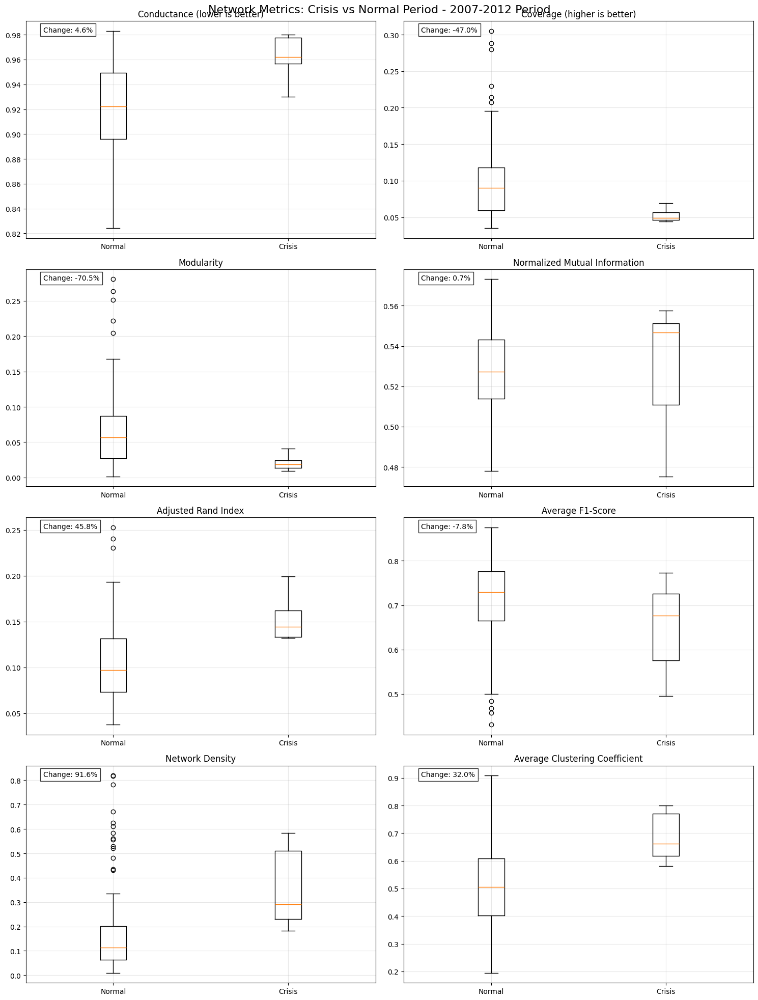

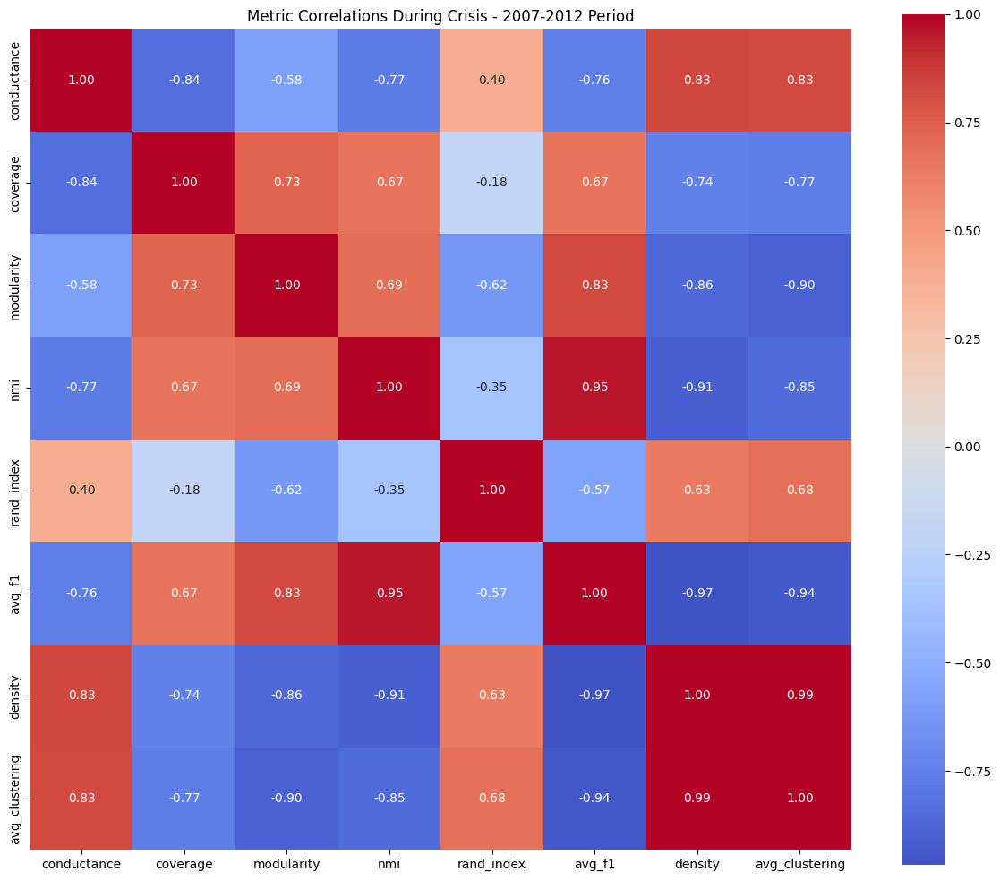


Summary Statistics - 2007-2012 Period

Crisis Period:
       conductance  coverage  modularity       nmi  rand_index    avg_f1  \
count     9.000000  9.000000    9.000000  9.000000    9.000000  9.000000   
mean      0.962988  0.052723    0.020178  0.530982    0.152183  0.652411   
std       0.015712  0.009108    0.009840  0.031042    0.022733  0.099890   
min       0.930090  0.043989    0.009395  0.475251    0.132078  0.495457   
25%       0.956854  0.046310    0.013440  0.510953    0.133458  0.575182   
50%       0.961841  0.048821    0.018848  0.546680    0.144626  0.676552   
75%       0.977783  0.056309    0.024420  0.551203    0.161950  0.726471   
max       0.980252  0.069074    0.040872  0.557474    0.199162  0.772487   

        density  avg_clustering  
count  9.000000        9.000000  
mean   0.356540        0.687271  
std    0.151001        0.081244  
min    0.183274        0.581615  
25%    0.229810        0.616928  
50%    0.291571        0.661637  
75%    0.510585       

C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\2738420236.py:102: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=['Normal', 'Crisis'])
C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\2738420236.py:102: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=['Normal', 'Crisis'])
C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\2738420236.py:102: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=['Normal', 'Crisis'])
C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\2738420236.py:102: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has bee

<Figure size 2000x1500 with 0 Axes>

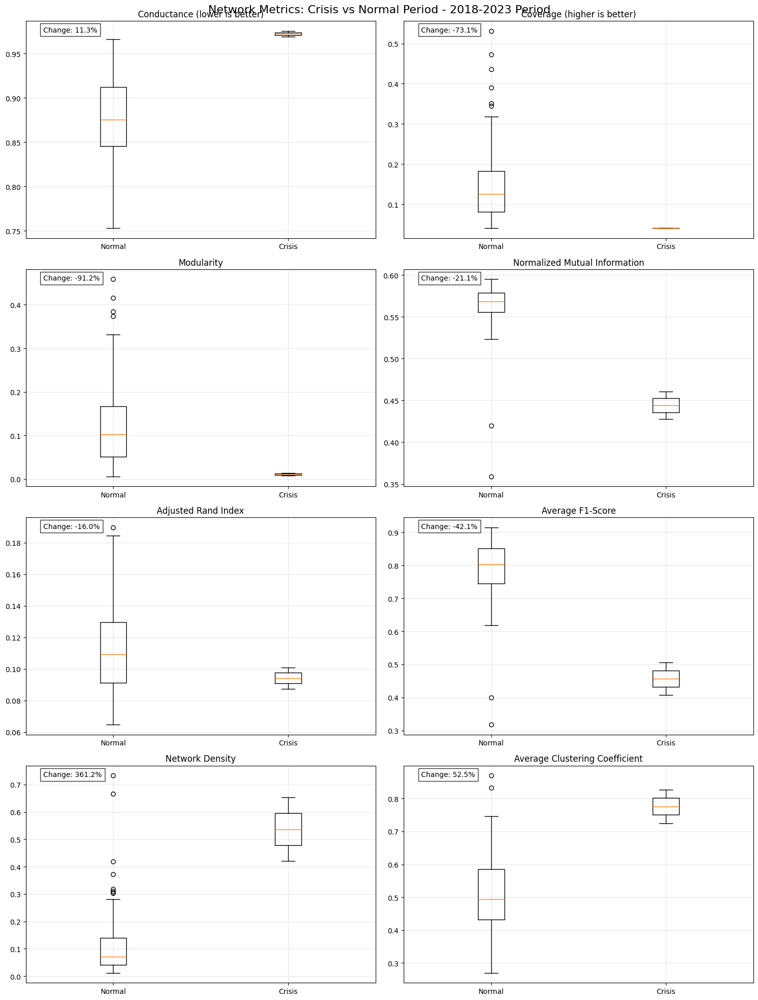

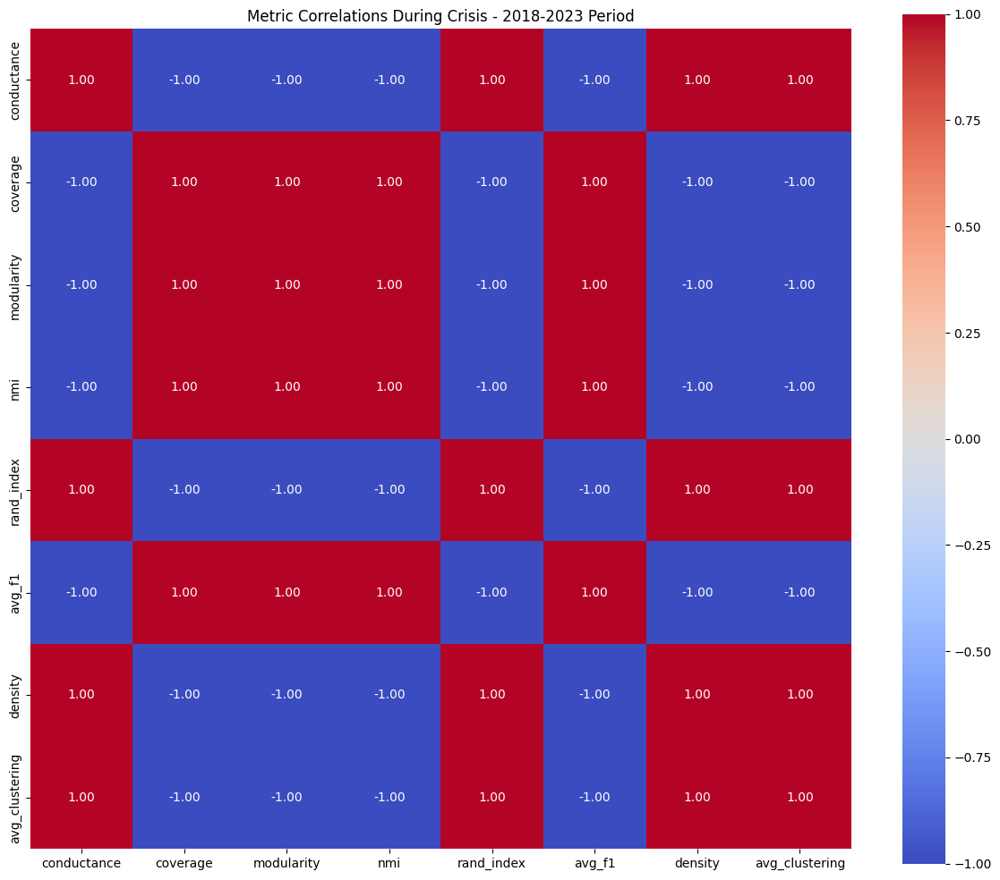


Summary Statistics - 2018-2023 Period

Crisis Period:
       conductance  coverage  modularity       nmi  rand_index    avg_f1  \
count     2.000000  2.000000    2.000000  2.000000    2.000000  2.000000   
mean      0.972252  0.040202    0.010864  0.444248    0.094227  0.456246   
std       0.004671  0.000347    0.004432  0.023514    0.009698  0.069740   
min       0.968949  0.039957    0.007730  0.427621    0.087370  0.406932   
25%       0.970600  0.040080    0.009297  0.435934    0.090799  0.431589   
50%       0.972252  0.040202    0.010864  0.444248    0.094227  0.456246   
75%       0.973903  0.040325    0.012431  0.452561    0.097656  0.480903   
max       0.975554  0.040448    0.013998  0.460875    0.101085  0.505560   

        density  avg_clustering  
count  2.000000        2.000000  
mean   0.536898        0.776357  
std    0.164798        0.072131  
min    0.420369        0.725352  
25%    0.478633        0.750855  
50%    0.536898        0.776357  
75%    0.595163       

In [9]:
# %%
# Cell 7: Crisis Period Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

def analyze_crisis_period(networks, clusters, period_name, crisis_start, crisis_end):
    """
    Analyze network characteristics during crisis periods
    
    Parameters:
    -----------
    networks : dict
        Dictionary of network snapshots
    clusters : dict
        Dictionary of cluster assignments
    period_name : str
        Name of the period (e.g., "2007-2012" or "2018-2023")
    crisis_start : datetime
        Start date of crisis period
    crisis_end : datetime
        End date of crisis period
    """
    print(f"\nAnalyzing {period_name}")
    sector_dict = dfsp500.set_index('Symbol')['Sector'].to_dict()
    
    # Initialize lists for metrics
    crisis_metrics = []
    normal_metrics = []
    dates = []
    
    # Calculate metrics for each time window
    for date in sorted(networks.keys()):
        date_pd = pd.to_datetime(date)
        dates.append(date_pd)
        
        # Calculate quality metrics
        metrics = calculate_cluster_quality(networks[date], 
                                         clusters[date], 
                                         sector_dict)
        
        # Add basic network metrics
        G = networks[date]
        metrics.update({
            'date': date_pd,
            'n_clusters': len(np.unique(clusters[date])),
            'density': nx.density(G),
            'avg_clustering': nx.average_clustering(G),
            'n_nodes': G.number_of_nodes(),
            'n_edges': G.number_of_edges()
        })
        
        # Categorize as crisis or normal period
        if crisis_start <= date_pd <= crisis_end:
            crisis_metrics.append(metrics)
        else:
            normal_metrics.append(metrics)
    
    # Convert to DataFrames for easier analysis
    df_crisis = pd.DataFrame(crisis_metrics)
    df_normal = pd.DataFrame(normal_metrics)
    
    # Create visualizations
    plot_crisis_comparison(df_crisis, df_normal, period_name)
    
    return df_crisis, df_normal

def plot_crisis_comparison(df_crisis, df_normal, period_name):
    """
    Create comprehensive visualizations comparing crisis and normal periods
    """
    metrics_to_plot = [
        ('conductance', 'Conductance (lower is better)'),
        ('coverage', 'Coverage (higher is better)'),
        ('modularity', 'Modularity'),
        ('nmi', 'Normalized Mutual Information'),
        ('rand_index', 'Adjusted Rand Index'),
        ('avg_f1', 'Average F1-Score'),
        ('density', 'Network Density'),
        ('avg_clustering', 'Average Clustering Coefficient')
    ]
    
    # Create boxplot comparison
    plt.figure(figsize=(20, 15))
    fig, axes = plt.subplots(4, 2, figsize=(15, 20))
    fig.suptitle(f'Network Metrics: Crisis vs Normal Period - {period_name}', fontsize=16)
    
    for idx, (metric, title) in enumerate(metrics_to_plot):
        row = idx // 2
        col = idx % 2
        ax = axes[row, col]
        
        # Prepare data for boxplot
        data = [
            df_normal[metric].values,
            df_crisis[metric].values
        ]
        
        # Create boxplot
        ax.boxplot(data, labels=['Normal', 'Crisis'])
        ax.set_title(title)
        ax.grid(True, alpha=0.3)
        
        # Calculate and display percentage change
        normal_mean = df_normal[metric].mean()
        crisis_mean = df_crisis[metric].mean()
        pct_change = ((crisis_mean - normal_mean) / normal_mean) * 100
        
        ax.text(0.05, 0.95, f'Change: {pct_change:.1f}%',
                transform=ax.transAxes,
                bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Create correlation heatmap for crisis period
    plt.figure(figsize=(12, 10))
    metrics_list = [m[0] for m in metrics_to_plot]
    correlation_matrix = df_crisis[metrics_list].corr()
    
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0,
                fmt='.2f', square=True)
    plt.title(f'Metric Correlations During Crisis - {period_name}')
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print(f"\nSummary Statistics - {period_name}")
    print("\nCrisis Period:")
    print(df_crisis[metrics_list].describe())
    print("\nNormal Period:")
    print(df_normal[metrics_list].describe())
    
    # Calculate and print significant changes
    print("\nSignificant Changes During Crisis:")
    for metric, title in metrics_to_plot:
        normal_mean = df_normal[metric].mean()
        crisis_mean = df_crisis[metric].mean()
        pct_change = ((crisis_mean - normal_mean) / normal_mean) * 100
        
        normal_std = df_normal[metric].std()
        crisis_std = df_crisis[metric].std()
        
        print(f"\n{title}:")
        print(f"  Normal: {normal_mean:.3f} (±{normal_std:.3f})")
        print(f"  Crisis: {crisis_mean:.3f} (±{crisis_std:.3f})")
        print(f"  Change: {pct_change:.1f}%")

# Analyze both periods
print("Analyzing crisis periods...")

# Financial Crisis Analysis
financial_crisis_start = pd.to_datetime('2008-09-15')  # Lehman bankruptcy
financial_crisis_end = pd.to_datetime('2009-03-31')    # Market bottom

df_crisis_fin, df_normal_fin = analyze_crisis_period(
    networks1, clusters1, "2007-2012 Period",
    financial_crisis_start, financial_crisis_end
)

# COVID Crisis Analysis
covid_crisis_start = pd.to_datetime('2020-02-20')  # Market peak
covid_crisis_end = pd.to_datetime('2020-04-07')    # Market bottom

df_crisis_covid, df_normal_covid = analyze_crisis_period(
    networks2, clusters2, "2018-2023 Period",
    covid_crisis_start, covid_crisis_end
)

# Save results
results_dir = 'crisis_analysis_results'
os.makedirs(results_dir, exist_ok=True)

df_crisis_fin.to_csv(f'{results_dir}/financial_crisis_metrics.csv')
df_normal_fin.to_csv(f'{results_dir}/financial_normal_metrics.csv')
df_crisis_covid.to_csv(f'{results_dir}/covid_crisis_metrics.csv')
df_normal_covid.to_csv(f'{results_dir}/covid_normal_metrics.csv')

print("\nResults saved to 'crisis_analysis_results' directory")

Starting temporal evolution analysis...

Analyzing temporal evolution for 2007-2012 Period


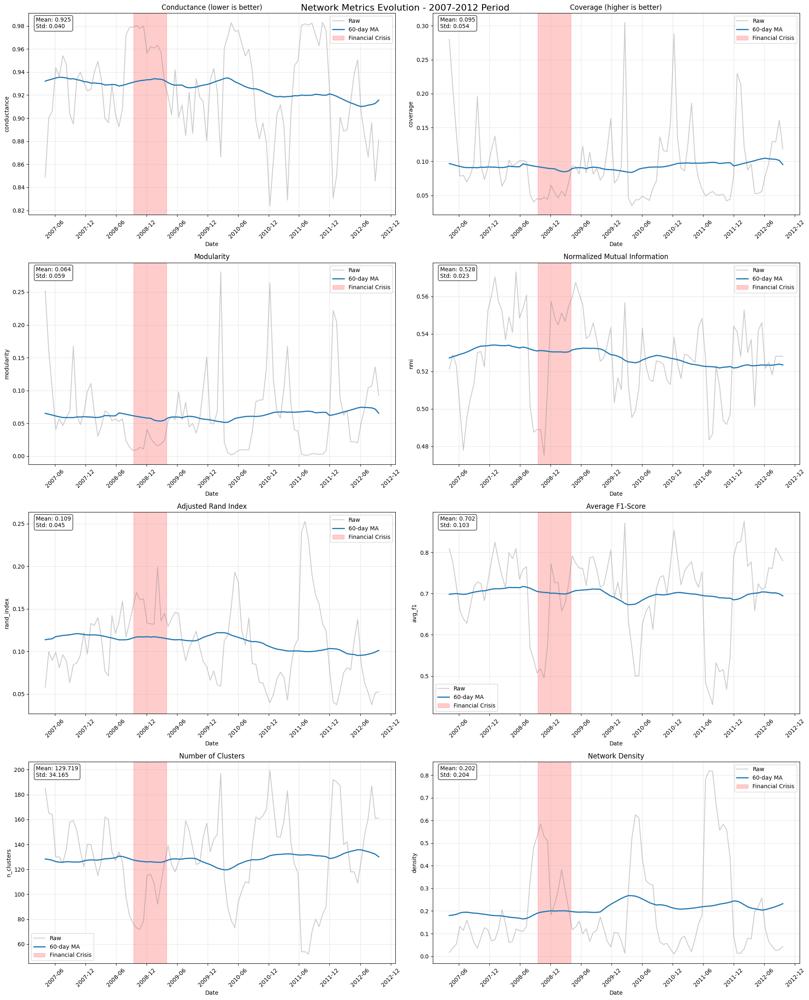

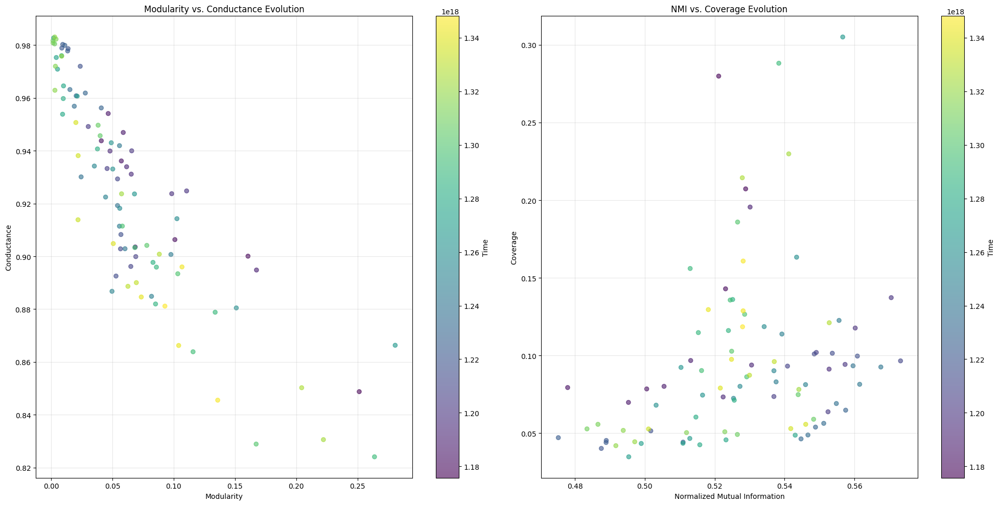

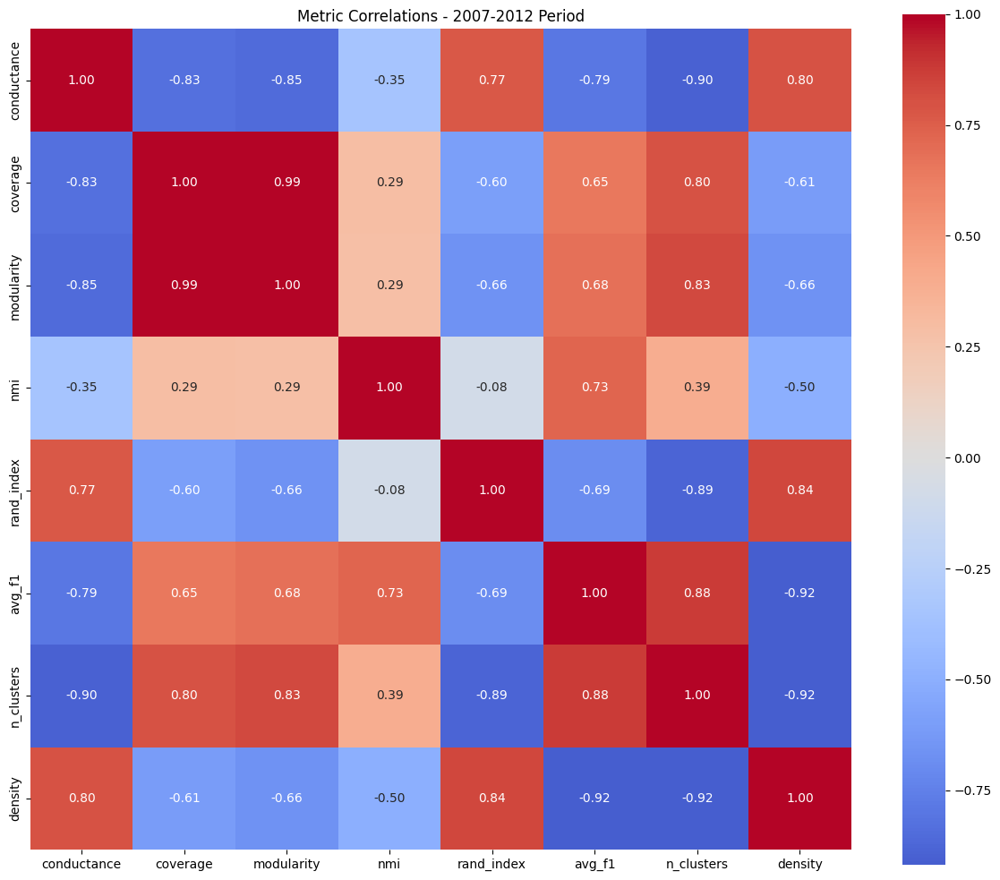


Significant Metric Correlations:
conductance vs coverage: -0.834
conductance vs modularity: -0.850
conductance vs rand_index: 0.771
conductance vs avg_f1: -0.793
conductance vs n_clusters: -0.896
conductance vs density: 0.799
coverage vs modularity: 0.988
coverage vs rand_index: -0.596
coverage vs avg_f1: 0.648
coverage vs n_clusters: 0.800
coverage vs density: -0.614
modularity vs rand_index: -0.664
modularity vs avg_f1: 0.684
modularity vs n_clusters: 0.831
modularity vs density: -0.664
nmi vs avg_f1: 0.730
nmi vs density: -0.501
rand_index vs avg_f1: -0.692
rand_index vs n_clusters: -0.885
rand_index vs density: 0.837
avg_f1 vs n_clusters: 0.878
avg_f1 vs density: -0.917
n_clusters vs density: -0.917

Analyzing temporal evolution for 2018-2023 Period


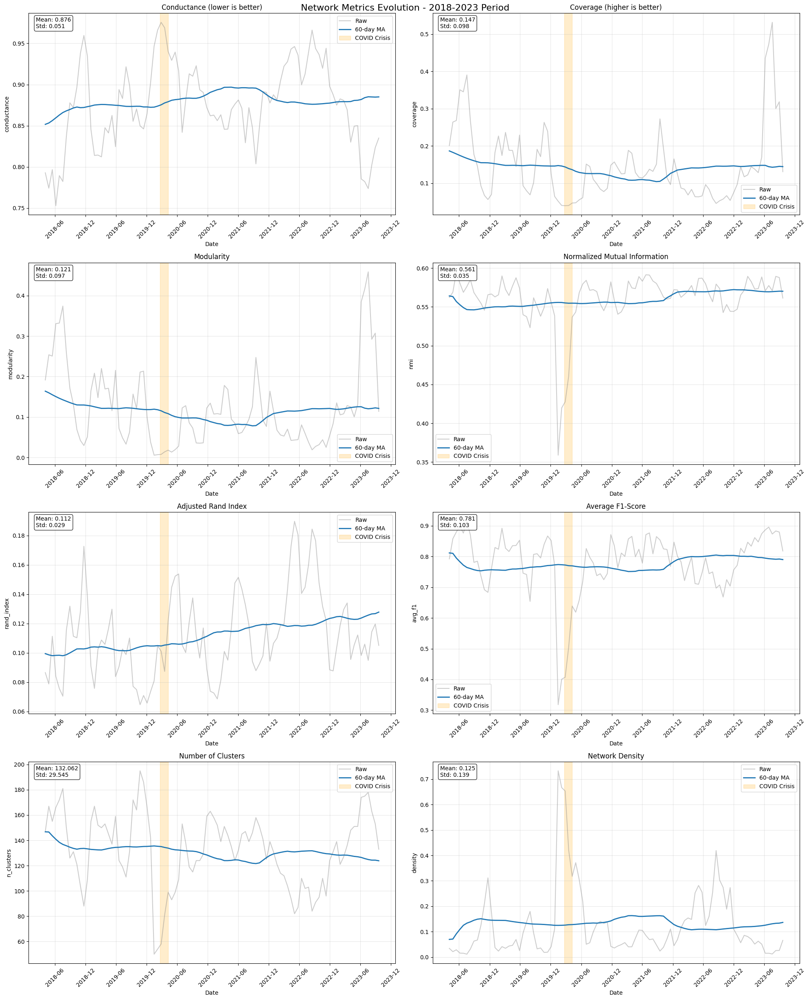

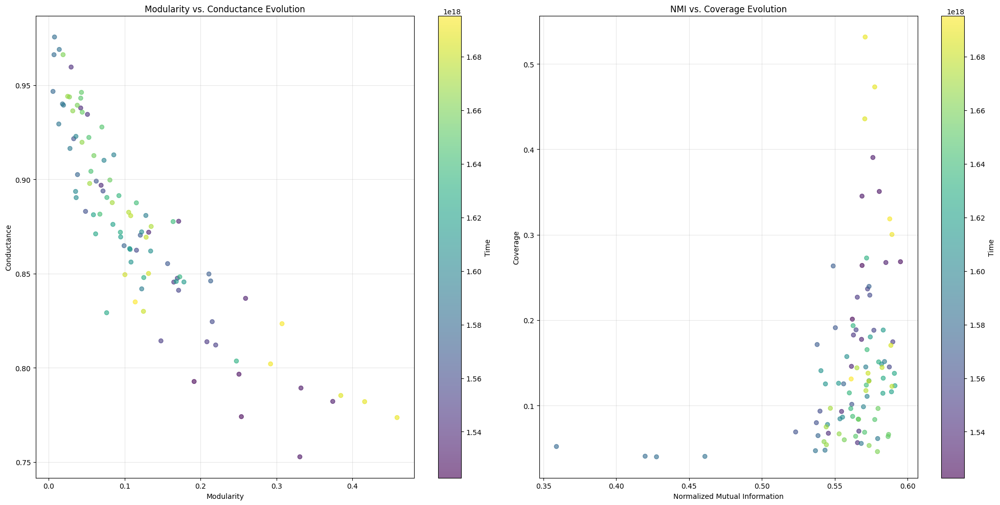

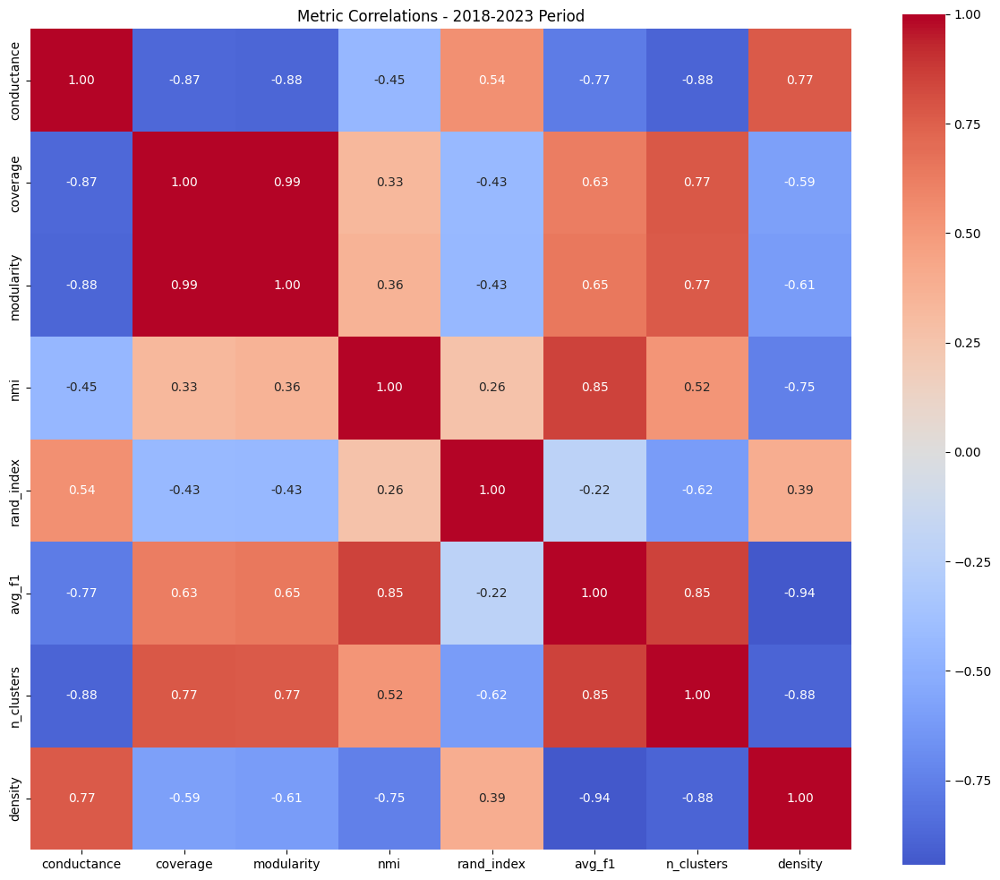


Significant Metric Correlations:
conductance vs coverage: -0.870
conductance vs modularity: -0.879
conductance vs rand_index: 0.540
conductance vs avg_f1: -0.771
conductance vs n_clusters: -0.882
conductance vs density: 0.771
coverage vs modularity: 0.990
coverage vs avg_f1: 0.626
coverage vs n_clusters: 0.773
coverage vs density: -0.589
modularity vs avg_f1: 0.650
modularity vs n_clusters: 0.772
modularity vs density: -0.613
nmi vs avg_f1: 0.850
nmi vs n_clusters: 0.517
nmi vs density: -0.747
rand_index vs n_clusters: -0.615
avg_f1 vs n_clusters: 0.850
avg_f1 vs density: -0.942
n_clusters vs density: -0.884

Results saved to 'temporal_analysis_results' directory


In [10]:
# %%
# Cell 8: Temporal Evolution Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import matplotlib.dates as mdates

def analyze_temporal_evolution(networks, clusters, period_name, window_size=60):
    """
    Analyze the temporal evolution of network and cluster quality metrics
    
    Parameters:
    -----------
    networks : dict
        Dictionary of network snapshots
    clusters : dict
        Dictionary of cluster assignments
    period_name : str
        Name of the period for labeling
    window_size : int
        Size of the rolling window for smoothing (in days)
    """
    print(f"\nAnalyzing temporal evolution for {period_name}")
    
    # Get sector information
    sector_dict = dfsp500.set_index('Symbol')['Sector'].to_dict()
    
    # Calculate metrics for each timestamp
    temporal_metrics = []
    for date in sorted(networks.keys()):
        try:
            # Calculate quality metrics
            metrics = calculate_cluster_quality(networks[date], clusters[date], sector_dict)
            
            # Add basic network metrics
            G = networks[date]
            metrics.update({
                'date': pd.to_datetime(date),
                'n_clusters': len(np.unique(clusters[date])),
                'density': nx.density(G),
                'avg_clustering': nx.average_clustering(G),
                'n_nodes': G.number_of_nodes(),
                'n_edges': G.number_of_edges()
            })
            
            temporal_metrics.append(metrics)
        except Exception as e:
            print(f"Error processing date {date}: {str(e)}")
            continue
    
    # Convert to DataFrame
    df_metrics = pd.DataFrame(temporal_metrics)
    df_metrics.set_index('date', inplace=True)
    
    # Create visualizations
    plot_temporal_evolution(df_metrics, period_name, window_size)
    plot_metric_correlations(df_metrics, period_name)
    
    return df_metrics

def plot_temporal_evolution(df_metrics, period_name, window_size):
    """
    Create detailed visualizations of metric evolution over time
    """
    metrics_to_plot = [
        ('conductance', 'Conductance (lower is better)', 'YlOrRd'),
        ('coverage', 'Coverage (higher is better)', 'YlGnBu'),
        ('modularity', 'Modularity', 'RdYlBu'),
        ('nmi', 'Normalized Mutual Information', 'viridis'),
        ('rand_index', 'Adjusted Rand Index', 'plasma'),
        ('avg_f1', 'Average F1-Score', 'magma'),
        ('n_clusters', 'Number of Clusters', 'Set3'),
        ('density', 'Network Density', 'Set2')
    ]
    
    # Create main evolution plot
    fig = plt.figure(figsize=(20, 25))
    gs = plt.GridSpec(4, 2, figure=fig)
    fig.suptitle(f'Network Metrics Evolution - {period_name}', fontsize=16)
    
    for idx, (metric, title, cmap) in enumerate(metrics_to_plot):
        row = idx // 2
        col = idx % 2
        ax = fig.add_subplot(gs[row, col])
        
        # Plot raw data
        ax.plot(df_metrics.index, df_metrics[metric], 
                alpha=0.4, color='gray', label='Raw')
        
        # Plot smoothed trend
        smoothed = df_metrics[metric].rolling(window=window_size, 
                                            min_periods=1, 
                                            center=True).mean()
        ax.plot(df_metrics.index, smoothed, 
                linewidth=2, label=f'{window_size}-day MA')
        
        # Add crisis period highlights
        if '2007-2012' in period_name:
            crisis_start = pd.to_datetime('2008-09-15')
            crisis_end = pd.to_datetime('2009-03-31')
            ax.axvspan(crisis_start, crisis_end,
                      color='red', alpha=0.2, label='Financial Crisis')
        elif '2018-2023' in period_name:
            crisis_start = pd.to_datetime('2020-02-20')
            crisis_end = pd.to_datetime('2020-04-07')
            ax.axvspan(crisis_start, crisis_end,
                      color='orange', alpha=0.2, label='COVID Crisis')
        
        ax.set_title(title)
        ax.set_xlabel('Date')
        ax.set_ylabel(metric)
        ax.grid(True, alpha=0.3)
        ax.legend()
        
        # Format x-axis
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
        
        # Add trend statistics
        trend_text = f"Mean: {df_metrics[metric].mean():.3f}\n"
        trend_text += f"Std: {df_metrics[metric].std():.3f}"
        ax.text(0.02, 0.98, trend_text,
                transform=ax.transAxes, 
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Create phase space plots
    plt.figure(figsize=(20, 10))
    
    # Modularity vs. Conductance
    plt.subplot(1, 2, 1)
    plt.scatter(df_metrics['modularity'], df_metrics['conductance'], 
               alpha=0.6, c=df_metrics.index, cmap='viridis')
    plt.colorbar(label='Time')
    plt.xlabel('Modularity')
    plt.ylabel('Conductance')
    plt.title('Modularity vs. Conductance Evolution')
    plt.grid(True, alpha=0.3)
    
    # NMI vs. Coverage
    plt.subplot(1, 2, 2)
    plt.scatter(df_metrics['nmi'], df_metrics['coverage'], 
               alpha=0.6, c=df_metrics.index, cmap='viridis')
    plt.colorbar(label='Time')
    plt.xlabel('Normalized Mutual Information')
    plt.ylabel('Coverage')
    plt.title('NMI vs. Coverage Evolution')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def plot_metric_correlations(df_metrics, period_name):
    """
    Create correlation analysis visualizations
    """
    # Select metrics for correlation analysis
    metrics_for_corr = ['conductance', 'coverage', 'modularity', 'nmi', 
                       'rand_index', 'avg_f1', 'n_clusters', 'density']
    
    # Calculate correlation matrix
    corr_matrix = df_metrics[metrics_for_corr].corr()
    
    # Create correlation heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                fmt='.2f', square=True)
    plt.title(f'Metric Correlations - {period_name}')
    plt.tight_layout()
    plt.show()
    
    # Print significant correlations
    print("\nSignificant Metric Correlations:")
    for i in range(len(metrics_for_corr)):
        for j in range(i+1, len(metrics_for_corr)):
            corr = corr_matrix.iloc[i,j]
            if abs(corr) > 0.5:  # Threshold for significant correlation
                print(f"{metrics_for_corr[i]} vs {metrics_for_corr[j]}: {corr:.3f}")

# Run temporal analysis for both periods
print("Starting temporal evolution analysis...")

# First period (2007-2012)
df_temporal1 = analyze_temporal_evolution(networks1, clusters1, "2007-2012 Period")

# Second period (2018-2023)
df_temporal2 = analyze_temporal_evolution(networks2, clusters2, "2018-2023 Period")

# Save results
results_dir = 'temporal_analysis_results'
os.makedirs(results_dir, exist_ok=True)

df_temporal1.to_csv(f'{results_dir}/temporal_metrics_2007_2012.csv')
df_temporal2.to_csv(f'{results_dir}/temporal_metrics_2018_2023.csv')

print("\nResults saved to 'temporal_analysis_results' directory")

Creating comprehensive comparative analysis...


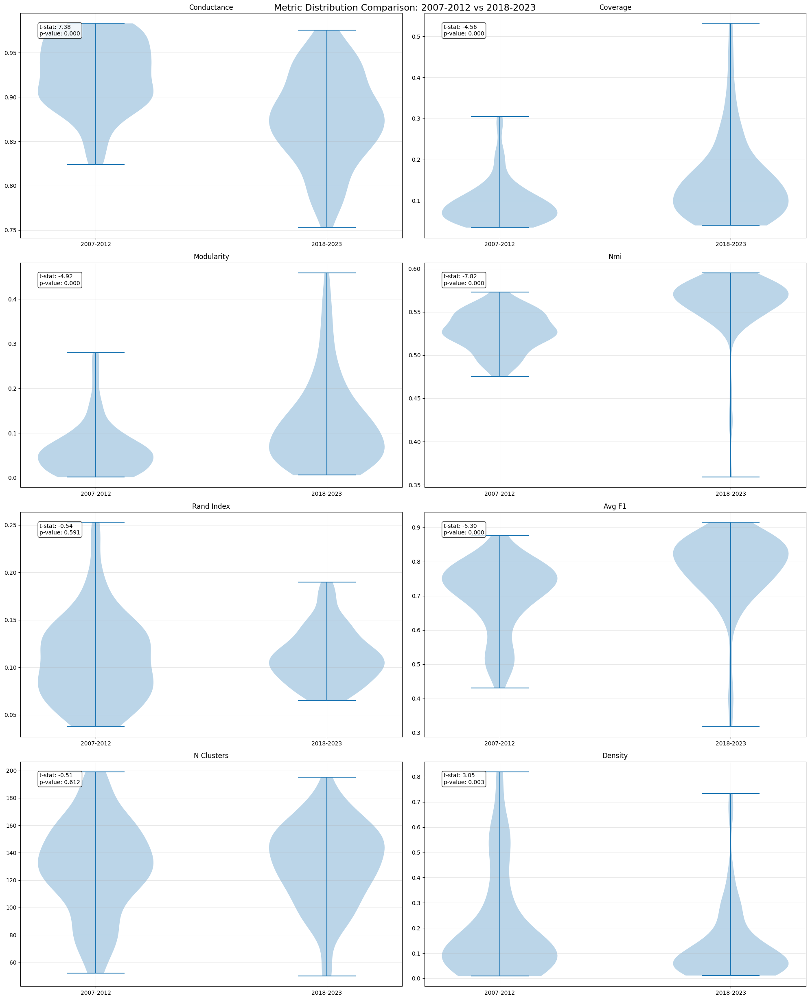

C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\1114663251.py:69: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot([fin_crisis_data, covid_crisis_data],
C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\1114663251.py:69: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot([fin_crisis_data, covid_crisis_data],
C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\1114663251.py:69: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot([fin_crisis_data, covid_crisis_data],
C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\1114663251.py:69: MatplotlibDeprecationWarning: The 'labels' parameter 

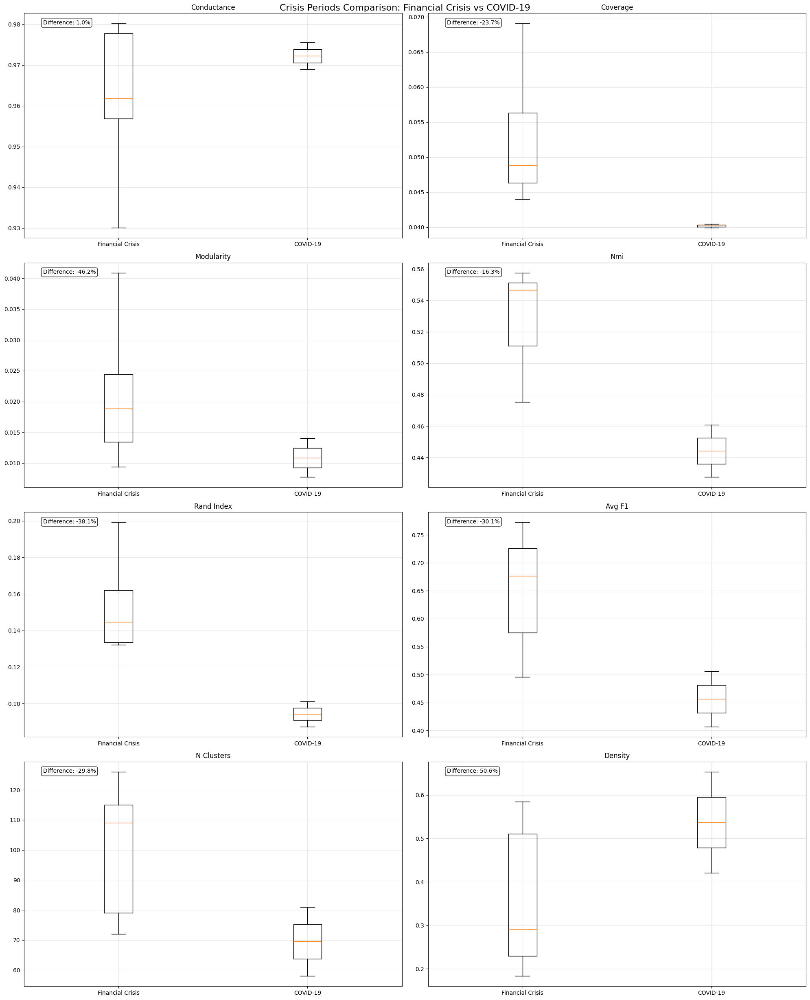


Detailed Statistical Comparison:

Conductance:

Period Comparison (2007-2012 vs 2018-2023):
2007-2012: 0.925 (±0.040)
2018-2023: 0.876 (±0.051)

Crisis Comparison (Financial vs COVID):
Financial Crisis: 0.963 (±0.016)
COVID Crisis: 0.972 (±0.005)

Coverage:

Period Comparison (2007-2012 vs 2018-2023):
2007-2012: 0.095 (±0.054)
2018-2023: 0.147 (±0.098)

Crisis Comparison (Financial vs COVID):
Financial Crisis: 0.053 (±0.009)
COVID Crisis: 0.040 (±0.000)

Modularity:

Period Comparison (2007-2012 vs 2018-2023):
2007-2012: 0.064 (±0.059)
2018-2023: 0.121 (±0.097)

Crisis Comparison (Financial vs COVID):
Financial Crisis: 0.020 (±0.010)
COVID Crisis: 0.011 (±0.004)

Nmi:

Period Comparison (2007-2012 vs 2018-2023):
2007-2012: 0.528 (±0.023)
2018-2023: 0.561 (±0.035)

Crisis Comparison (Financial vs COVID):
Financial Crisis: 0.531 (±0.031)
COVID Crisis: 0.444 (±0.024)

Rand Index:

Period Comparison (2007-2012 vs 2018-2023):
2007-2012: 0.109 (±0.045)
2018-2023: 0.112 (±0.029)

Crisis Comp

In [11]:
# %%
# Cell 9: Comprehensive Comparison and Summary Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import os
from datetime import datetime

def create_comparative_analysis(df_temporal1, df_temporal2, df_crisis_fin, df_crisis_covid):
    """
    Create comprehensive comparative analysis between periods
    and crisis events
    """
    metrics_to_analyze = [
        'conductance', 'coverage', 'modularity', 'nmi',
        'rand_index', 'avg_f1', 'n_clusters', 'density'
    ]
    
    # 1. Create period comparison plots
    fig, axes = plt.subplots(4, 2, figsize=(20, 25))
    fig.suptitle('Metric Distribution Comparison: 2007-2012 vs 2018-2023', fontsize=16)
    
    for idx, metric in enumerate(metrics_to_analyze):
        row = idx // 2
        col = idx % 2
        
        # Create violin plots
        data = [
            df_temporal1[metric].values,
            df_temporal2[metric].values
        ]
        
        ax = axes[row, col]
        ax.violinplot(data)
        ax.set_title(metric.replace('_', ' ').title())
        ax.set_xticks([1, 2])
        ax.set_xticklabels(['2007-2012', '2018-2023'])
        ax.grid(True, alpha=0.3)
        
        # Add statistics
        t_stat, p_value = stats.ttest_ind(df_temporal1[metric].dropna(), 
                                        df_temporal2[metric].dropna())
        
        stats_text = f't-stat: {t_stat:.2f}\np-value: {p_value:.3f}'
        ax.text(0.05, 0.95, stats_text, 
                transform=ax.transAxes,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # 2. Crisis Comparison Analysis
    fig, axes = plt.subplots(4, 2, figsize=(20, 25))
    fig.suptitle('Crisis Periods Comparison: Financial Crisis vs COVID-19', fontsize=16)
    
    for idx, metric in enumerate(metrics_to_analyze):
        row = idx // 2
        col = idx % 2
        
        # Prepare crisis period data
        fin_crisis_data = df_crisis_fin[metric].values
        covid_crisis_data = df_crisis_covid[metric].values
        
        # Create box plots
        ax = axes[row, col]
        bp = ax.boxplot([fin_crisis_data, covid_crisis_data], 
                      labels=['Financial Crisis', 'COVID-19'])
        ax.set_title(metric.replace('_', ' ').title())
        ax.grid(True, alpha=0.3)
        
        # Calculate and display percentage difference
        fin_mean = np.mean(fin_crisis_data)
        covid_mean = np.mean(covid_crisis_data)
        pct_diff = ((covid_mean - fin_mean) / fin_mean) * 100
        
        ax.text(0.05, 0.95, f'Difference: {pct_diff:.1f}%',
               transform=ax.transAxes,
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # 3. Print detailed statistical comparison
    print("\nDetailed Statistical Comparison:")
    for metric in metrics_to_analyze:
        print(f"\n{metric.replace('_', ' ').title()}:")
        
        # Period comparison
        print("\nPeriod Comparison (2007-2012 vs 2018-2023):")
        mean1 = df_temporal1[metric].mean()
        mean2 = df_temporal2[metric].mean()
        std1 = df_temporal1[metric].std()
        std2 = df_temporal2[metric].std()
        
        print(f"2007-2012: {mean1:.3f} (±{std1:.3f})")
        print(f"2018-2023: {mean2:.3f} (±{std2:.3f})")
        
        # Crisis comparison
        print("\nCrisis Comparison (Financial vs COVID):")
        fin_mean = df_crisis_fin[metric].mean()
        covid_mean = df_crisis_covid[metric].mean()
        fin_std = df_crisis_fin[metric].std()
        covid_std = df_crisis_covid[metric].std()
        
        print(f"Financial Crisis: {fin_mean:.3f} (±{fin_std:.3f})")
        print(f"COVID Crisis: {covid_mean:.3f} (±{covid_std:.3f})")

def create_summary_report():
    """
    Create and save comprehensive summary report
    """
    summary = []
    
    # 1. Overall Period Statistics
    for period, df in [('2007-2012', df_temporal1), ('2018-2023', df_temporal2)]:
        summary.append(f"\n{period} Period Summary:")
        for metric in df.columns:
            summary.append(f"\n{metric}:")
            summary.append(f"  Mean: {df[metric].mean():.3f}")
            summary.append(f"  Std:  {df[metric].std():.3f}")
            summary.append(f"  Min:  {df[metric].min():.3f}")
            summary.append(f"  Max:  {df[metric].max():.3f}")
    
    # 2. Crisis Period Comparison
    summary.append("\nCrisis Periods Comparison:")
    for metric in df_crisis_fin.columns:
        if metric != 'date':
            summary.append(f"\n{metric}:")
            summary.append("Financial Crisis:")
            summary.append(f"  Mean: {df_crisis_fin[metric].mean():.3f}")
            summary.append(f"  Std:  {df_crisis_fin[metric].std():.3f}")
            summary.append("\nCOVID Crisis:")
            summary.append(f"  Mean: {df_crisis_covid[metric].mean():.3f}")
            summary.append(f"  Std:  {df_crisis_covid[metric].std():.3f}")
    
    # Save summary report
    summary_text = '\n'.join(summary)
    with open('network_analysis_summary.txt', 'w') as f:
        f.write(summary_text)
    
    return summary_text

# Run comprehensive analysis
print("Creating comprehensive comparative analysis...")
create_comparative_analysis(df_temporal1, df_temporal2, df_crisis_fin, df_crisis_covid)

# Create and print summary report
print("\nGenerating summary report...")
summary_text = create_summary_report()
print("\nSummary Report:")
print(summary_text)

# Create final visualizations directory
results_dir = 'final_analysis_results'
os.makedirs(results_dir, exist_ok=True)

# Save all relevant DataFrames
final_results = {
    'temporal_2007_2012': df_temporal1,
    'temporal_2018_2023': df_temporal2,
    'crisis_financial': df_crisis_fin,
    'crisis_covid': df_crisis_covid
}

for name, df in final_results.items():
    df.to_csv(f'{results_dir}/{name}.csv')

print(f"\nAll results saved to '{results_dir}' directory")

# Print final timestamp
print(f"\nAnalysis completed at: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Checking cluster types and values:
Sample date: 2007-04-05 00:00:00
Cluster type: <class 'numpy.ndarray'>
Unique cluster values: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185]

Creating visualizations for 2007-2012 period...


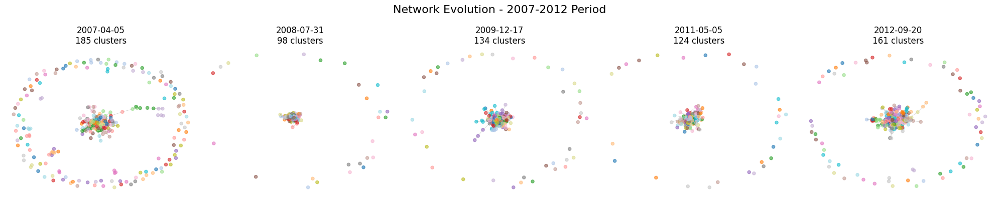

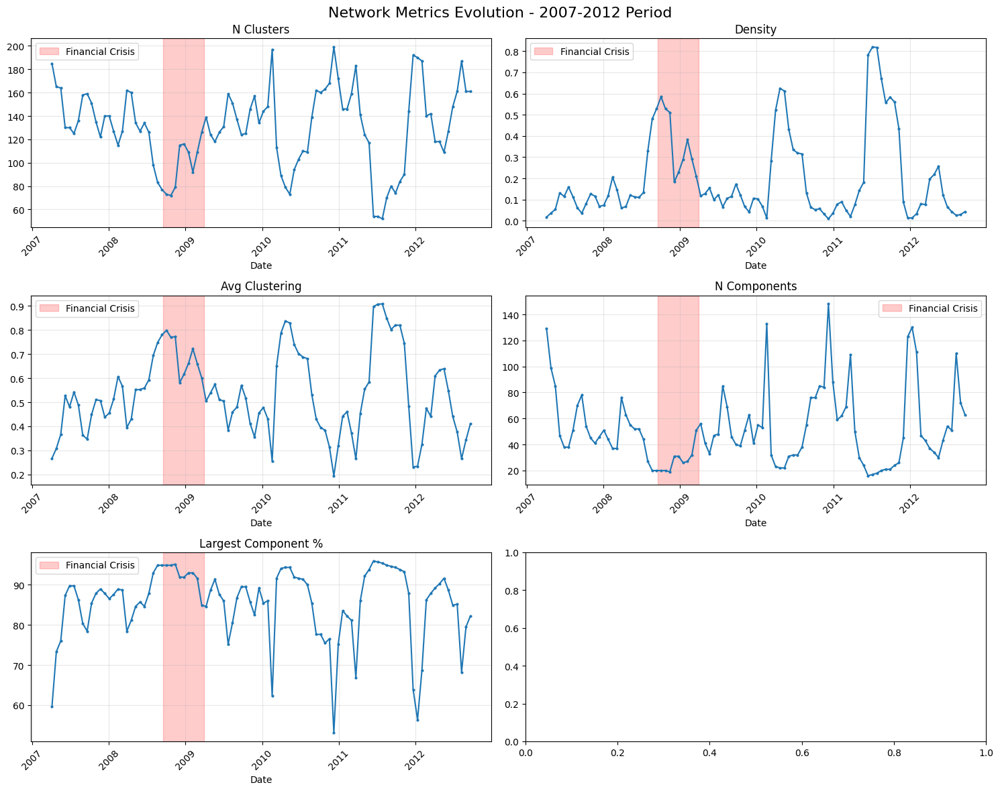


Creating visualizations for 2018-2023 period...


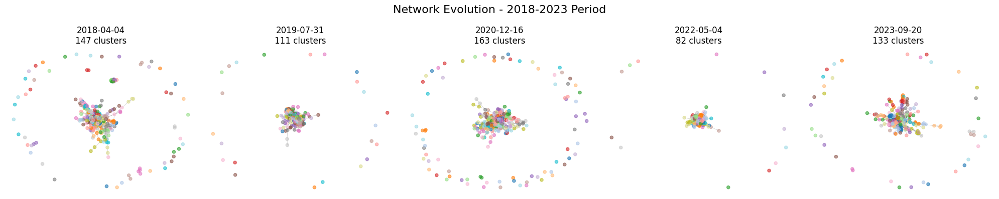

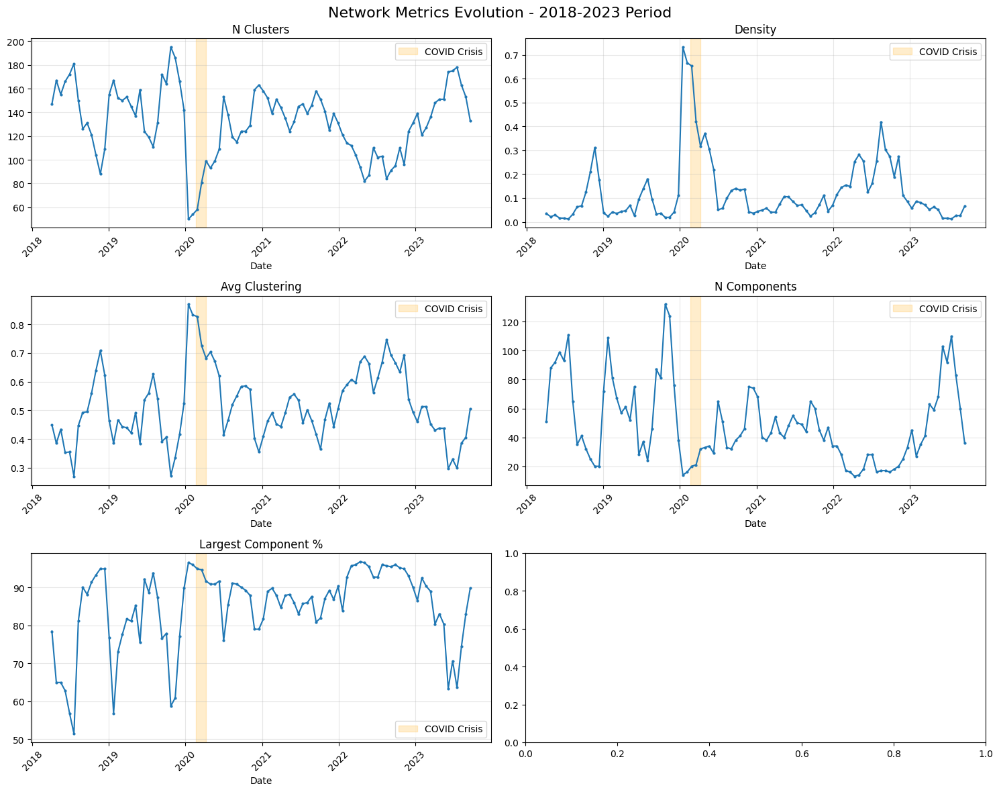


Results saved to 'network_visualization_results' directory


In [12]:
# %%
# Cell 10: Network Evolution Visualization (Fixed Integer Types)
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

def visualize_network_evolution(networks, clusters, period_name, num_samples=5):
    """
    Create network visualizations for selected time points
    """
    # Get evenly spaced dates
    dates = sorted(networks.keys())
    if len(dates) > num_samples:
        indices = np.linspace(0, len(dates)-1, num_samples).astype(int)
        selected_dates = [dates[i] for i in indices]
    else:
        selected_dates = dates

    # Create figure with subplots
    fig, axes = plt.subplots(1, len(selected_dates), figsize=(20, 4), squeeze=False)
    axes = axes[0]  # Get the first row since we only have one row
    plt.suptitle(f'Network Evolution - {period_name}', fontsize=16)
    
    # Custom colormap for better visualization
    n_colors = 20
    colors = plt.cm.tab20(np.linspace(0, 1, n_colors))
    
    for idx, date in enumerate(selected_dates):
        # Get network and clusters for current date
        G = networks[date]
        current_clusters = np.array(clusters[date])
        
        # Map clusters to consecutive integers starting from 0
        unique_clusters = np.unique(current_clusters)
        cluster_map = {c: i for i, c in enumerate(unique_clusters)}
        mapped_clusters = np.array([cluster_map[c] for c in current_clusters])
        
        # Assign colors
        node_colors = colors[mapped_clusters % n_colors]
        
        # Create layout and draw network
        pos = nx.spring_layout(G, k=1/np.sqrt(len(G.nodes())), seed=42)
        
        # Draw the network
        nx.draw_networkx_nodes(G, pos, node_size=20, 
                             node_color=node_colors,
                             alpha=0.6, ax=axes[idx])
        nx.draw_networkx_edges(G, pos, alpha=0.2, 
                             width=0.5, ax=axes[idx])
        
        # Set title
        date_str = pd.to_datetime(date).strftime('%Y-%m-%d')
        axes[idx].set_title(f'{date_str}\n{len(unique_clusters)} clusters')
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

def plot_metrics_evolution(networks, clusters, period_name):
    """
    Plot evolution of network metrics over time
    """
    dates = []
    metrics = {
        'N Clusters': [],
        'Density': [],
        'Avg Clustering': [],
        'N Components': [],
        'Largest Component %': []
    }
    
    # Calculate metrics for each time point
    for date in sorted(networks.keys()):
        G = networks[date]
        current_clusters = np.array(clusters[date])
        dates.append(pd.to_datetime(date))
        
        # Calculate metrics
        metrics['N Clusters'].append(len(np.unique(current_clusters)))
        metrics['Density'].append(nx.density(G))
        metrics['Avg Clustering'].append(nx.average_clustering(G))
        metrics['N Components'].append(nx.number_connected_components(G))
        
        largest_comp = max(nx.connected_components(G), key=len)
        metrics['Largest Component %'].append(len(largest_comp) / G.number_of_nodes() * 100)
    
    # Create visualization
    fig, axes = plt.subplots(3, 2, figsize=(15, 12))
    fig.suptitle(f'Network Metrics Evolution - {period_name}', fontsize=16)
    axes = axes.ravel()
    
    # Plot each metric
    for idx, (metric, values) in enumerate(metrics.items()):
        if idx < len(axes):
            ax = axes[idx]
            ax.plot(dates, values, '-o', markersize=2)
            ax.set_title(metric)
            ax.set_xlabel('Date')
            ax.grid(True, alpha=0.3)
            plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
            
            # Add crisis period highlights
            if '2007-2012' in period_name:
                crisis_start = pd.to_datetime('2008-09-15')
                crisis_end = pd.to_datetime('2009-03-31')
                ax.axvspan(crisis_start, crisis_end,
                          color='red', alpha=0.2, label='Financial Crisis')
            elif '2018-2023' in period_name:
                crisis_start = pd.to_datetime('2020-02-20')
                crisis_end = pd.to_datetime('2020-04-07')
                ax.axvspan(crisis_start, crisis_end,
                          color='orange', alpha=0.2, label='COVID Crisis')
            
            ax.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Return metrics as DataFrame
    return pd.DataFrame(metrics, index=dates)

# First, let's print some diagnostic information
print("Checking cluster types and values:")
date_sample = list(networks1.keys())[0]
print(f"Sample date: {date_sample}")
print(f"Cluster type: {type(clusters1[date_sample])}")
print(f"Unique cluster values: {np.unique(clusters1[date_sample])}")

# Run visualizations
print("\nCreating visualizations for 2007-2012 period...")
visualize_network_evolution(networks1, clusters1, "2007-2012 Period")
metrics_df1 = plot_metrics_evolution(networks1, clusters1, "2007-2012 Period")

print("\nCreating visualizations for 2018-2023 period...")
visualize_network_evolution(networks2, clusters2, "2018-2023 Period")
metrics_df2 = plot_metrics_evolution(networks2, clusters2, "2018-2023 Period")

# Save results
results_dir = 'network_visualization_results'
os.makedirs(results_dir, exist_ok=True)

metrics_df1.to_csv(f'{results_dir}/network_metrics_2007_2012.csv')
metrics_df2.to_csv(f'{results_dir}/network_metrics_2018_2023.csv')

print(f"\nResults saved to '{results_dir}' directory")

Calculating advanced metrics for 2007-2012 period...


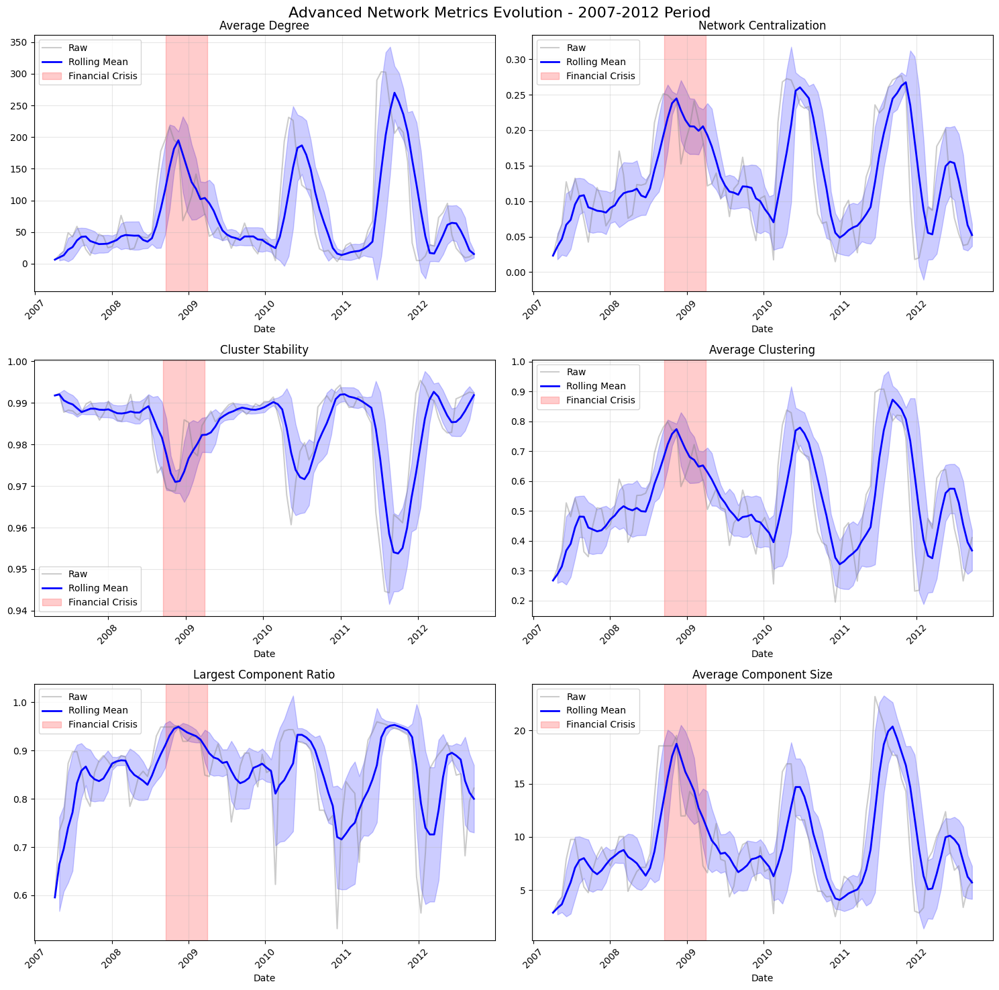

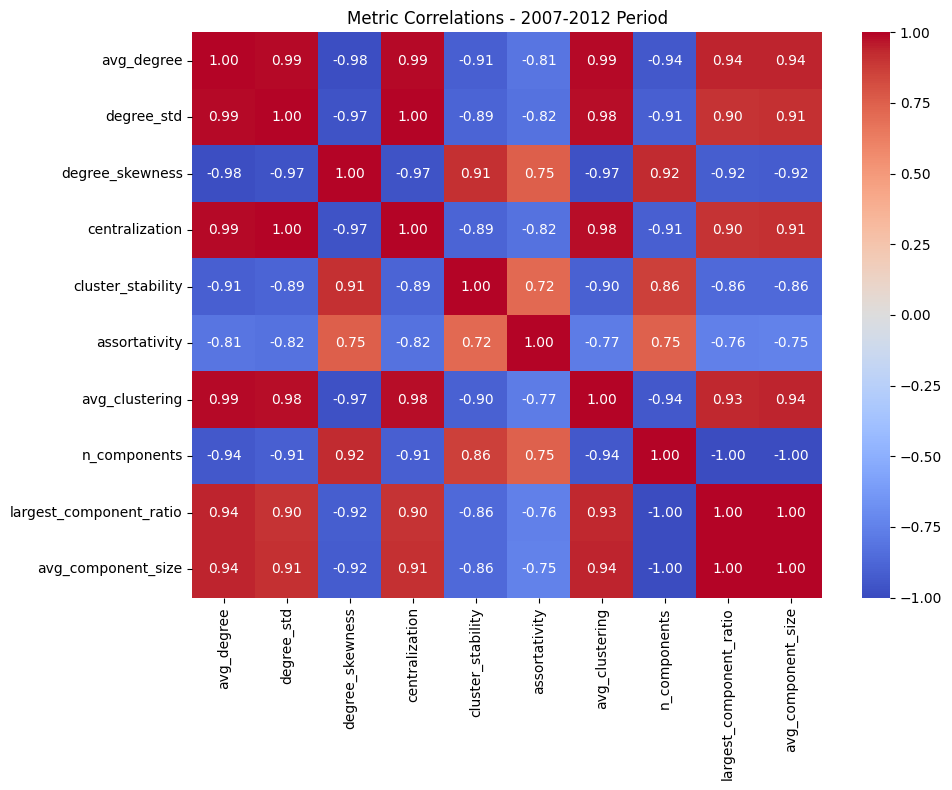


Calculating advanced metrics for 2018-2023 period...


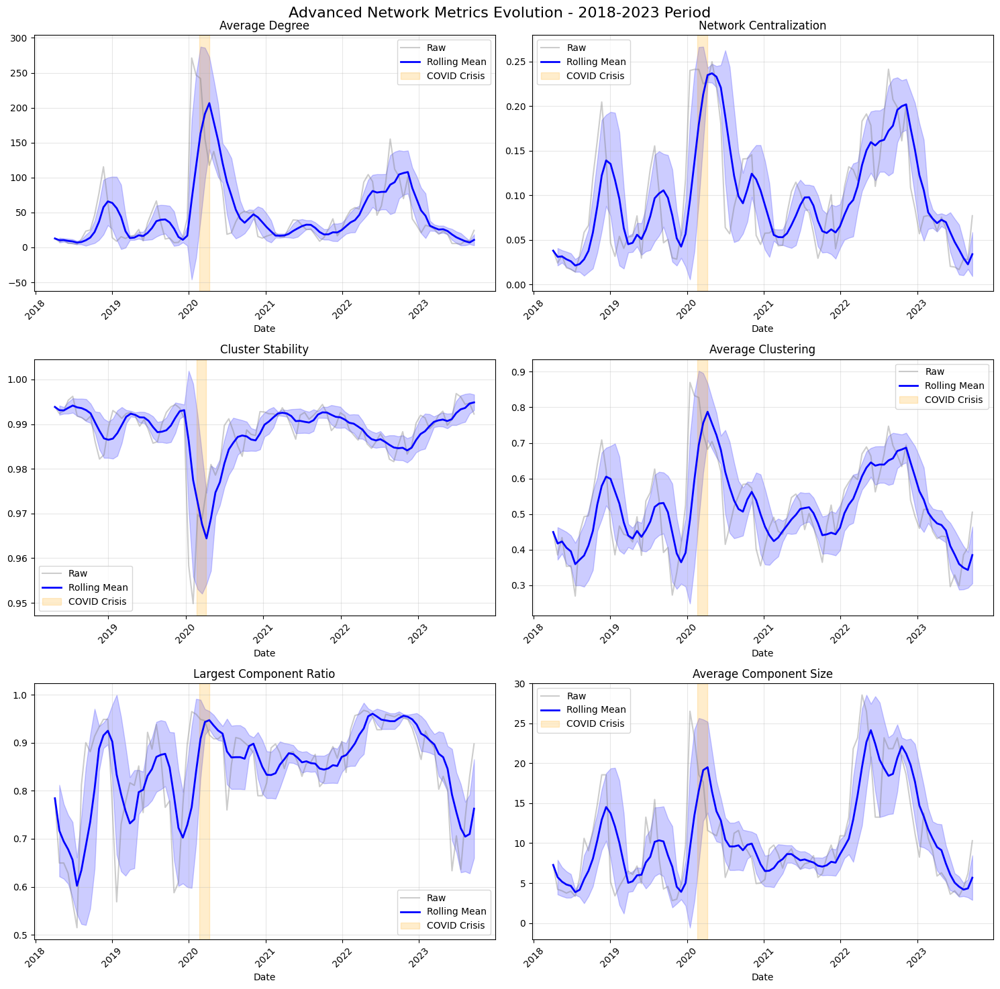

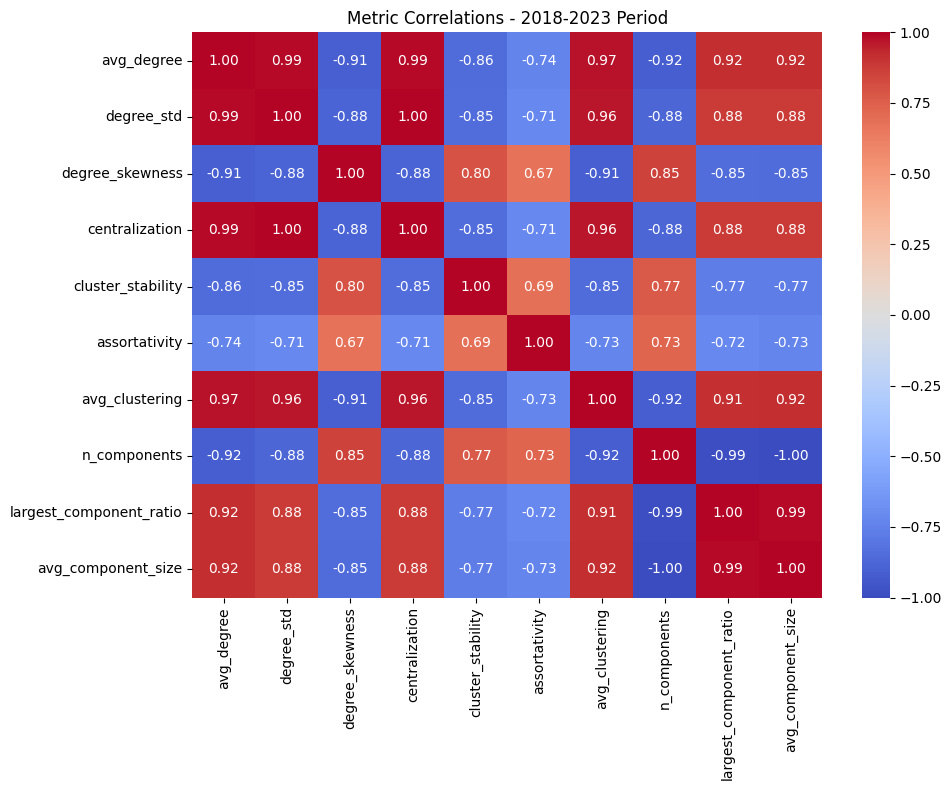


Results saved to 'advanced_metrics_results' directory

Summary Statistics:

2007-2012 Period:
       avg_degree  degree_std  degree_skewness  centralization  \
count   96.000000   96.000000        96.000000       96.000000   
mean    74.773416   49.846746         0.617537        0.134721   
std     75.482477   28.396390         1.068372        0.076747   
min      3.423181    5.426937        -2.761731        0.014667   
25%     24.297844   27.985505         0.083510        0.075637   
50%     43.614555   44.998052         0.840955        0.121616   
75%    105.311321   76.305920         1.358412        0.206232   
max    303.159030  102.406919         2.394440        0.276775   

       cluster_stability  assortativity  avg_clustering  n_components  \
count          95.000000      96.000000       96.000000     96.000000   
mean            0.983622       0.056193        0.536188     51.656250   
std             0.010567       0.121887        0.172796     29.140974   
min             0.

In [13]:
# %%
# Cell 11: Advanced Network Analysis and Evolution Patterns (Fixed)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from sklearn.preprocessing import StandardScaler

def calculate_centralization(G):
    """
    Calculate network centralization using degree centrality instead of eigenvector
    for better handling of disconnected graphs
    """
    # Use degree centrality which is well-defined for disconnected graphs
    centrality = nx.degree_centrality(G)
    centrality_values = np.array(list(centrality.values()))
    
    # Calculate centralization
    if len(centrality_values) > 1:
        return np.std(centrality_values)
    return 0

def calculate_advanced_metrics(networks, clusters, period_name):
    """
    Calculate advanced network metrics including robustness and stability measures
    """
    dates = sorted(networks.keys())
    advanced_metrics = []
    
    for date in dates:
        G = networks[date]
        current_clusters = clusters[date]
        
        metrics = {}
        metrics['date'] = pd.to_datetime(date)
        
        # Degree distribution metrics
        degrees = [d for n, d in G.degree()]
        metrics['avg_degree'] = np.mean(degrees)
        metrics['degree_std'] = np.std(degrees)
        metrics['degree_skewness'] = pd.Series(degrees).skew()
        
        # Centralization metrics (using degree centrality)
        metrics['centralization'] = calculate_centralization(G)
        
        # Cluster stability (compared to previous snapshot)
        if len(advanced_metrics) > 0:
            prev_clusters = clusters[dates[dates.index(date)-1]]
            stability = calculate_cluster_stability(prev_clusters, current_clusters)
            metrics['cluster_stability'] = stability
        else:
            metrics['cluster_stability'] = np.nan
        
        # Network robustness metrics
        try:
            metrics['assortativity'] = nx.degree_assortativity_coefficient(G)
        except:
            metrics['assortativity'] = np.nan
            
        metrics['avg_clustering'] = nx.average_clustering(G)
        metrics['n_components'] = nx.number_connected_components(G)
        
        # Component size metrics
        components = list(nx.connected_components(G))
        component_sizes = [len(c) for c in components]
        metrics['largest_component_ratio'] = max(component_sizes) / G.number_of_nodes()
        metrics['avg_component_size'] = np.mean(component_sizes)
        
        advanced_metrics.append(metrics)
    
    # Convert to DataFrame
    df_metrics = pd.DataFrame(advanced_metrics)
    df_metrics.set_index('date', inplace=True)
    
    # Calculate rolling statistics
    window = 5  # 5-period rolling window
    rolling_metrics = df_metrics.rolling(window=window, min_periods=1).agg(['mean', 'std'])
    
    # Plot metrics evolution
    plot_advanced_metrics(df_metrics, rolling_metrics, period_name)
    
    return df_metrics, rolling_metrics

def calculate_cluster_stability(prev_clusters, current_clusters):
    """
    Calculate stability score between consecutive clusterings
    """
    if len(prev_clusters) != len(current_clusters):
        return np.nan
        
    total_stable = 0
    total_pairs = 0
    
    # Convert to numpy arrays for faster computation
    prev_arr = np.array(prev_clusters)
    curr_arr = np.array(current_clusters)
    
    # Use vectorized operations for speed
    n = len(prev_arr)
    for i in range(n-1):
        # Check if pairs of nodes maintain their relationship
        prev_same = prev_arr[i] == prev_arr[i+1:]
        curr_same = curr_arr[i] == curr_arr[i+1:]
        total_stable += np.sum(prev_same == curr_same)
        total_pairs += len(prev_arr[i+1:])
    
    return total_stable / total_pairs if total_pairs > 0 else np.nan

def plot_advanced_metrics(df_metrics, rolling_metrics, period_name):
    """
    Create visualizations for advanced metrics
    """
    # Select metrics to plot
    metrics_to_plot = [
        ('avg_degree', 'Average Degree'),
        ('centralization', 'Network Centralization'),
        ('cluster_stability', 'Cluster Stability'),
        ('avg_clustering', 'Average Clustering'),
        ('largest_component_ratio', 'Largest Component Ratio'),
        ('avg_component_size', 'Average Component Size')
    ]
    
    # Create main evolution plot
    fig, axes = plt.subplots(3, 2, figsize=(15, 15))
    fig.suptitle(f'Advanced Network Metrics Evolution - {period_name}', fontsize=16)
    
    for idx, (metric, title) in enumerate(metrics_to_plot):
        row = idx // 2
        col = idx % 2
        ax = axes[row, col]
        
        # Plot raw data and rolling statistics
        ax.plot(df_metrics.index, df_metrics[metric], 
                alpha=0.4, color='gray', label='Raw')
        
        roll_mean = rolling_metrics[metric]['mean']
        roll_std = rolling_metrics[metric]['std']
        
        ax.plot(df_metrics.index, roll_mean, 
                linewidth=2, color='blue', label='Rolling Mean')
        
        # Add confidence interval
        ax.fill_between(df_metrics.index, 
                       roll_mean - roll_std,
                       roll_mean + roll_std,
                       alpha=0.2, color='blue')
        
        # Add crisis period highlights
        if '2007-2012' in period_name:
            crisis_start = pd.to_datetime('2008-09-15')
            crisis_end = pd.to_datetime('2009-03-31')
            ax.axvspan(crisis_start, crisis_end,
                      color='red', alpha=0.2, label='Financial Crisis')
        elif '2018-2023' in period_name:
            crisis_start = pd.to_datetime('2020-02-20')
            crisis_end = pd.to_datetime('2020-04-07')
            ax.axvspan(crisis_start, crisis_end,
                      color='orange', alpha=0.2, label='COVID Crisis')
        
        ax.set_title(title)
        ax.set_xlabel('Date')
        ax.grid(True, alpha=0.3)
        ax.legend()
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    # Create correlation heatmap
    plt.figure(figsize=(10, 8))
    correlation_matrix = df_metrics.corr(method='spearman')
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
    plt.title(f'Metric Correlations - {period_name}')
    plt.tight_layout()
    plt.show()

# Run advanced analysis for both periods
print("Calculating advanced metrics for 2007-2012 period...")
metrics_2007_2012, rolling_2007_2012 = calculate_advanced_metrics(networks1, clusters1, "2007-2012 Period")

print("\nCalculating advanced metrics for 2018-2023 period...")
metrics_2018_2023, rolling_2018_2023 = calculate_advanced_metrics(networks2, clusters2, "2018-2023 Period")

# Save results
results_dir = 'advanced_metrics_results'
os.makedirs(results_dir, exist_ok=True)

metrics_2007_2012.to_csv(f'{results_dir}/advanced_metrics_2007_2012.csv')
metrics_2018_2023.to_csv(f'{results_dir}/advanced_metrics_2018_2023.csv')

print(f"\nResults saved to '{results_dir}' directory")

# Print summary statistics
print("\nSummary Statistics:")
for period_name, metrics in [("2007-2012", metrics_2007_2012), 
                           ("2018-2023", metrics_2018_2023)]:
    print(f"\n{period_name} Period:")
    print(metrics.describe())

Analyzing Financial Crisis period...


C:\Users\SMART\AppData\Local\Temp\ipykernel_26496\3829715169.py:47: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  t_stat, p_val = ttest_ind(pre_crisis[metric].dropna(),


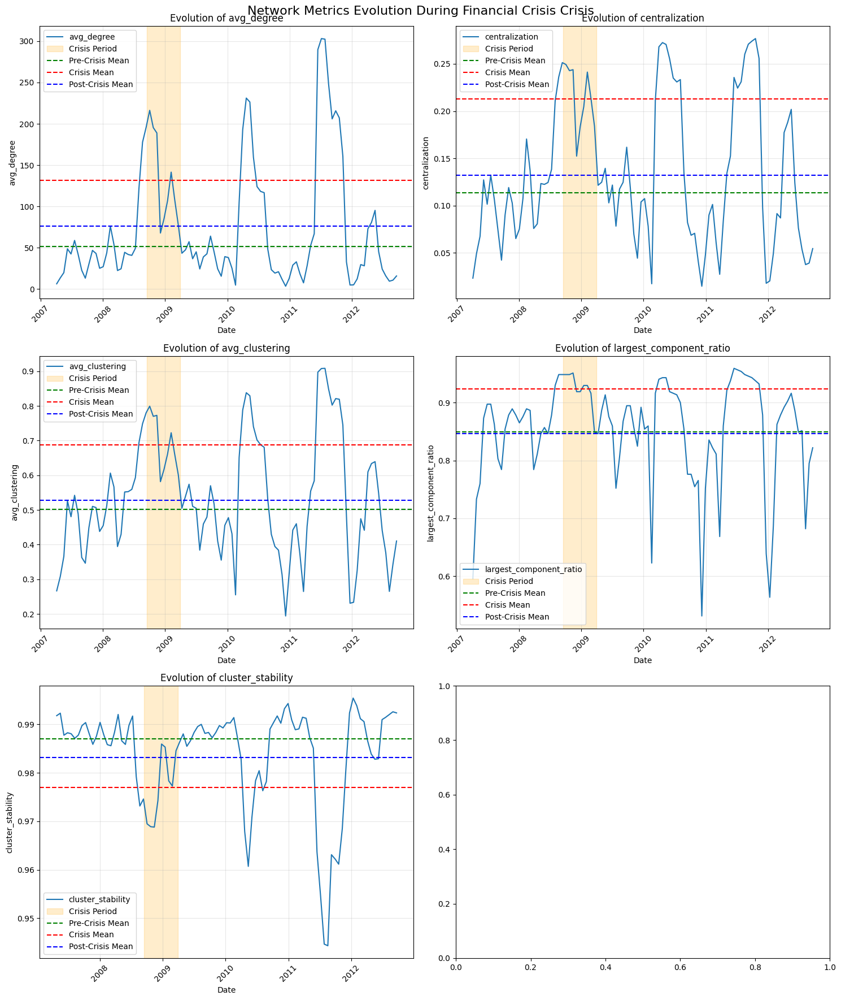

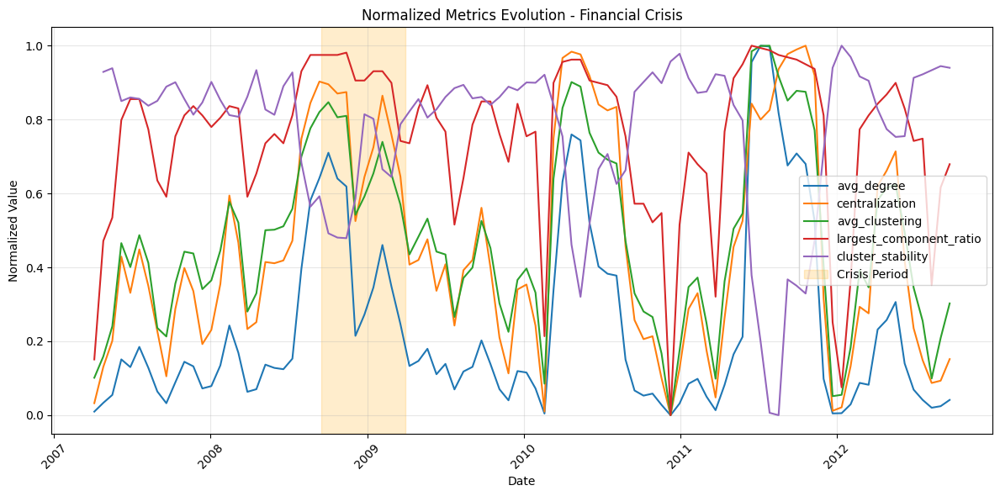


Analyzing COVID Crisis period...


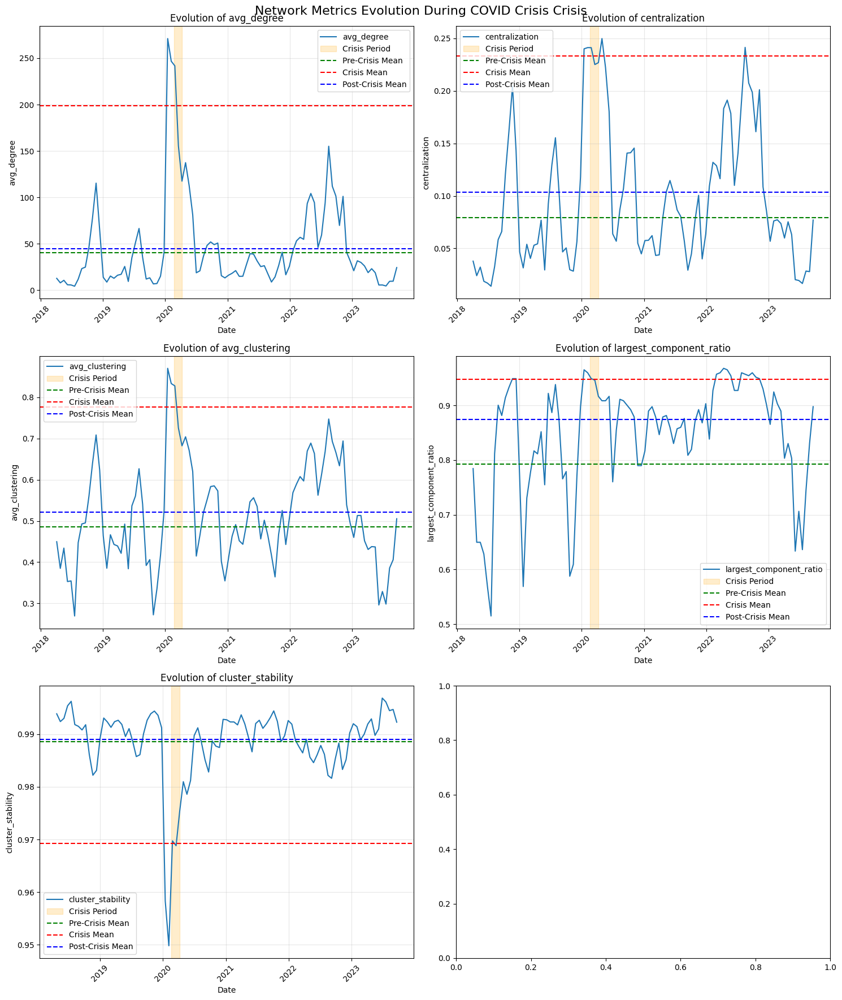

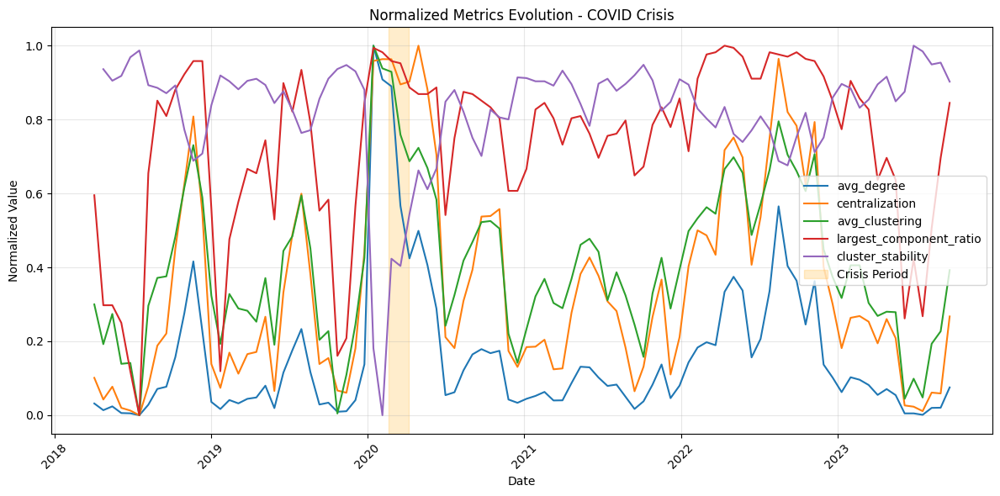


Crisis Impact Comparison:
                         Financial_Crisis  COVID_Crisis
avg_degree                            NaN   1805.049113
degree_std                            NaN    642.896494
degree_skewness                       NaN   -180.876081
centralization                        NaN    642.896494
cluster_stability                     NaN     -2.400147
assortativity                         NaN    -91.517905
avg_clustering                        NaN     83.570643
n_components                          NaN    -73.376623
largest_component_ratio               NaN     36.416559
avg_component_size                    NaN    249.963947

Statistical Comparison of Crisis Impacts:

avg_degree:
t-statistic: -1.512
p-value: 0.165

degree_std:
t-statistic: -0.798
p-value: 0.445

degree_skewness:
t-statistic: 1.740
p-value: 0.116

centralization:
t-statistic: -0.798
p-value: 0.445

cluster_stability:
t-statistic: 1.469
p-value: 0.176

assortativity:
t-statistic: -2.191
p-value: 0.056

avg_clus

In [14]:
# %%
# Cell 12: Crisis Comparison and Resilience Analysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from scipy import stats

def analyze_crisis_resilience(df_metrics, crisis_period, period_name):
    """
    Analyze network resilience during crisis periods
    
    Parameters:
    -----------
    df_metrics : DataFrame
        Network metrics over time
    crisis_period : tuple
        (crisis_start_date, crisis_end_date)
    period_name : str
        Name of the period for labeling
    """
    crisis_start, crisis_end = crisis_period
    
    # Define periods
    pre_crisis = df_metrics.loc[:crisis_start].iloc[:-30]  # Excluding 30 days before crisis
    during_crisis = df_metrics.loc[crisis_start:crisis_end]
    post_crisis = df_metrics.loc[crisis_end:].iloc[30:]    # Excluding 30 days after crisis
    
    # Calculate resilience metrics
    resilience_metrics = {}
    
    for metric in df_metrics.columns:
        # Skip date column if present
        if metric == 'date':
            continue
            
        pre_mean = pre_crisis[metric].mean()
        crisis_mean = during_crisis[metric].mean()
        post_mean = post_crisis[metric].mean()
        
        # Calculate percentage changes
        crisis_change = ((crisis_mean - pre_mean) / pre_mean) * 100
        recovery = ((post_mean - crisis_mean) / crisis_mean) * 100
        
        # Statistical tests
        t_stat, p_val = ttest_ind(pre_crisis[metric].dropna(), 
                                 during_crisis[metric].dropna())
        
        resilience_metrics[metric] = {
            'pre_crisis_mean': pre_mean,
            'crisis_mean': crisis_mean,
            'post_crisis_mean': post_mean,
            'crisis_change_%': crisis_change,
            'recovery_%': recovery,
            't_statistic': t_stat,
            'p_value': p_val
        }
    
    # Convert to DataFrame
    resilience_df = pd.DataFrame(resilience_metrics).transpose()
    
    # Visualization
    plot_crisis_comparison(df_metrics, crisis_period, period_name)
    
    return resilience_df

def plot_crisis_comparison(df_metrics, crisis_period, period_name):
    """
    Create visualizations for crisis period comparison
    """
    crisis_start, crisis_end = crisis_period
    
    # Plot metrics evolution with crisis highlight
    metrics_to_plot = ['avg_degree', 'centralization', 'avg_clustering', 
                      'largest_component_ratio', 'cluster_stability']
    
    fig, axes = plt.subplots(3, 2, figsize=(15, 18))
    fig.suptitle(f'Network Metrics Evolution During {period_name} Crisis', fontsize=16)
    axes = axes.ravel()
    
    for idx, metric in enumerate(metrics_to_plot):
        if idx < len(axes):
            ax = axes[idx]
            
            # Plot metric evolution
            sns.lineplot(data=df_metrics[metric], ax=ax, label=metric)
            
            # Highlight crisis period
            ax.axvspan(crisis_start, crisis_end,
                      color='red' if '2007-2012' in period_name else 'orange', 
                      alpha=0.2, 
                      label='Crisis Period')
            
            # Add mean lines
            pre_mean = df_metrics.loc[:crisis_start][metric].mean()
            crisis_mean = df_metrics.loc[crisis_start:crisis_end][metric].mean()
            post_mean = df_metrics.loc[crisis_end:][metric].mean()
            
            ax.axhline(y=pre_mean, color='g', linestyle='--', label='Pre-Crisis Mean')
            ax.axhline(y=crisis_mean, color='r', linestyle='--', label='Crisis Mean')
            ax.axhline(y=post_mean, color='b', linestyle='--', label='Post-Crisis Mean')
            
            ax.set_title(f'Evolution of {metric}')
            ax.set_xlabel('Date')
            ax.grid(True, alpha=0.3)
            ax.legend()
            plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    # Create recovery pattern visualization
    plt.figure(figsize=(12, 6))
    
    for metric in metrics_to_plot:
        values = df_metrics[metric]
        normalized_values = (values - values.min()) / (values.max() - values.min())
        plt.plot(df_metrics.index, normalized_values, label=metric)
    
    plt.axvspan(crisis_start, crisis_end,
                color='red' if '2007-2012' in period_name else 'orange',
                alpha=0.2, label='Crisis Period')
    
    plt.title(f'Normalized Metrics Evolution - {period_name}')
    plt.xlabel('Date')
    plt.ylabel('Normalized Value')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Define crisis periods
financial_crisis = (pd.to_datetime('2008-09-15'), pd.to_datetime('2009-03-31'))
covid_crisis = (pd.to_datetime('2020-02-20'), pd.to_datetime('2020-04-07'))

# Analyze Financial Crisis
print("Analyzing Financial Crisis period...")
fin_resilience = analyze_crisis_resilience(metrics_2007_2012, 
                                         financial_crisis,
                                         "Financial Crisis")

print("\nAnalyzing COVID Crisis period...")
covid_resilience = analyze_crisis_resilience(metrics_2018_2023,
                                           covid_crisis,
                                           "COVID Crisis")

# Compare crisis impacts
crisis_comparison = pd.DataFrame({
    'Financial_Crisis': fin_resilience['crisis_change_%'],
    'COVID_Crisis': covid_resilience['crisis_change_%']
})

print("\nCrisis Impact Comparison:")
print(crisis_comparison)

# Save results
crisis_comparison.to_csv(f'{results_dir}/crisis_comparison.csv')
fin_resilience.to_csv(f'{results_dir}/financial_crisis_resilience.csv')
covid_resilience.to_csv(f'{results_dir}/covid_crisis_resilience.csv')

# Statistical comparison between crises
print("\nStatistical Comparison of Crisis Impacts:")
for metric in crisis_comparison.index:
    t_stat, p_val = stats.ttest_ind(
        metrics_2007_2012.loc[financial_crisis[0]:financial_crisis[1]][metric].dropna(),
        metrics_2018_2023.loc[covid_crisis[0]:covid_crisis[1]][metric].dropna()
    )
    print(f"\n{metric}:")
    print(f"t-statistic: {t_stat:.3f}")
    print(f"p-value: {p_val:.3f}")

Analyzing sector evolution for 2007-2012 period...


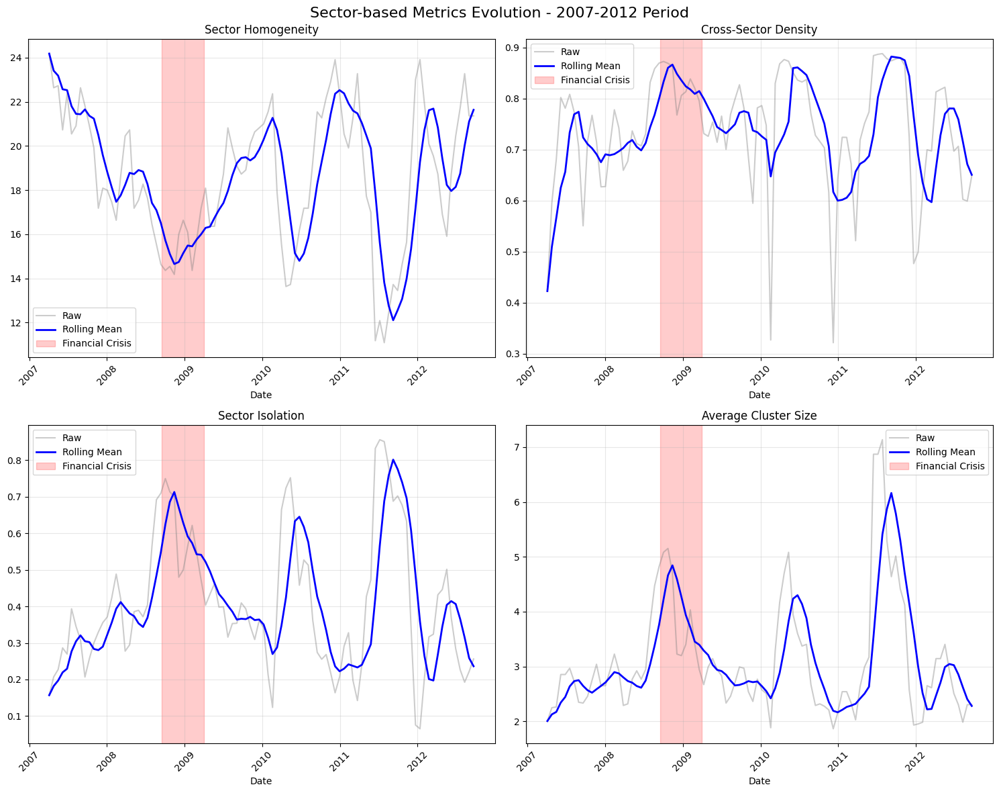


Analyzing sector evolution for 2018-2023 period...


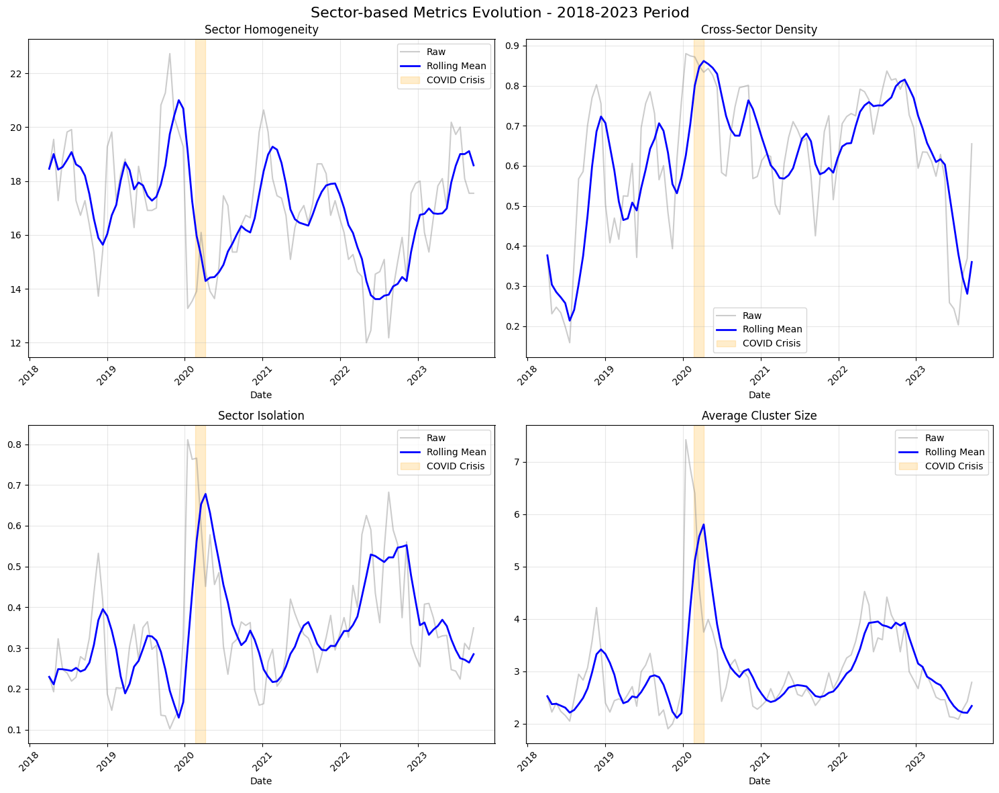


Cluster Size Statistics:

2007-2012 Period:
count    96.000000
mean      3.122774
std       1.083685
min       1.864322
25%       2.359318
50%       2.842954
75%       3.380463
max       7.134615
Name: avg_sector_size, dtype: float64

2018-2023 Period:
count    96.000000
mean      3.000484
std       0.937583
min       1.902564
25%       2.436801
50%       2.738045
75%       3.319961
max       7.420000
Name: avg_sector_size, dtype: float64


In [17]:
# %%
# Cell 13: Sector Analysis with Fixed Cluster Size Calculation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

def analyze_sector_evolution(networks, clusters, period_name):
    """
    Analyze the evolution of sector relationships and community structure
    """
    dates = sorted(networks.keys())
    sector_dict = dfsp500.set_index('Symbol')['Sector'].to_dict()
    
    # Initialize metrics storage
    metrics_data = {
        'date': [],
        'sector_homogeneity': [],
        'cross_sector_density': [],
        'sector_isolation': [],
        'avg_sector_size': []
    }
    
    for date in dates:
        G = networks[date]
        nodes = list(G.nodes())
        current_clusters = clusters[date]
        
        # Get sector assignments
        node_sectors = [sector_dict.get(node, 'Unknown') for node in nodes]
        unique_sectors = sorted(set(node_sectors))
        
        # 1. Sector Homogeneity
        homogeneity = 0
        n_sectors = 0
        for sector in unique_sectors:
            sector_nodes_idx = [i for i, s in enumerate(node_sectors) if s == sector]
            if len(sector_nodes_idx) > 0:
                sector_clusters = [current_clusters[i] for i in sector_nodes_idx]
                homogeneity += len(set(sector_clusters))
                n_sectors += 1
        avg_homogeneity = homogeneity / n_sectors if n_sectors > 0 else 0
        
        # 2. Cross-sector Density
        cross_edges = sum(1 for (i, j) in G.edges() 
                         if node_sectors[nodes.index(i)] != node_sectors[nodes.index(j)])
        total_edges = G.number_of_edges()
        cross_density = cross_edges / total_edges if total_edges > 0 else 0
        
        # 3. Sector Isolation
        isolation_scores = []
        for sector in unique_sectors:
            sector_nodes = [n for i, n in enumerate(nodes) if node_sectors[i] == sector]
            if len(sector_nodes) > 1:
                sector_subgraph = G.subgraph(sector_nodes)
                isolation_scores.append(nx.density(sector_subgraph))
        isolation = np.mean(isolation_scores) if isolation_scores else 0
        
        # 4. Average Cluster Size - Calculate based on actual clusters
        unique_clusters = np.unique(current_clusters)
        cluster_sizes = []
        for cluster_id in unique_clusters:
            cluster_size = sum(1 for c in current_clusters if c == cluster_id)
            cluster_sizes.append(cluster_size)
        avg_cluster_size = np.mean(cluster_sizes) if cluster_sizes else 0
        
        # Store metrics
        metrics_data['date'].append(pd.to_datetime(date))
        metrics_data['sector_homogeneity'].append(avg_homogeneity)
        metrics_data['cross_sector_density'].append(cross_density)
        metrics_data['sector_isolation'].append(isolation)
        metrics_data['avg_sector_size'].append(avg_cluster_size)
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame(metrics_data)
    metrics_df.set_index('date', inplace=True)
    
    # Create visualizations
    plot_sector_evolution(metrics_df, period_name)
    
    return metrics_df

def plot_sector_evolution(metrics_df, period_name):
    """
    Create visualizations for sector evolution analysis
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Sector-based Metrics Evolution - {period_name}', fontsize=16)
    
    metrics_to_plot = [
        ('sector_homogeneity', 'Sector Homogeneity'),
        ('cross_sector_density', 'Cross-Sector Density'),
        ('sector_isolation', 'Sector Isolation'),
        ('avg_sector_size', 'Average Cluster Size')  # Changed label
    ]
    
    for (metric, title), ax in zip(metrics_to_plot, axes.ravel()):
        # Plot raw data
        ax.plot(metrics_df.index, metrics_df[metric], 
                alpha=0.4, color='gray', label='Raw')
        
        # Plot rolling mean
        rolling_mean = metrics_df[metric].rolling(window=5, min_periods=1).mean()
        ax.plot(metrics_df.index, rolling_mean, 
                color='blue', linewidth=2, label='Rolling Mean')
        
        # Add crisis period highlight
        if '2007-2012' in period_name:
            crisis_start = pd.to_datetime('2008-09-15')
            crisis_end = pd.to_datetime('2009-03-31')
            ax.axvspan(crisis_start, crisis_end,
                      color='red', alpha=0.2, label='Financial Crisis')
        elif '2018-2023' in period_name:
            crisis_start = pd.to_datetime('2020-02-20')
            crisis_end = pd.to_datetime('2020-04-07')
            ax.axvspan(crisis_start, crisis_end,
                      color='orange', alpha=0.2, label='COVID Crisis')
        
        ax.set_title(title)
        ax.set_xlabel('Date')
        ax.grid(True, alpha=0.3)
        ax.legend()
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()

# Run analysis
print("Analyzing sector evolution for 2007-2012 period...")
metrics_2007_2012 = analyze_sector_evolution(
    networks1, clusters1, "2007-2012 Period")

print("\nAnalyzing sector evolution for 2018-2023 period...")
metrics_2018_2023 = analyze_sector_evolution(
    networks2, clusters2, "2018-2023 Period")

# Save results
results_dir = 'sector_analysis_results'
os.makedirs(results_dir, exist_ok=True)

metrics_2007_2012.to_csv(f'{results_dir}/sector_metrics_2007_2012.csv')
metrics_2018_2023.to_csv(f'{results_dir}/sector_metrics_2018_2023.csv')

# Print cluster size statistics
print("\nCluster Size Statistics:")
print("\n2007-2012 Period:")
print(metrics_2007_2012['avg_sector_size'].describe())
print("\n2018-2023 Period:")
print(metrics_2018_2023['avg_sector_size'].describe())

Analyzing Financial Crisis patterns...

Analyzing COVID Crisis patterns...

Plotting Financial Crisis evolution...


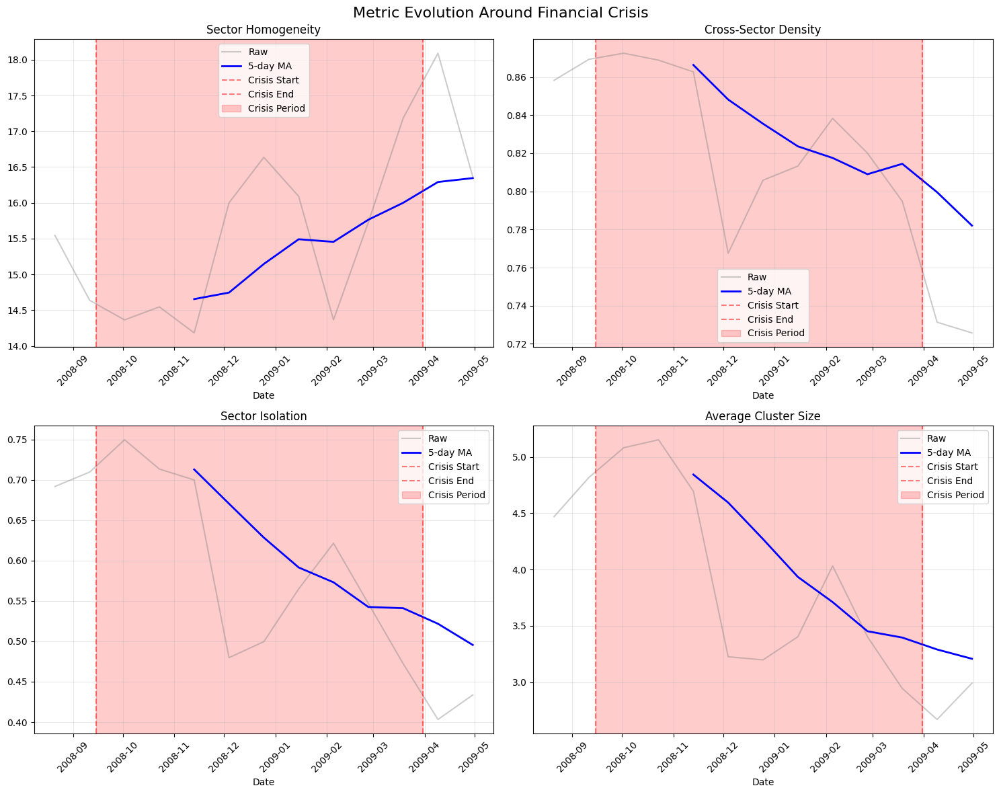


Plotting COVID Crisis evolution...


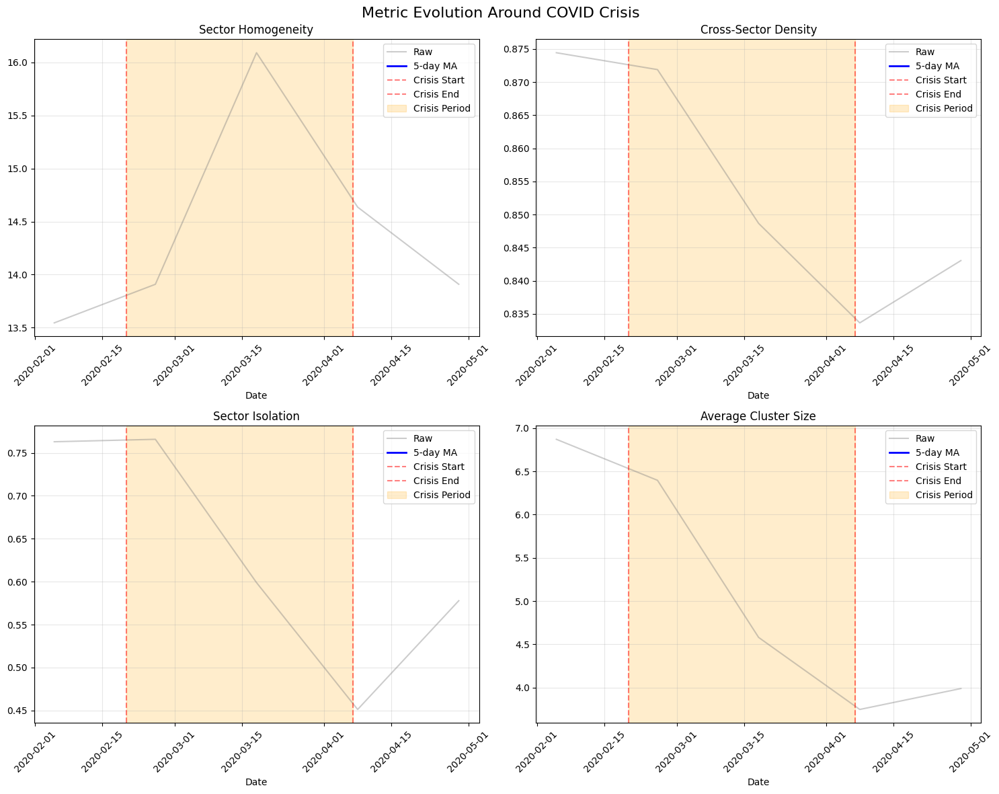


Creating crisis comparison...


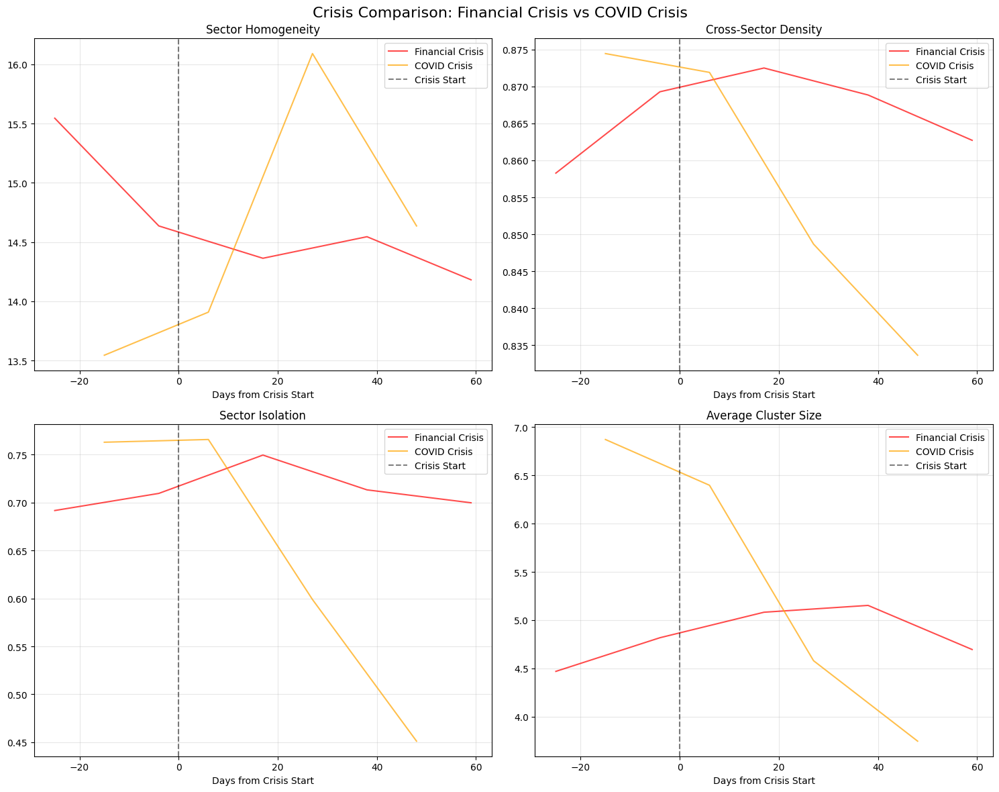


Crisis Pattern Summary:

Financial Crisis:

Pre Crisis:
sector_homogeneity:
  Mean: 15.091 (±0.643)
  Change: -5.8%
cross_sector_density:
  Mean: 0.864 (±0.008)
  Change: 1.3%
sector_isolation:
  Mean: 0.701 (±0.013)
  Change: 2.6%
avg_sector_size:
  Mean: 4.644 (±0.246)
  Change: 7.8%

During Crisis:
sector_homogeneity:
  Mean: 15.455 (±1.117)
  Change: 2.5%
cross_sector_density:
  Mean: 0.827 (±0.036)
  Change: -1.1%
sector_isolation:
  Mean: 0.594 (±0.106)
  Change: -4.6%
avg_sector_size:
  Mean: 3.904 (±0.864)
  Change: -5.5%

Post Crisis:
sector_homogeneity:
  Mean: 17.227 (±1.221)
  Change: -9.5%
cross_sector_density:
  Mean: 0.729 (±0.004)
  Change: -0.8%
sector_isolation:
  Mean: 0.418 (±0.021)
  Change: 7.5%
avg_sector_size:
  Mean: 2.831 (±0.228)
  Change: 12.1%

COVID Crisis:

Pre Crisis:
sector_homogeneity:
  Mean: 13.545 (±nan)
  Change: nan%
cross_sector_density:
  Mean: 0.874 (±nan)
  Change: nan%
sector_isolation:
  Mean: 0.763 (±nan)
  Change: nan%
avg_sector_size:
  

In [18]:
# %%
# Cell 14: Crisis Pattern Analysis and Early Warning Indicators
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_crisis_patterns(metrics_df, crisis_period, window_days=30):
    """
    Analyze patterns around crisis periods
    """
    crisis_start, crisis_end = crisis_period
    
    # Calculate date ranges
    pre_crisis_start = pd.DateOffset(days=-window_days)
    post_crisis_end = pd.DateOffset(days=window_days)
    
    # Extract periods
    pre_crisis = metrics_df[crisis_start + pre_crisis_start:crisis_start]
    during_crisis = metrics_df[crisis_start:crisis_end]
    post_crisis = metrics_df[crisis_end:crisis_end + post_crisis_end]
    
    patterns = {}
    for period, data in [('pre', pre_crisis), ('during', during_crisis), ('post', post_crisis)]:
        patterns[period] = {
            'mean': data.mean(),
            'std': data.std(),
            'max': data.max(),
            'min': data.min(),
            'change': data.pct_change().mean()
        }
    
    return patterns

def plot_crisis_evolution(metrics_df, crisis_period, period_name):
    """
    Plot the evolution of metrics around crisis periods
    """
    crisis_start, crisis_end = crisis_period
    window_days = 30
    
    # Create figure
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Metric Evolution Around {period_name}', fontsize=16)
    
    metrics = ['sector_homogeneity', 'cross_sector_density', 
               'sector_isolation', 'avg_sector_size']
    titles = ['Sector Homogeneity', 'Cross-Sector Density', 
              'Sector Isolation', 'Average Cluster Size']
    
    for (metric, title), ax in zip(zip(metrics, titles), axes.ravel()):
        # Get crisis window data
        mask = (metrics_df.index >= crisis_start - pd.DateOffset(days=window_days)) & \
               (metrics_df.index <= crisis_end + pd.DateOffset(days=window_days))
        data = metrics_df.loc[mask, metric]
        
        # Plot data
        ax.plot(data.index, data, label='Raw', alpha=0.4, color='gray')
        ax.plot(data.index, data.rolling(window=5).mean(), 
                label='5-day MA', color='blue', linewidth=2)
        
        # Add vertical lines for crisis period
        ax.axvline(crisis_start, color='r', linestyle='--', alpha=0.5, label='Crisis Start')
        ax.axvline(crisis_end, color='r', linestyle='--', alpha=0.5, label='Crisis End')
        
        # Highlight crisis period
        ax.axvspan(crisis_start, crisis_end, color='red' if 'Financial' in period_name else 'orange', 
                  alpha=0.2, label='Crisis Period')
        
        ax.set_title(title)
        ax.set_xlabel('Date')
        ax.grid(True, alpha=0.3)
        ax.legend()
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()

def compare_crises(metrics_2007_2012, metrics_2018_2023):
    """
    Compare patterns between Financial Crisis and COVID Crisis
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Crisis Comparison: Financial Crisis vs COVID Crisis', fontsize=16)
    
    metrics = ['sector_homogeneity', 'cross_sector_density', 
               'sector_isolation', 'avg_sector_size']
    titles = ['Sector Homogeneity', 'Cross-Sector Density', 
              'Sector Isolation', 'Average Cluster Size']
    
    # Normalize data to crisis start date for comparison
    financial_data = metrics_2007_2012.copy()
    covid_data = metrics_2018_2023.copy()
    
    financial_start = pd.to_datetime('2008-09-15')
    covid_start = pd.to_datetime('2020-02-20')
    
    for (metric, title), ax in zip(zip(metrics, titles), axes.ravel()):
        # Align data to day 0 (crisis start)
        fin_days = (financial_data.index - financial_start).days
        covid_days = (covid_data.index - covid_start).days
        
        # Plot data from -30 to +60 days around crisis start
        mask_fin = (fin_days >= -30) & (fin_days <= 60)
        mask_covid = (covid_days >= -30) & (covid_days <= 60)
        
        ax.plot(fin_days[mask_fin], 
                financial_data.loc[mask_fin, metric], 
                label='Financial Crisis', color='red', alpha=0.7)
        ax.plot(covid_days[mask_covid], 
                covid_data.loc[mask_covid, metric], 
                label='COVID Crisis', color='orange', alpha=0.7)
        
        ax.axvline(x=0, color='black', linestyle='--', alpha=0.5, label='Crisis Start')
        ax.set_title(title)
        ax.set_xlabel('Days from Crisis Start')
        ax.grid(True, alpha=0.3)
        ax.legend()
    
    plt.tight_layout()
    plt.show()

# Define crisis periods
financial_crisis = (pd.to_datetime('2008-09-15'), pd.to_datetime('2009-03-31'))
covid_crisis = (pd.to_datetime('2020-02-20'), pd.to_datetime('2020-04-07'))

# Analyze individual crisis patterns
print("Analyzing Financial Crisis patterns...")
fin_patterns = analyze_crisis_patterns(metrics_2007_2012, financial_crisis)

print("\nAnalyzing COVID Crisis patterns...")
covid_patterns = analyze_crisis_patterns(metrics_2018_2023, covid_crisis)

# Plot evolution around crisis periods
print("\nPlotting Financial Crisis evolution...")
plot_crisis_evolution(metrics_2007_2012, financial_crisis, "Financial Crisis")

print("\nPlotting COVID Crisis evolution...")
plot_crisis_evolution(metrics_2018_2023, covid_crisis, "COVID Crisis")

# Compare crises
print("\nCreating crisis comparison...")
compare_crises(metrics_2007_2012, metrics_2018_2023)

# Print summary statistics
print("\nCrisis Pattern Summary:")
periods = ['pre', 'during', 'post']
metrics = ['sector_homogeneity', 'cross_sector_density', 'sector_isolation', 'avg_sector_size']

print("\nFinancial Crisis:")
for period in periods:
    print(f"\n{period.title()} Crisis:")
    for metric in metrics:
        mean_val = fin_patterns[period]['mean'][metric]
        std_val = fin_patterns[period]['std'][metric]
        change_val = fin_patterns[period]['change'][metric]
        print(f"{metric}:")
        print(f"  Mean: {mean_val:.3f} (±{std_val:.3f})")
        print(f"  Change: {change_val:.1%}")

print("\nCOVID Crisis:")
for period in periods:
    print(f"\n{period.title()} Crisis:")
    for metric in metrics:
        mean_val = covid_patterns[period]['mean'][metric]
        std_val = covid_patterns[period]['std'][metric]
        change_val = covid_patterns[period]['change'][metric]
        print(f"{metric}:")
        print(f"  Mean: {mean_val:.3f} (±{std_val:.3f})")
        print(f"  Change: {change_val:.1%}")

Calculating stability metrics for 2007-2012 period...

Calculating stability metrics for 2018-2023 period...

Plotting stability evolution for 2007-2012 period...


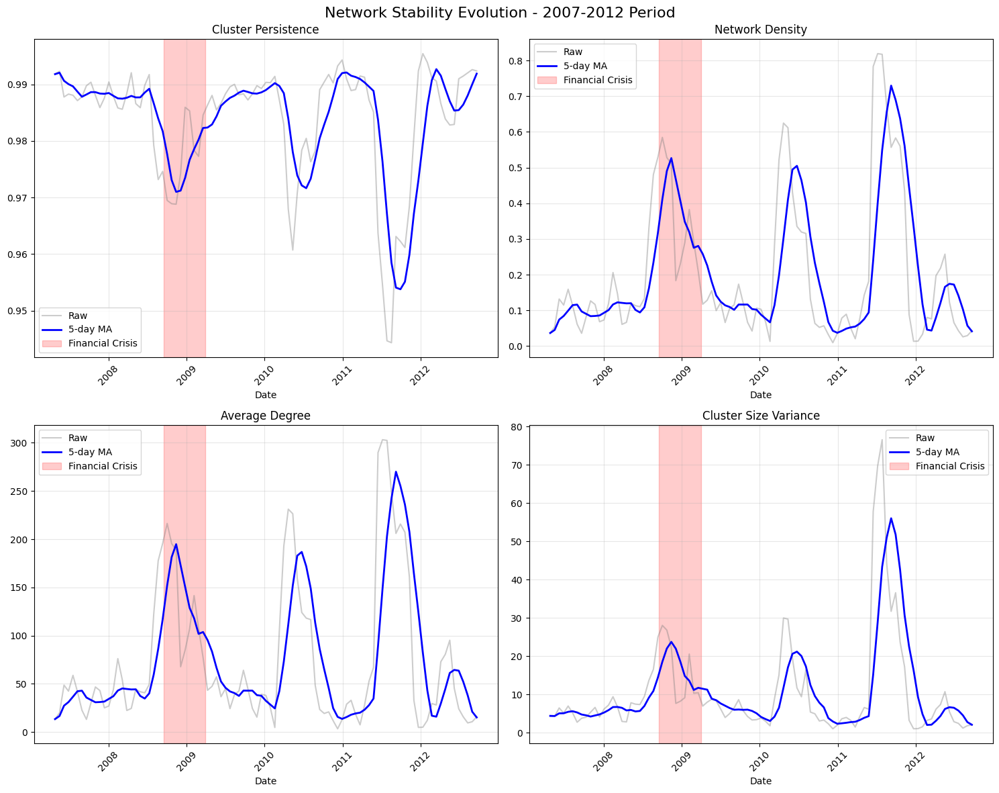


Plotting stability evolution for 2018-2023 period...


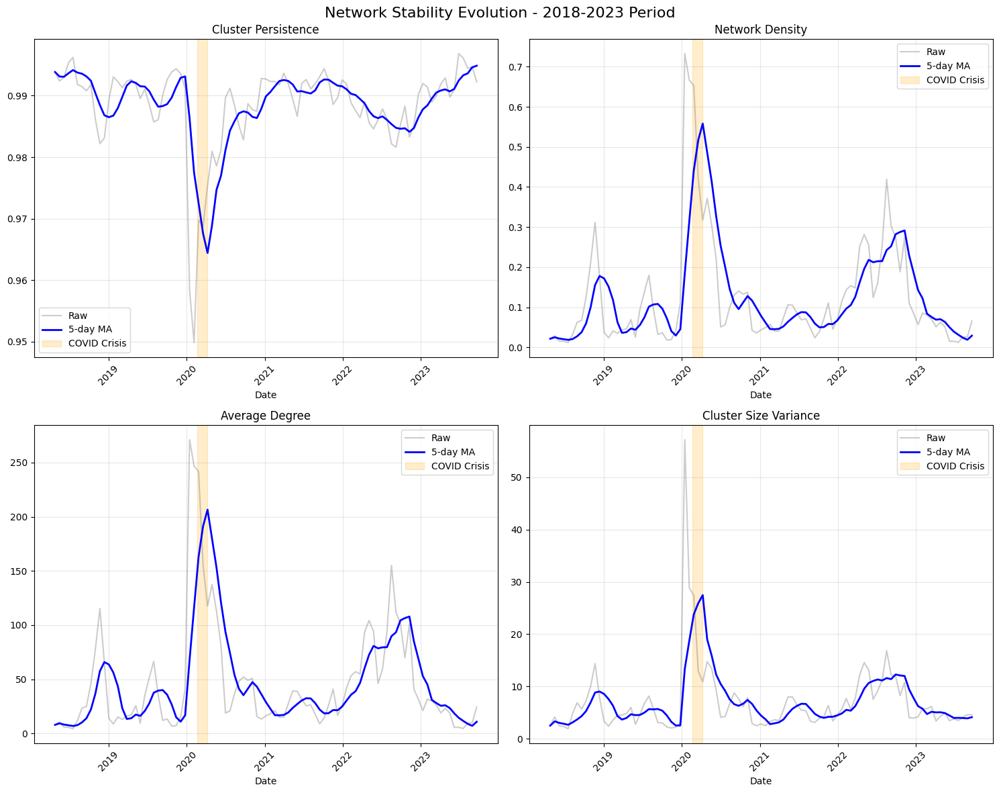


Comparing crisis periods...


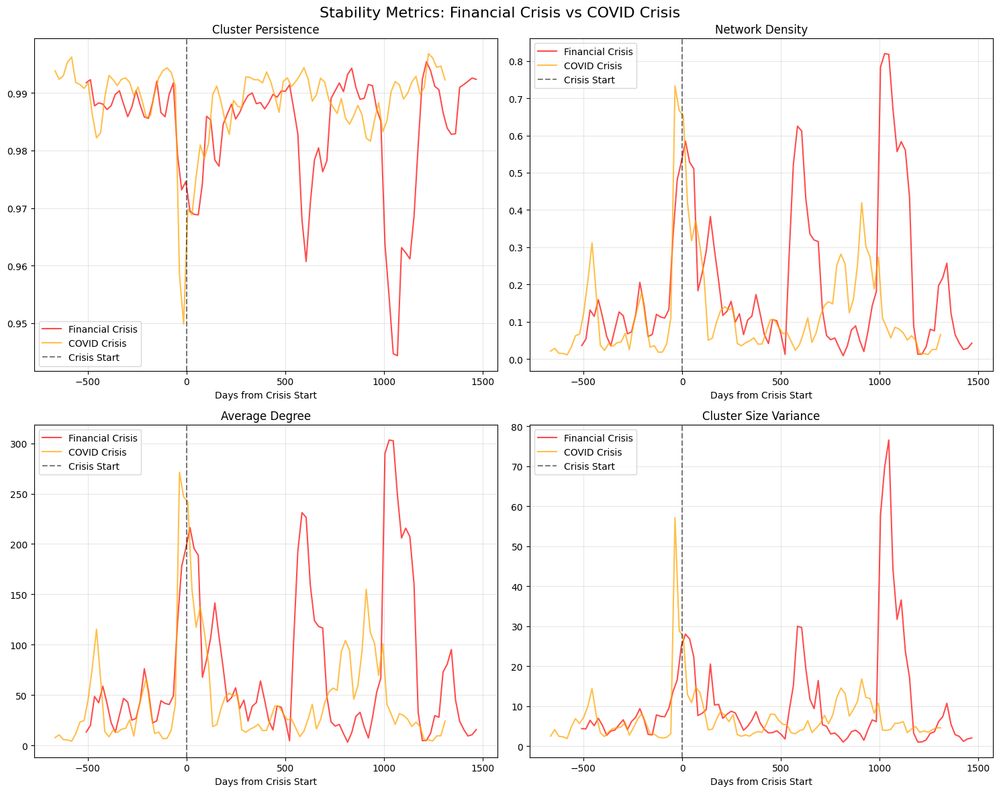


Stability Metrics Summary:

2007-2012 Period:

Mean Values:
cluster_persistence       0.983622
network_density           0.204037
avg_degree               75.493602
cluster_size_variance    10.707546
dtype: float64

Standard Deviations:
cluster_persistence       0.010567
network_density           0.204191
avg_degree               75.550615
cluster_size_variance    13.505795
dtype: float64

2018-2023 Period:

Mean Values:
cluster_persistence       0.988484
network_density           0.126124
avg_degree               46.665910
cluster_size_variance     7.096589
dtype: float64

Standard Deviations:
cluster_persistence       0.007151
network_density           0.139626
avg_degree               51.661483
cluster_size_variance     6.974248
dtype: float64

Crisis Impact Analysis:

Financial Crisis Crisis vs Non-Crisis:

cluster_persistence:
Crisis: 0.977
Non-Crisis: 0.984
% Change: -0.7%

network_density:
Crisis: 0.357
Non-Crisis: 0.188
% Change: 89.6%

avg_degree:
Crisis: 131.920
Non-Crisis: 

In [19]:
# %%
# Cell 15: Network Resilience and Stability Analysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

def calculate_stability_metrics(networks, clusters, period_name):
    """
    Calculate network stability metrics
    """
    dates = sorted(networks.keys())
    stability_metrics = {
        'date': [],
        'cluster_persistence': [],
        'network_density': [],
        'avg_degree': [],
        'cluster_size_variance': []
    }
    
    # Calculate baseline metrics for the first date
    prev_date = dates[0]
    prev_clusters = clusters[prev_date]
    prev_network = networks[prev_date]
    
    for date in dates[1:]:
        current_clusters = clusters[date]
        current_network = networks[date]
        
        # Calculate cluster persistence
        persistence = calculate_cluster_persistence(prev_clusters, current_clusters)
        
        # Calculate network metrics
        n_nodes = current_network.number_of_nodes()
        network_density = nx.density(current_network)
        avg_degree = np.mean([d for _, d in current_network.degree()])
        
        # Calculate cluster size variance
        unique_clusters = np.unique(current_clusters)
        cluster_sizes = [sum(1 for c in current_clusters if c == cluster_id) 
                        for cluster_id in unique_clusters]
        size_variance = np.var(cluster_sizes)
        
        # Store metrics
        stability_metrics['date'].append(pd.to_datetime(date))
        stability_metrics['cluster_persistence'].append(persistence)
        stability_metrics['network_density'].append(network_density)
        stability_metrics['avg_degree'].append(avg_degree)
        stability_metrics['cluster_size_variance'].append(size_variance)
        
        # Update previous state
        prev_clusters = current_clusters
        prev_network = current_network
    
    # Convert to DataFrame
    stability_df = pd.DataFrame(stability_metrics)
    stability_df.set_index('date', inplace=True)
    
    return stability_df

def calculate_cluster_persistence(prev_clusters, current_clusters):
    """
    Calculate how much cluster structure persists between consecutive time points
    """
    if len(prev_clusters) != len(current_clusters):
        return 0.0
    
    total_pairs = 0
    consistent_pairs = 0
    
    for i in range(len(prev_clusters)):
        for j in range(i+1, len(prev_clusters)):
            total_pairs += 1
            # Check if pair relationship (same/different cluster) is maintained
            prev_same = prev_clusters[i] == prev_clusters[j]
            curr_same = current_clusters[i] == current_clusters[j]
            if prev_same == curr_same:
                consistent_pairs += 1
    
    return consistent_pairs / total_pairs if total_pairs > 0 else 0.0

def plot_stability_evolution(stability_df, period_name):
    """
    Plot the evolution of stability metrics
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Network Stability Evolution - {period_name}', fontsize=16)
    
    metrics = [
        ('cluster_persistence', 'Cluster Persistence'),
        ('network_density', 'Network Density'),
        ('avg_degree', 'Average Degree'),
        ('cluster_size_variance', 'Cluster Size Variance')
    ]
    
    for (metric, title), ax in zip(metrics, axes.ravel()):
        # Plot raw data
        ax.plot(stability_df.index, stability_df[metric], 
                alpha=0.4, color='gray', label='Raw')
        
        # Plot rolling mean
        rolling_mean = stability_df[metric].rolling(window=5, min_periods=1).mean()
        ax.plot(stability_df.index, rolling_mean, 
                linewidth=2, color='blue', label='5-day MA')
        
        # Add crisis period highlight
        if '2007-2012' in period_name:
            crisis_start = pd.to_datetime('2008-09-15')
            crisis_end = pd.to_datetime('2009-03-31')
            ax.axvspan(crisis_start, crisis_end,
                      color='red', alpha=0.2, label='Financial Crisis')
        elif '2018-2023' in period_name:
            crisis_start = pd.to_datetime('2020-02-20')
            crisis_end = pd.to_datetime('2020-04-07')
            ax.axvspan(crisis_start, crisis_end,
                      color='orange', alpha=0.2, label='COVID Crisis')
        
        ax.set_title(title)
        ax.set_xlabel('Date')
        ax.grid(True, alpha=0.3)
        ax.legend()
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()

def compare_crisis_stability(stability_2007_2012, stability_2018_2023):
    """
    Compare stability patterns between crises
    """
    financial_crisis = (pd.to_datetime('2008-09-15'), pd.to_datetime('2009-03-31'))
    covid_crisis = (pd.to_datetime('2020-02-20'), pd.to_datetime('2020-04-07'))
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Stability Metrics: Financial Crisis vs COVID Crisis', fontsize=16)
    
    metrics = [
        ('cluster_persistence', 'Cluster Persistence'),
        ('network_density', 'Network Density'),
        ('avg_degree', 'Average Degree'),
        ('cluster_size_variance', 'Cluster Size Variance')
    ]
    
    for (metric, title), ax in zip(metrics, axes.ravel()):
        # Calculate days from crisis start
        fin_crisis_data = stability_2007_2012[metric]
        covid_crisis_data = stability_2018_2023[metric]
        
        fin_days = (fin_crisis_data.index - financial_crisis[0]).days
        covid_days = (covid_crisis_data.index - covid_crisis[0]).days
        
        # Plot data
        ax.plot(fin_days, fin_crisis_data.values, 
                label='Financial Crisis', color='red', alpha=0.7)
        ax.plot(covid_days, covid_crisis_data.values, 
                label='COVID Crisis', color='orange', alpha=0.7)
        
        ax.axvline(x=0, color='black', linestyle='--', alpha=0.5, label='Crisis Start')
        ax.set_title(title)
        ax.set_xlabel('Days from Crisis Start')
        ax.grid(True, alpha=0.3)
        ax.legend()
    
    plt.tight_layout()
    plt.show()

# Calculate stability metrics
print("Calculating stability metrics for 2007-2012 period...")
stability_2007_2012 = calculate_stability_metrics(networks1, clusters1, "2007-2012 Period")

print("\nCalculating stability metrics for 2018-2023 period...")
stability_2018_2023 = calculate_stability_metrics(networks2, clusters2, "2018-2023 Period")

# Plot stability evolution
print("\nPlotting stability evolution for 2007-2012 period...")
plot_stability_evolution(stability_2007_2012, "2007-2012 Period")

print("\nPlotting stability evolution for 2018-2023 period...")
plot_stability_evolution(stability_2018_2023, "2018-2023 Period")

# Compare crisis periods
print("\nComparing crisis periods...")
compare_crisis_stability(stability_2007_2012, stability_2018_2023)

# Print summary statistics
print("\nStability Metrics Summary:")
for period_name, metrics in [("2007-2012", stability_2007_2012), 
                           ("2018-2023", stability_2018_2023)]:
    print(f"\n{period_name} Period:")
    print("\nMean Values:")
    print(metrics.mean())
    print("\nStandard Deviations:")
    print(metrics.std())

# Calculate crisis vs non-crisis statistics
def print_crisis_stats(metrics_df, crisis_period, period_name):
    crisis_start, crisis_end = crisis_period
    crisis_mask = (metrics_df.index >= crisis_start) & (metrics_df.index <= crisis_end)
    
    crisis_stats = metrics_df[crisis_mask].mean()
    non_crisis_stats = metrics_df[~crisis_mask].mean()
    
    print(f"\n{period_name} Crisis vs Non-Crisis:")
    for metric in metrics_df.columns:
        print(f"\n{metric}:")
        print(f"Crisis: {crisis_stats[metric]:.3f}")
        print(f"Non-Crisis: {non_crisis_stats[metric]:.3f}")
        print(f"% Change: {((crisis_stats[metric] - non_crisis_stats[metric]) / non_crisis_stats[metric] * 100):.1f}%")

print("\nCrisis Impact Analysis:")
print_crisis_stats(stability_2007_2012, 
                  (pd.to_datetime('2008-09-15'), pd.to_datetime('2009-03-31')),
                  "Financial Crisis")
print_crisis_stats(stability_2018_2023,
                  (pd.to_datetime('2020-02-20'), pd.to_datetime('2020-04-07')),
                  "COVID Crisis")

Analyzing network topology for 2007-2012 period...


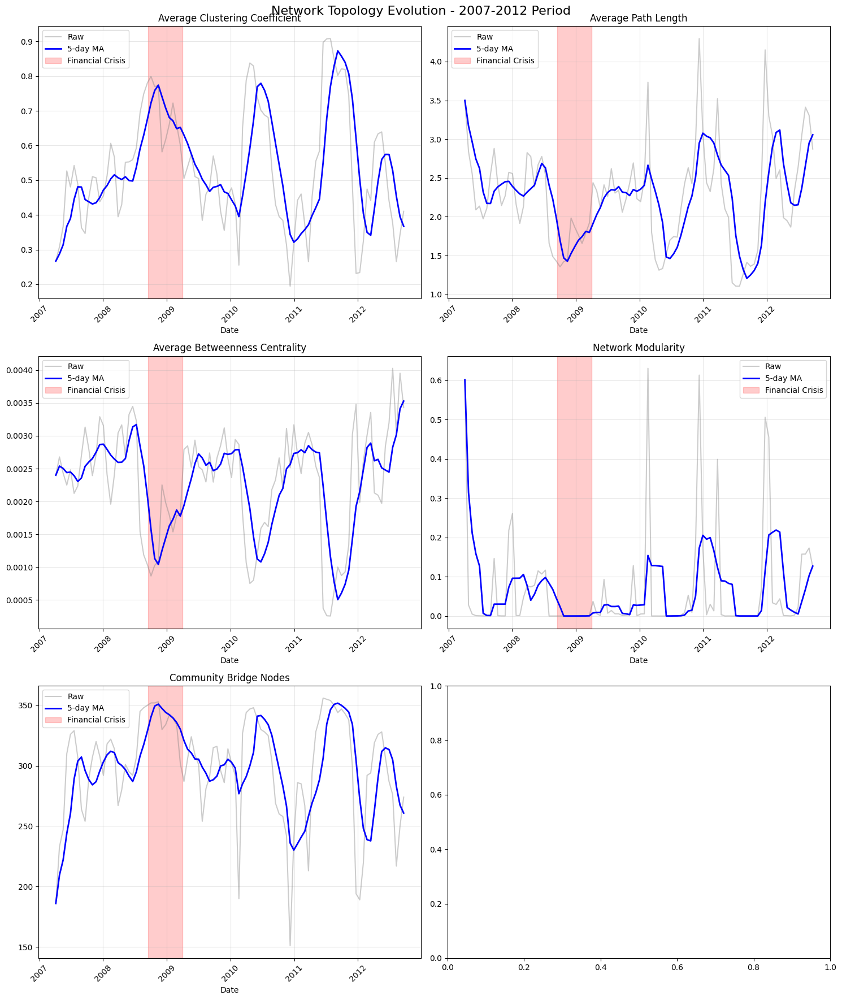


Analyzing network topology for 2018-2023 period...


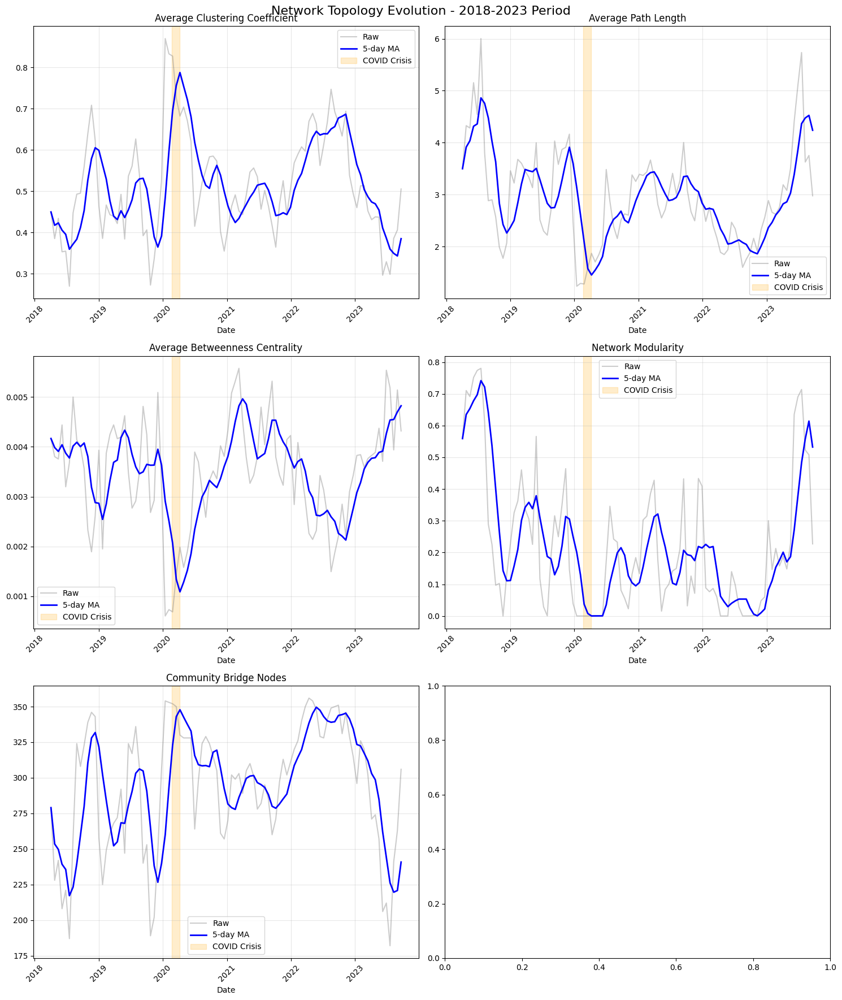


Analyzing critical nodes for 2007-2012 period...


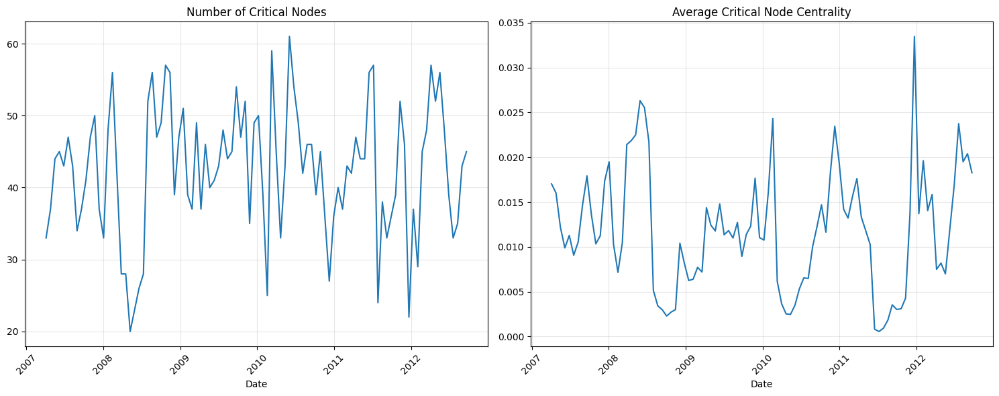


Analyzing critical nodes for 2018-2023 period...


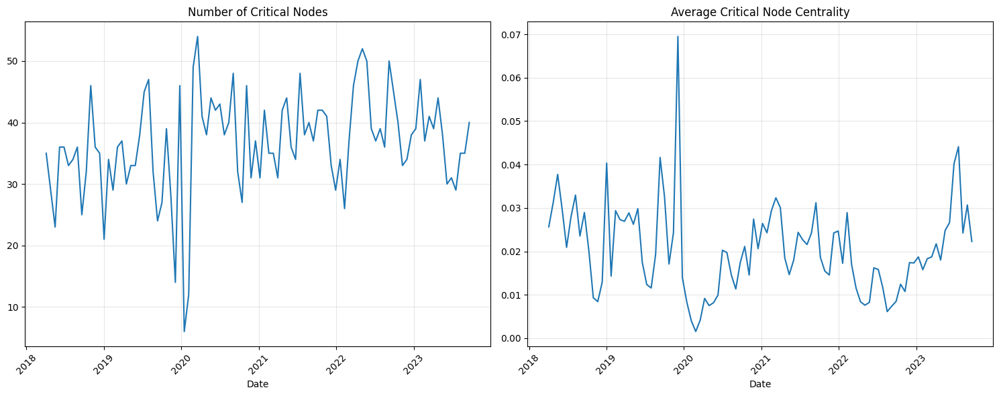


Topology Summary Statistics:

2007-2012 Period:
       clustering_coef  path_length  betweenness    modularity  \
count        96.000000    96.000000    96.000000  9.600000e+01   
mean          0.536188     2.261869     0.002298  6.344272e-02   
std           0.172796     0.651098     0.000841  1.362224e-01   
min           0.194399     1.104400     0.000258 -1.210143e-14   
25%           0.424954     1.793437     0.001794  1.112250e-04   
50%           0.511583     2.265303     0.002428  2.618382e-03   
75%           0.653341     2.608108     0.002872  5.696330e-02   
max           0.908264     4.296799     0.004027  6.304088e-01   

       community_bridges  
count          96.000000  
mean          298.927083  
std            44.044534  
min           151.000000  
25%           280.750000  
50%           307.000000  
75%           330.000000  
max           356.000000  

2018-2023 Period:
       clustering_coef  path_length  betweenness    modularity  \
count        96.000000    96

In [20]:
# %%
# Cell 16: Network Topology and Community Structure Analysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from collections import defaultdict

def analyze_network_topology(networks, clusters, period_name):
    """
    Analyze network topology and community structure evolution
    """
    topology_metrics = {
        'date': [],
        'clustering_coef': [],
        'path_length': [],
        'betweenness': [],
        'modularity': [],
        'community_bridges': []
    }
    
    for date in sorted(networks.keys()):
        G = networks[date]
        current_clusters = clusters[date]
        
        # Basic network metrics
        topology_metrics['date'].append(pd.to_datetime(date))
        
        # 1. Clustering Coefficient
        topology_metrics['clustering_coef'].append(nx.average_clustering(G))
        
        # 2. Average Path Length (for largest component if disconnected)
        if nx.is_connected(G):
            path_length = nx.average_shortest_path_length(G)
        else:
            largest_cc = max(nx.connected_components(G), key=len)
            path_length = nx.average_shortest_path_length(G.subgraph(largest_cc))
        topology_metrics['path_length'].append(path_length)
        
        # 3. Average Betweenness Centrality
        betweenness = nx.betweenness_centrality(G)
        topology_metrics['betweenness'].append(np.mean(list(betweenness.values())))
        
        # 4. Modularity (based on current clusters)
        cluster_dict = {node: cluster for node, cluster in zip(G.nodes(), current_clusters)}
        modularity = nx.community.modularity(G, 
                                           [set(nodes) for nodes in nx.community.label_propagation_communities(G)])
        topology_metrics['modularity'].append(modularity)
        
        # 5. Community Bridge Nodes
        bridge_count = count_bridge_nodes(G, current_clusters)
        topology_metrics['community_bridges'].append(bridge_count)
    
    # Convert to DataFrame
    topology_df = pd.DataFrame(topology_metrics)
    topology_df.set_index('date', inplace=True)
    
    # Plot evolution
    plot_topology_evolution(topology_df, period_name)
    
    return topology_df

def count_bridge_nodes(G, clusters):
    """
    Count nodes that connect different communities
    """
    bridge_nodes = 0
    for node in G.nodes():
        neighbors = list(G.neighbors(node))
        if neighbors:
            node_cluster = clusters[list(G.nodes()).index(node)]
            neighbor_clusters = [clusters[list(G.nodes()).index(n)] for n in neighbors]
            if len(set(neighbor_clusters)) > 1:  # Node connects multiple clusters
                bridge_nodes += 1
    return bridge_nodes

def plot_topology_evolution(topology_df, period_name):
    """
    Plot evolution of network topology metrics
    """
    fig, axes = plt.subplots(3, 2, figsize=(15, 18))
    fig.suptitle(f'Network Topology Evolution - {period_name}', fontsize=16)
    
    metrics = [
        ('clustering_coef', 'Average Clustering Coefficient'),
        ('path_length', 'Average Path Length'),
        ('betweenness', 'Average Betweenness Centrality'),
        ('modularity', 'Network Modularity'),
        ('community_bridges', 'Community Bridge Nodes')
    ]
    
    for idx, (metric, title) in enumerate(metrics):
        ax = axes[idx//2, idx%2]
        
        # Plot raw data
        ax.plot(topology_df.index, topology_df[metric], 
                alpha=0.4, color='gray', label='Raw')
        
        # Plot rolling mean
        rolling_mean = topology_df[metric].rolling(window=5, min_periods=1).mean()
        ax.plot(topology_df.index, rolling_mean, 
                linewidth=2, color='blue', label='5-day MA')
        
        # Add crisis period highlight
        if '2007-2012' in period_name:
            crisis_start = pd.to_datetime('2008-09-15')
            crisis_end = pd.to_datetime('2009-03-31')
            ax.axvspan(crisis_start, crisis_end,
                      color='red', alpha=0.2, label='Financial Crisis')
        elif '2018-2023' in period_name:
            crisis_start = pd.to_datetime('2020-02-20')
            crisis_end = pd.to_datetime('2020-04-07')
            ax.axvspan(crisis_start, crisis_end,
                      color='orange', alpha=0.2, label='COVID Crisis')
        
        ax.set_title(title)
        ax.set_xlabel('Date')
        ax.grid(True, alpha=0.3)
        ax.legend()
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()

def analyze_critical_nodes(networks, clusters, period_name):
    """
    Analyze the evolution of critical nodes in the network
    """
    critical_nodes_metrics = defaultdict(list)
    dates = []
    
    for date in sorted(networks.keys()):
        G = networks[date]
        current_clusters = clusters[date]
        
        # Identify high betweenness nodes
        betweenness = nx.betweenness_centrality(G)
        high_betweenness = {node: bc for node, bc in betweenness.items() 
                           if bc > np.mean(list(betweenness.values())) + np.std(list(betweenness.values()))}
        
        # Store metrics
        dates.append(pd.to_datetime(date))
        critical_nodes_metrics['num_critical_nodes'].append(len(high_betweenness))
        critical_nodes_metrics['avg_critical_centrality'].append(
            np.mean(list(high_betweenness.values())) if high_betweenness else 0
        )
    
    # Plot critical nodes evolution
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    plt.plot(dates, critical_nodes_metrics['num_critical_nodes'])
    plt.title('Number of Critical Nodes')
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    plt.plot(dates, critical_nodes_metrics['avg_critical_centrality'])
    plt.title('Average Critical Node Centrality')
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return pd.DataFrame(critical_nodes_metrics, index=dates)

# Analyze topology for both periods
print("Analyzing network topology for 2007-2012 period...")
topology_2007_2012 = analyze_network_topology(networks1, clusters1, "2007-2012 Period")

print("\nAnalyzing network topology for 2018-2023 period...")
topology_2018_2023 = analyze_network_topology(networks2, clusters2, "2018-2023 Period")

# Analyze critical nodes
print("\nAnalyzing critical nodes for 2007-2012 period...")
critical_2007_2012 = analyze_critical_nodes(networks1, clusters1, "2007-2012 Period")

print("\nAnalyzing critical nodes for 2018-2023 period...")
critical_2018_2023 = analyze_critical_nodes(networks2, clusters2, "2018-2023 Period")

# Print summary statistics
print("\nTopology Summary Statistics:")
for period_name, metrics in [("2007-2012", topology_2007_2012), 
                           ("2018-2023", topology_2018_2023)]:
    print(f"\n{period_name} Period:")
    print(metrics.describe())

# Save results
results_dir = 'network_topology_results'
os.makedirs(results_dir, exist_ok=True)

topology_2007_2012.to_csv(f'{results_dir}/topology_2007_2012.csv')
topology_2018_2023.to_csv(f'{results_dir}/topology_2018_2023.csv')
critical_2007_2012.to_csv(f'{results_dir}/critical_nodes_2007_2012.csv')
critical_2018_2023.to_csv(f'{results_dir}/critical_nodes_2018_2023.csv')

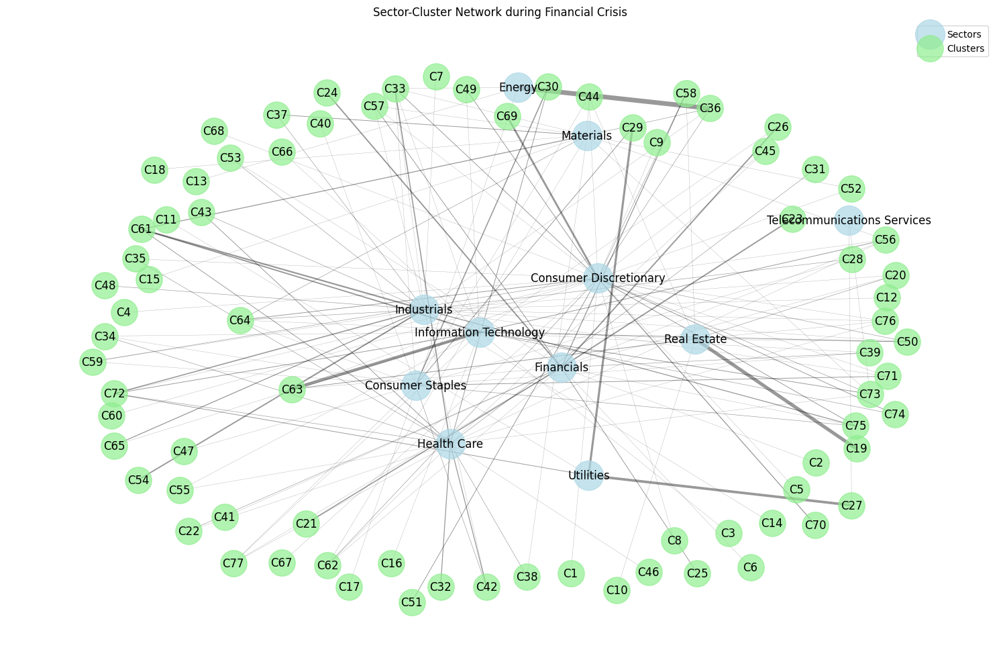

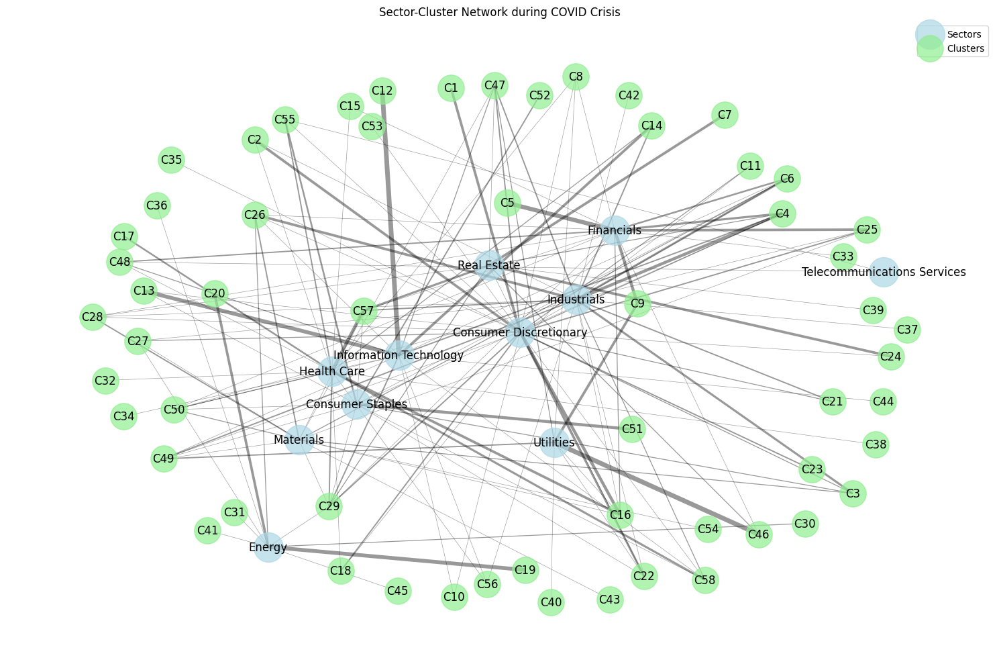

Analyzing sector-cluster relationships for 2007-2012 period...


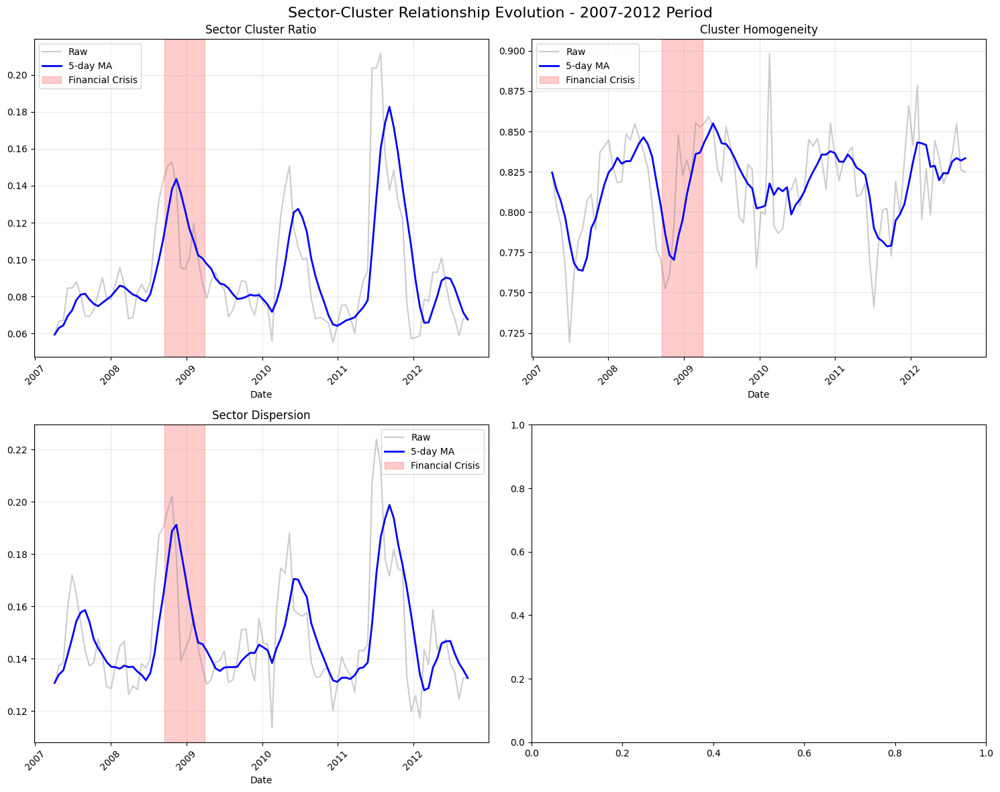


Analyzing sector-cluster relationships for 2018-2023 period...


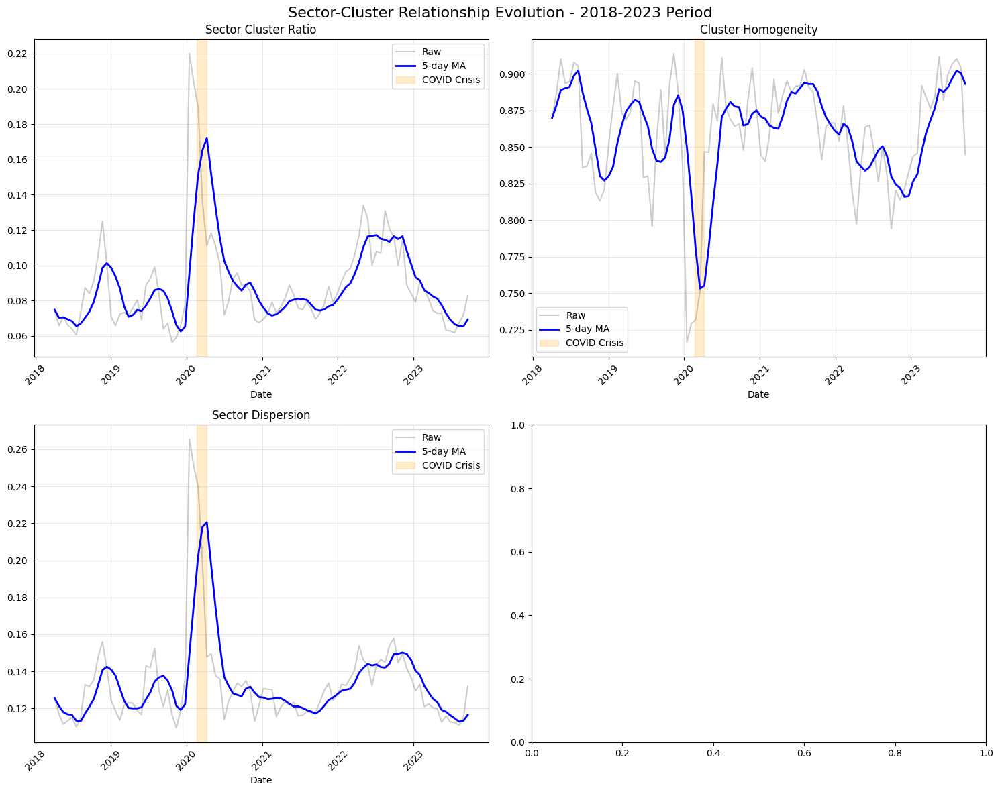


Relationship Metrics Summary:

2007-2012 Period:
       sector_cluster_ratio  cluster_homogeneity  sector_dispersion
count             96.000000            96.000000          96.000000
mean               0.092589             0.817458           0.148281
std                0.032131             0.030803           0.021803
min                0.055276             0.719243           0.113521
25%                0.069953             0.798343           0.133645
50%                0.084292             0.821301           0.141895
75%                0.100229             0.840346           0.157237
max                0.211538             0.898308           0.223906

2018-2023 Period:
       sector_cluster_ratio  cluster_homogeneity  sector_dispersion
count             96.000000            96.000000          96.000000
mean               0.088963             0.860025           0.133166
std                0.027799             0.039912           0.025752
min                0.056410             0.71638

In [21]:
# %%
# Cell 17: Sector-Cluster Network Visualization and Analysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns
from collections import defaultdict

def find_nearest_date(dates, target_date):
    """Find the nearest available date to the target date"""
    dates = pd.DatetimeIndex(dates)
    return dates[np.abs(dates - pd.to_datetime(target_date)).argmin()]

def create_sector_cluster_network(G, clusters, sector_dict):
    """
    Create a bipartite network of sectors and clusters
    """
    # Create bipartite network
    B = nx.Graph()
    
    # Get node sectors
    node_sectors = {node: sector_dict.get(node, 'Unknown') for node in G.nodes()}
    unique_sectors = set(node_sectors.values())
    unique_clusters = set(clusters)
    
    # Add nodes
    B.add_nodes_from(unique_sectors, bipartite=0)  # Sectors
    B.add_nodes_from([f'C{c}' for c in unique_clusters], bipartite=1)  # Clusters
    
    # Add edges based on number of stocks shared
    edge_weights = defaultdict(int)
    for node, sector in node_sectors.items():
        cluster = clusters[list(G.nodes()).index(node)]
        edge_weights[(sector, f'C{cluster}')] += 1
    
    # Add weighted edges to bipartite network
    for (sector, cluster), weight in edge_weights.items():
        B.add_edge(sector, cluster, weight=weight)
    
    return B

def visualize_sector_cluster_network(B, title):
    """
    Create visualization of sector-cluster network
    """
    plt.figure(figsize=(15, 10))
    
    # Create layout
    pos = nx.spring_layout(B, k=2)
    
    # Get node sets
    sectors = {node for node, attr in B.nodes(data=True) if attr.get('bipartite') == 0}
    clusters = {node for node, attr in B.nodes(data=True) if attr.get('bipartite') == 1}
    
    # Draw nodes
    nx.draw_networkx_nodes(B, pos, nodelist=sectors, node_color='lightblue', 
                          node_size=1000, alpha=0.7, label='Sectors')
    nx.draw_networkx_nodes(B, pos, nodelist=clusters, node_color='lightgreen',
                          node_size=800, alpha=0.7, label='Clusters')
    
    # Draw edges with weights
    edge_weights = [B[u][v]['weight'] for u, v in B.edges()]
    max_weight = max(edge_weights) if edge_weights else 1
    nx.draw_networkx_edges(B, pos, width=[w/max_weight*5 for w in edge_weights], 
                          alpha=0.4)
    
    # Add labels
    nx.draw_networkx_labels(B, pos)
    
    plt.title(title)
    plt.legend()
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def analyze_sector_cluster_relationships(networks, clusters, period_name):
    """
    Analyze evolution of sector-cluster relationships
    """
    sector_dict = dfsp500.set_index('Symbol')['Sector'].to_dict()
    dates = sorted(networks.keys())
    
    # Initialize metrics
    relationship_metrics = {
        'date': [],
        'sector_cluster_ratio': [],
        'cluster_homogeneity': [],
        'sector_dispersion': []
    }
    
    for date in dates:
        G = networks[date]
        current_clusters = clusters[date]
        
        # Calculate metrics
        n_sectors = len({sector_dict.get(node, 'Unknown') for node in G.nodes()})
        n_clusters = len(set(current_clusters))
        
        # Calculate cluster homogeneity
        cluster_homogeneity = []
        for cluster_id in set(current_clusters):
            cluster_nodes = [node for node, c in zip(G.nodes(), current_clusters) if c == cluster_id]
            if cluster_nodes:
                sector_counts = defaultdict(int)
                for node in cluster_nodes:
                    sector = sector_dict.get(node, 'Unknown')
                    sector_counts[sector] += 1
                max_sector_count = max(sector_counts.values())
                homogeneity = max_sector_count / len(cluster_nodes)
                cluster_homogeneity.append(homogeneity)
        
        # Calculate sector dispersion
        sector_dispersion = []
        for sector in set(sector_dict.values()):
            sector_nodes = [node for node in G.nodes() if sector_dict.get(node) == sector]
            if sector_nodes:
                sector_clusters = set(current_clusters[list(G.nodes()).index(node)] 
                                   for node in sector_nodes)
                dispersion = len(sector_clusters) / n_clusters
                sector_dispersion.append(dispersion)
        
        # Store metrics
        relationship_metrics['date'].append(pd.to_datetime(date))
        relationship_metrics['sector_cluster_ratio'].append(n_sectors / n_clusters)
        relationship_metrics['cluster_homogeneity'].append(np.mean(cluster_homogeneity))
        relationship_metrics['sector_dispersion'].append(np.mean(sector_dispersion))
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame(relationship_metrics)
    metrics_df.set_index('date', inplace=True)
    
    # Plot evolution of metrics
    plot_relationship_metrics(metrics_df, period_name)
    
    return metrics_df

def plot_relationship_metrics(metrics_df, period_name):
    """
    Plot evolution of sector-cluster relationship metrics
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Sector-Cluster Relationship Evolution - {period_name}', fontsize=16)
    
    metrics = list(metrics_df.columns)
    
    for metric, ax in zip(metrics, axes.ravel()):
        # Plot raw data
        ax.plot(metrics_df.index, metrics_df[metric], 
                alpha=0.4, color='gray', label='Raw')
        
        # Plot rolling mean
        rolling_mean = metrics_df[metric].rolling(window=5, min_periods=1).mean()
        ax.plot(metrics_df.index, rolling_mean, 
                linewidth=2, color='blue', label='5-day MA')
        
        # Add crisis period highlight
        if '2007-2012' in period_name:
            crisis_start = pd.to_datetime('2008-09-15')
            crisis_end = pd.to_datetime('2009-03-31')
            ax.axvspan(crisis_start, crisis_end,
                      color='red', alpha=0.2, label='Financial Crisis')
        elif '2018-2023' in period_name:
            crisis_start = pd.to_datetime('2020-02-20')
            crisis_end = pd.to_datetime('2020-04-07')
            ax.axvspan(crisis_start, crisis_end,
                      color='orange', alpha=0.2, label='COVID Crisis')
        
        ax.set_title(metric.replace('_', ' ').title())
        ax.set_xlabel('Date')
        ax.grid(True, alpha=0.3)
        ax.legend()
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()

# Find key dates near crisis events
fin_dates = sorted(networks1.keys())
covid_dates = sorted(networks2.keys())

# Define crisis dates
crisis_dates = {
    'Financial Crisis': pd.to_datetime('2008-09-15'),
    'COVID Crisis': pd.to_datetime('2020-02-20')
}

# Get nearest available dates
analysis_dates = {
    'Financial Crisis': find_nearest_date(fin_dates, crisis_dates['Financial Crisis']),
    'COVID Crisis': find_nearest_date(covid_dates, crisis_dates['COVID Crisis'])
}

# Create visualizations for crisis dates
sector_dict = dfsp500.set_index('Symbol')['Sector'].to_dict()

for crisis_name, date in analysis_dates.items():
    if 'Financial' in crisis_name:
        G = networks1[date]
        current_clusters = clusters1[date]
    else:
        G = networks2[date]
        current_clusters = clusters2[date]
    
    B = create_sector_cluster_network(G, current_clusters, sector_dict)
    visualize_sector_cluster_network(B, f'Sector-Cluster Network during {crisis_name}')

# Analyze relationships over time
print("Analyzing sector-cluster relationships for 2007-2012 period...")
relationships_2007_2012 = analyze_sector_cluster_relationships(
    networks1, clusters1, "2007-2012 Period")

print("\nAnalyzing sector-cluster relationships for 2018-2023 period...")
relationships_2018_2023 = analyze_sector_cluster_relationships(
    networks2, clusters2, "2018-2023 Period")

# Save results
results_dir = 'sector_cluster_results'
os.makedirs(results_dir, exist_ok=True)

relationships_2007_2012.to_csv(f'{results_dir}/relationships_2007_2012.csv')
relationships_2018_2023.to_csv(f'{results_dir}/relationships_2018_2023.csv')

# Print summary statistics
print("\nRelationship Metrics Summary:")
for period_name, metrics in [("2007-2012", relationships_2007_2012), 
                           ("2018-2023", relationships_2018_2023)]:
    print(f"\n{period_name} Period:")
    print(metrics.describe())

Analyzing community dynamics for 2007-2012 period...


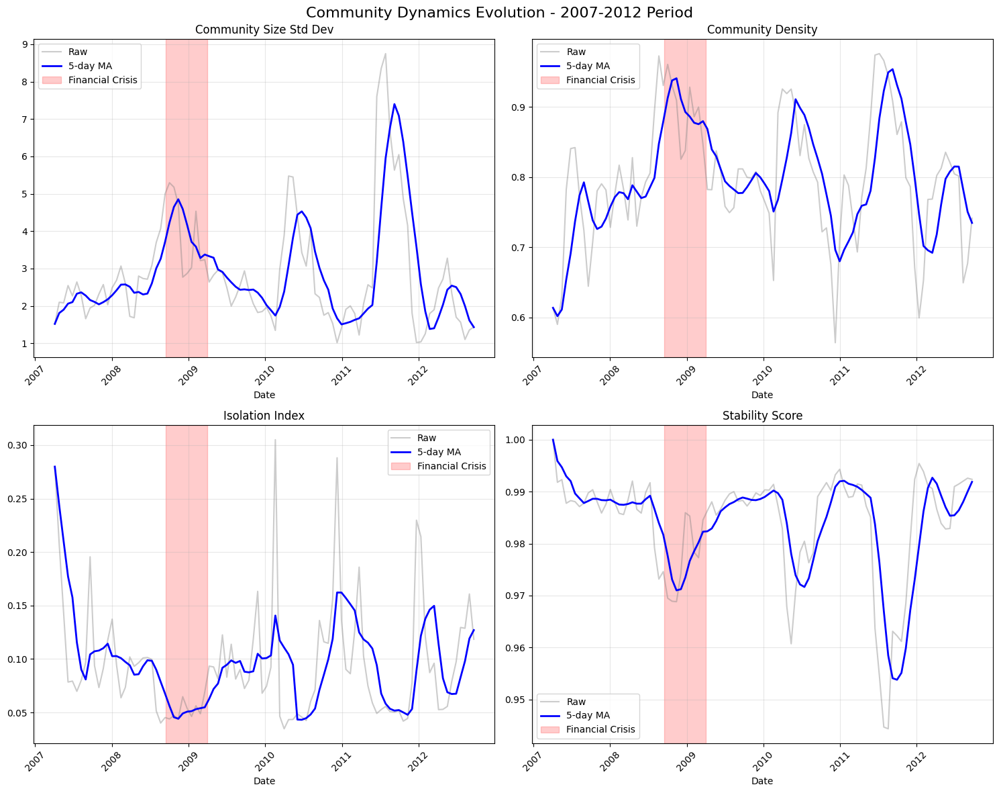


Analyzing community dynamics for 2018-2023 period...


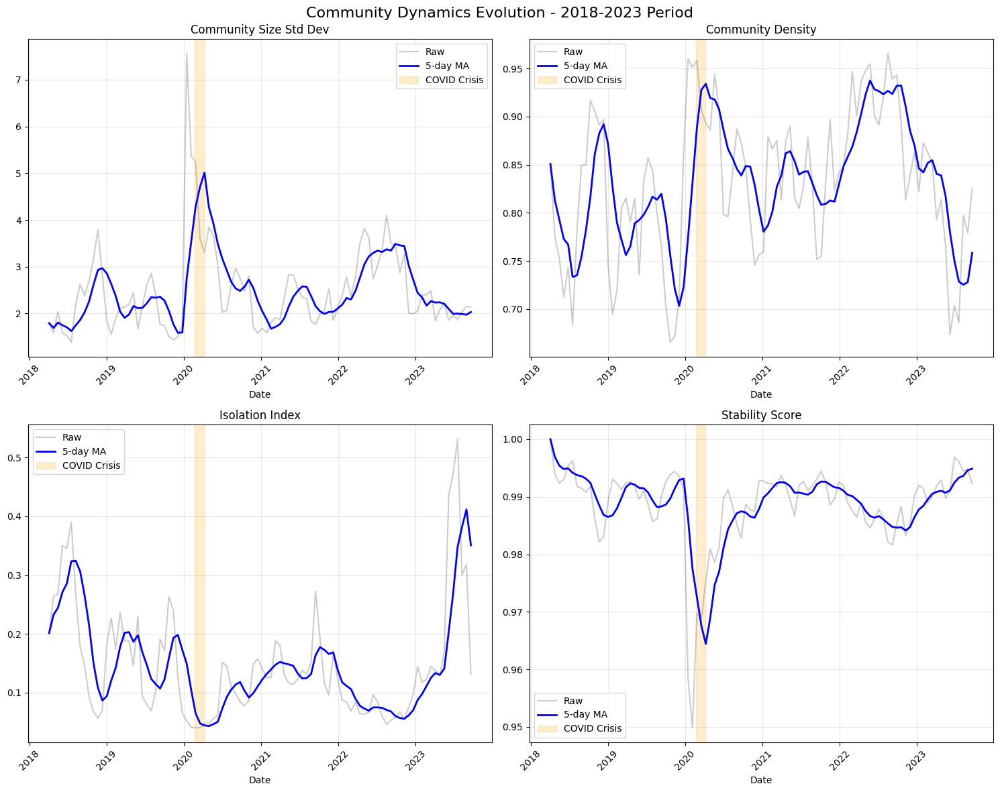


Analyzing Financial Crisis impact...

Analyzing COVID Crisis impact...

Community Dynamics During Financial Crisis:

Pre-Crisis:
Mean values:
community_size_std    2.550304
community_density     0.772052
isolation_index       0.104071
stability_score       0.987535
dtype: float64

Standard deviations:
community_size_std    0.779390
community_density     0.090120
isolation_index       0.052989
stability_score       0.005361
dtype: float64

During Crisis:
Mean values:
community_size_std    3.871472
community_density     0.891744
isolation_index       0.052723
stability_score       0.976986
dtype: float64

Standard deviations:
community_size_std    1.041590
community_density     0.046519
isolation_index       0.009108
stability_score       0.007114
dtype: float64

Post-Crisis:
Mean values:
community_size_std    2.670811
community_density     0.794415
isolation_index       0.099346
stability_score       0.985165
dtype: float64

Standard deviations:
community_size_std    1.092812
community

In [22]:
# %%
# Cell 18: Dynamic Community Structure and Resilience Analysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from collections import defaultdict

def analyze_community_dynamics(networks, clusters, period_name):
    """
    Analyze the dynamics of community structure over time
    """
    dates = sorted(networks.keys())
    
    dynamics_metrics = {
        'date': [],
        'community_size_std': [],  # Standard deviation of community sizes
        'community_density': [],   # Internal density of communities
        'isolation_index': [],     # How well communities are separated
        'stability_score': []      # Stability compared to previous timestep
    }
    
    prev_clusters = None
    for date in dates:
        G = networks[date]
        current_clusters = clusters[date]
        
        # Get cluster sizes
        cluster_sizes = defaultdict(int)
        for c in current_clusters:
            cluster_sizes[c] += 1
        
        # Calculate metrics
        # 1. Community Size Standard Deviation
        size_std = np.std(list(cluster_sizes.values()))
        
        # 2. Community Density
        densities = []
        for cluster_id in set(current_clusters):
            nodes = [node for i, node in enumerate(G.nodes()) if current_clusters[i] == cluster_id]
            if len(nodes) > 1:
                subgraph = G.subgraph(nodes)
                densities.append(nx.density(subgraph))
        avg_density = np.mean(densities) if densities else 0
        
        # 3. Isolation Index
        isolation = calculate_isolation_index(G, current_clusters)
        
        # 4. Stability Score
        if prev_clusters is not None:
            stability = calculate_stability_score(prev_clusters, current_clusters)
        else:
            stability = 1.0
        
        # Store metrics
        dynamics_metrics['date'].append(pd.to_datetime(date))
        dynamics_metrics['community_size_std'].append(size_std)
        dynamics_metrics['community_density'].append(avg_density)
        dynamics_metrics['isolation_index'].append(isolation)
        dynamics_metrics['stability_score'].append(stability)
        
        prev_clusters = current_clusters
    
    # Convert to DataFrame
    dynamics_df = pd.DataFrame(dynamics_metrics)
    dynamics_df.set_index('date', inplace=True)
    
    # Plot evolution
    plot_community_dynamics(dynamics_df, period_name)
    
    return dynamics_df

def calculate_isolation_index(G, clusters):
    """
    Calculate how well communities are separated from each other
    """
    internal_edges = 0
    external_edges = 0
    
    for edge in G.edges():
        node1, node2 = edge
        idx1 = list(G.nodes()).index(node1)
        idx2 = list(G.nodes()).index(node2)
        
        if clusters[idx1] == clusters[idx2]:
            internal_edges += 1
        else:
            external_edges += 1
    
    total_edges = internal_edges + external_edges
    return internal_edges / total_edges if total_edges > 0 else 0

def calculate_stability_score(prev_clusters, current_clusters):
    """
    Calculate stability score between consecutive timesteps
    """
    if len(prev_clusters) != len(current_clusters):
        return 0.0
    
    matches = sum(1 for i in range(len(prev_clusters))
                 for j in range(i+1, len(prev_clusters))
                 if (prev_clusters[i] == prev_clusters[j]) == 
                    (current_clusters[i] == current_clusters[j]))
    
    total = (len(prev_clusters) * (len(prev_clusters) - 1)) // 2
    return matches / total if total > 0 else 0

def plot_community_dynamics(dynamics_df, period_name):
    """
    Plot evolution of community dynamics metrics
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Community Dynamics Evolution - {period_name}', fontsize=16)
    
    metrics = [
        ('community_size_std', 'Community Size Std Dev'),
        ('community_density', 'Community Density'),
        ('isolation_index', 'Isolation Index'),
        ('stability_score', 'Stability Score')
    ]
    
    for (metric, title), ax in zip(metrics, axes.ravel()):
        # Plot raw data
        ax.plot(dynamics_df.index, dynamics_df[metric], 
                alpha=0.4, color='gray', label='Raw')
        
        # Plot rolling mean
        rolling_mean = dynamics_df[metric].rolling(window=5, min_periods=1).mean()
        ax.plot(dynamics_df.index, rolling_mean, 
                linewidth=2, color='blue', label='5-day MA')
        
        # Add crisis period highlight
        if '2007-2012' in period_name:
            crisis_start = pd.to_datetime('2008-09-15')
            crisis_end = pd.to_datetime('2009-03-31')
            ax.axvspan(crisis_start, crisis_end,
                      color='red', alpha=0.2, label='Financial Crisis')
        elif '2018-2023' in period_name:
            crisis_start = pd.to_datetime('2020-02-20')
            crisis_end = pd.to_datetime('2020-04-07')
            ax.axvspan(crisis_start, crisis_end,
                      color='orange', alpha=0.2, label='COVID Crisis')
        
        ax.set_title(title)
        ax.set_xlabel('Date')
        ax.grid(True, alpha=0.3)
        ax.legend()
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()

def analyze_crisis_impact(dynamics_df, crisis_period):
    """
    Analyze the impact of crisis on community structure
    """
    crisis_start, crisis_end = crisis_period
    
    # Define periods
    pre_crisis = dynamics_df.loc[:crisis_start].iloc[-30:]  # 30 days before crisis
    during_crisis = dynamics_df.loc[crisis_start:crisis_end]
    post_crisis = dynamics_df.loc[crisis_end:].iloc[:30]    # 30 days after crisis
    
    # Calculate statistics for each period
    periods = {'Pre-Crisis': pre_crisis, 'During Crisis': during_crisis, 'Post-Crisis': post_crisis}
    stats = {}
    
    for period_name, data in periods.items():
        stats[period_name] = {
            'mean': data.mean(),
            'std': data.std(),
            'min': data.min(),
            'max': data.max()
        }
    
    return stats

# Run analysis for both periods
print("Analyzing community dynamics for 2007-2012 period...")
dynamics_2007_2012 = analyze_community_dynamics(networks1, clusters1, "2007-2012 Period")

print("\nAnalyzing community dynamics for 2018-2023 period...")
dynamics_2018_2023 = analyze_community_dynamics(networks2, clusters2, "2018-2023 Period")

# Analyze crisis impacts
financial_crisis = (pd.to_datetime('2008-09-15'), pd.to_datetime('2009-03-31'))
covid_crisis = (pd.to_datetime('2020-02-20'), pd.to_datetime('2020-04-07'))

print("\nAnalyzing Financial Crisis impact...")
fin_crisis_stats = analyze_crisis_impact(dynamics_2007_2012, financial_crisis)

print("\nAnalyzing COVID Crisis impact...")
covid_crisis_stats = analyze_crisis_impact(dynamics_2018_2023, covid_crisis)

# Print detailed statistics
print("\nCommunity Dynamics During Financial Crisis:")
for period, stats in fin_crisis_stats.items():
    print(f"\n{period}:")
    print("Mean values:")
    print(stats['mean'])
    print("\nStandard deviations:")
    print(stats['std'])

print("\nCommunity Dynamics During COVID Crisis:")
for period, stats in covid_crisis_stats.items():
    print(f"\n{period}:")
    print("Mean values:")
    print(stats['mean'])
    print("\nStandard deviations:")
    print(stats['std'])

# Save results
results_dir = 'community_dynamics_results'
os.makedirs(results_dir, exist_ok=True)

dynamics_2007_2012.to_csv(f'{results_dir}/dynamics_2007_2012.csv')
dynamics_2018_2023.to_csv(f'{results_dir}/dynamics_2018_2023.csv')